In [2]:
import logging
from utility import add_project_root_to_path
from pprint import pprint

logging.basicConfig(level=logging.ERROR)

add_project_root_to_path()

In [2]:
# Building experiments configs

from experiments.configs import DEFAULT_UNINFORMED_USERS_CONFIG
from experiments.experiment import Experiment
from user.informed_user import InformedUser

from fee_algorithm.fixed_fee import FixedFee
from fee_algorithm.discrete_fee_perfect_oracle import DiscreteFeePerfectOracle
from fee_algorithm.based_on_trade_count_fee import BasedOnTradeCountFee
from fee_algorithm.adaptive_fee_based_on_block_price_move import (
    AdaptiveBasedOnPreviousBlockPriceMoveFee,
)
from experiments.run_multiple_experiments import (
    get_experiment_key,
)
from fee_algorithm.dynamic_fee_amm_for_amm import AMMforAMMfee
from fee_algorithm.improved_fees.piecewise_fee import PiecewiseFee
from fee_algorithm.improved_fees.fixed_fee import ImprovedFixedFee

from copy import deepcopy

fee_algos_to_consider = {
    "fixed_fee": FixedFee(exchange_fee_rate=0.003),  # 30 bps
    "based_on_trade_count_fee": BasedOnTradeCountFee(
        a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
    ),  # 30 bps
    "adaptive_based_on_previous_block_price_move_fee": AdaptiveBasedOnPreviousBlockPriceMoveFee(
        a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
    ),  # 30 bps
    "discrete_fee_perfect_oracle": DiscreteFeePerfectOracle(
        fee_rate_in_arbitrage_direction=0.0045,
        fee_rate_in_non_arbitrage_direction=0.0015,
    ),  # 45/15 bps
    "AMM_fee": AMMforAMMfee(
        a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
    ),
    "IMPROVED_FX_fee": ImprovedFixedFee(),
    "IMPROVED_DA_fee": PiecewiseFee(
        base_algorithm=BasedOnTradeCountFee(
            a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
        )
    ),
    "IMPROVED_BA_fee": PiecewiseFee(
        base_algorithm=AdaptiveBasedOnPreviousBlockPriceMoveFee(
            a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
        )
    ),
    "IMPROVED_AMM_fee": PiecewiseFee(
        base_algorithm=AMMforAMMfee(
            a_to_b_exchange_fee_rate=0.003, b_to_a_exchange_fee_rate=0.003
        )
    ),
    "IMPROVED_OB_fee": PiecewiseFee(
        base_algorithm=DiscreteFeePerfectOracle(
            fee_rate_in_arbitrage_direction=0.0045,
            fee_rate_in_non_arbitrage_direction=0.0015,
        )
    ),
}

In [3]:
from pathlib import Path

# Pairs grouped by type. Each entry: (csv_file_prefix, display_name).
#
# Group 1: stable/stable  – both assets are USD stablecoins
# Group 2: non-stable/stable  – two volatile assets, both priced in USDT
# Group 3: non-stable/non-stable – two volatile assets (different from group 2
#           but also USDT-priced; all downloaded at 12 s cadence)
PAIRS_BY_GROUP = {
    "stable_stable": [
        ("TUSDUSDT_USDCUSDT", "TUSD/USDC"),
        ("TUSDUSDT_USDPUSDT", "TUSD/USDP"),
        ("USDCUSDT_USDPUSDT", "USDC/USDP"),
    ],
    "non_stable_stable": [
        ("BTCUSDT_ETHUSDT", "BTC/ETH"),
        ("BTCUSDT_BNBUSDT", "BTC/BNB"),
        ("ETHUSDT_BNBUSDT", "ETH/BNB"),
    ],
    "non_stable_non_stable": [
        ("BTCUSDT_ETHUSDT", "ETH/BTC"),
        ("ETHUSDT_BNBUSDT", "BNB/ETH"),
        ("DOGEUSDT_BTCUSDT", "DOGE/BTC"),
    ],
}

MONTHS = ["2024-03", "2024-04", "2024-08", "2024-11"]
MONTH_ALIAS = {
    "2024-03": "volatile_market",
    "2024-04": "bear_market",
    "2024-08": "calm_market",
    "2024-11": "bull_market",
}

DATA_DIR = Path("data/new_data")

# Flat mapping:  period_alias  ->  metadata dict
DATA_SOURCE_BY_ALIAS = {}
for _group_name, _pairs in PAIRS_BY_GROUP.items():
    for _csv_prefix, _pair_name in _pairs:
        for _month in MONTHS:
            _alias = f"{_pair_name} {MONTH_ALIAS[_month]}"
            DATA_SOURCE_BY_ALIAS[_alias] = {
                "csv_path": DATA_DIR / f"{_csv_prefix}-12s-{_month}.csv",
                "group": _group_name,
                "pair": _pair_name,
                "month": _month,
                "period_alias": MONTH_ALIAS[_month],
            }

print(f"Total period aliases: {len(DATA_SOURCE_BY_ALIAS)}")
for _alias, _src in list(DATA_SOURCE_BY_ALIAS.items())[:4]:
    print(f"  {_alias!r} -> {_src['csv_path']}")

Total period aliases: 36
  'TUSD/USDC volatile_market' -> data/new_data/TUSDUSDT_USDCUSDT-12s-2024-03.csv
  'TUSD/USDC bear_market' -> data/new_data/TUSDUSDT_USDCUSDT-12s-2024-04.csv
  'TUSD/USDC calm_market' -> data/new_data/TUSDUSDT_USDCUSDT-12s-2024-08.csv
  'TUSD/USDC bull_market' -> data/new_data/TUSDUSDT_USDCUSDT-12s-2024-11.csv


In [4]:
experiment_configs = {}

for period_alias, source in DATA_SOURCE_BY_ALIAS.items():
    for fee_algo_alias, fee_algo in fee_algos_to_consider.items():
        experiment_configs[
            get_experiment_key(
                {
                    "period_alias": period_alias,
                    "fee_algorithm": fee_algo_alias,
                }
            )
        ] = (
            str(source["csv_path"]),
            Experiment(
                data=None,
                fee_algorithm=deepcopy(fee_algo),
                uninformed_users=deepcopy(DEFAULT_UNINFORMED_USERS_CONFIG),
                informed_user=InformedUser(),
                lp_metrics_price_source="pool",
            ),
        )

In [5]:
print(f"Total experiments to run: {len(experiment_configs)}")

Total experiments to run: 360


In [ ]:
from concurrent.futures import ProcessPoolExecutor, as_completed
from tqdm import tqdm
from experiments.run_experiment_from_csv import run_experiment_from_csv

# Use only the first 7 days of each monthly CSV (12 s candles).
# 7 days × 24 h × 3600 s / 12 s = 50 400 rows — comparable in scale to
# the 7-day 1-min segments used in fee_algorithms_comparison.ipynb.
FIRST_WEEK_ROWS = 7 * 24 * 3600 // 12  # = 50 400

# Keep only every N-th snapshot for time-series plots to avoid OOM.
# 720 steps × 12 s = one data point per ~2.4 hours (~70 points per week).
SNAPSHOT_EVERY_N = 720

experiment_results = {}

with ProcessPoolExecutor(max_workers=10) as executor:
    future_to_key = {
        executor.submit(
            run_experiment_from_csv,
            csv_path,
            experiment,
            True,  # return_intermediate_results
            FIRST_WEEK_ROWS,  # max_rows – first week only
            SNAPSHOT_EVERY_N,  # snapshot_every_n – subsample to save memory
        ): key
        for key, (csv_path, experiment) in experiment_configs.items()
    }
    for future in tqdm(
        as_completed(future_to_key),
        total=len(future_to_key),
        desc="Running Experiments",
    ):
        key = future_to_key[future]
        try:
            experiment_results[key] = future.result()
        except Exception as e:
            print(f"Error: {e}  key={dict(key)}")

Running Experiments:  99%|█████████▉| 356/360 [03:34<00:01,  3.35it/s]

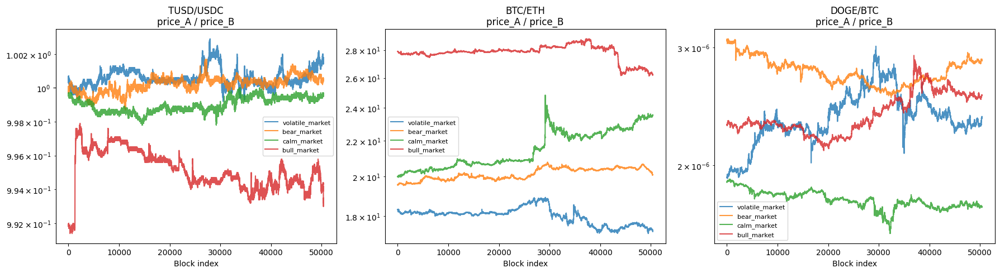

In [ ]:
import matplotlib.pyplot as plt

# Price ratio chart – one representative pair per group
SAMPLE_PAIRS = {
    "stable_stable": "TUSD/USDC",
    "non_stable_stable": "BTC/ETH",
    "non_stable_non_stable": "DOGE/BTC",
}

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, (group, pair_name) in zip(axes, SAMPLE_PAIRS.items()):
    for month_alias in MONTH_ALIAS.values():
        alias = f"{pair_name} {month_alias}"
        key = get_experiment_key({"period_alias": alias, "fee_algorithm": "fixed_fee"})
        if key not in experiment_results:
            continue
        data = experiment_results[key].data
        ratio = data["price_A"] / data["price_B"]
        ax.plot(ratio.values, label=month_alias, alpha=0.8)
    ax.set_title(f"{pair_name}\nprice_A / price_B")
    ax.set_xlabel("Block index")
    ax.set_yscale("log")
    ax.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [ ]:
from visualizations.compare_fee_algoritms import (
    plot_participants_markouts,
    plot_impermanent_loss,
    get_experiments_summary_by_alias,
)


def plot_results_for_period(period_alias: str, fee_algos: list[str]):
    map_by_fee_algo = {
        fee_algo_alias: experiment_results[
            get_experiment_key(
                {
                    "period_alias": period_alias,
                    "fee_algorithm": fee_algo_alias,
                }
            )
        ]
        for fee_algo_alias in fee_algos
        if get_experiment_key(
            {"period_alias": period_alias, "fee_algorithm": fee_algo_alias}
        )
        in experiment_results
    }
    plot_participants_markouts(period_alias, map_by_fee_algo)
    plot_impermanent_loss(period_alias, map_by_fee_algo)
    summary = get_experiments_summary_by_alias(map_by_fee_algo)
    display(summary)

### Results: Stable / Stable

#### TUSD/USDC

##### bull_market

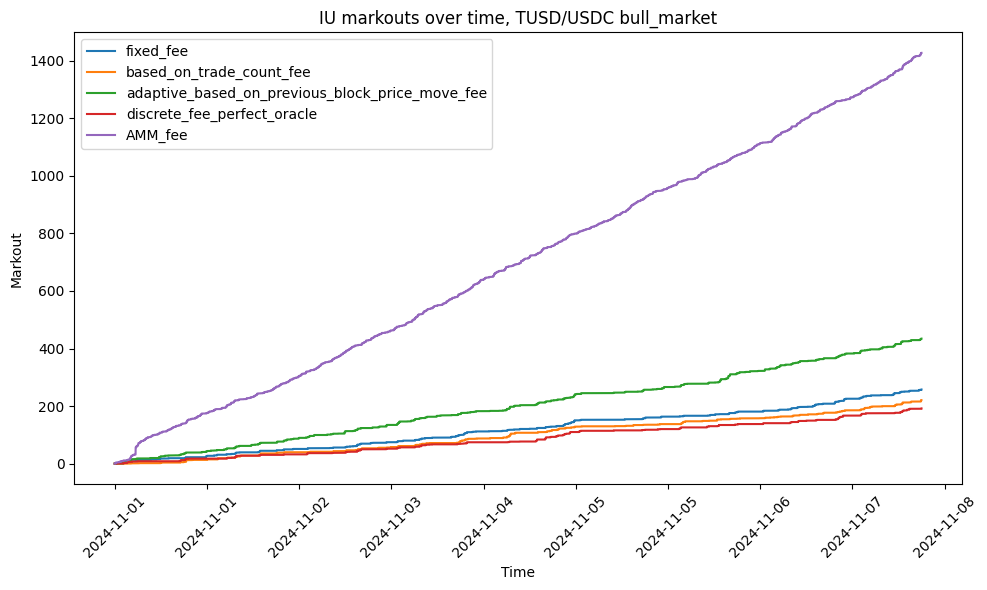

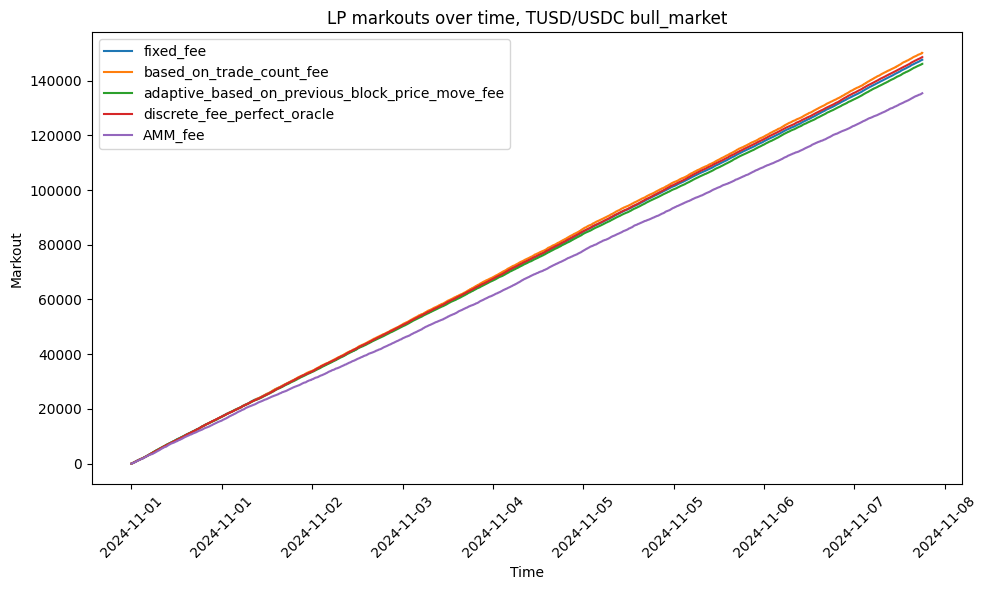

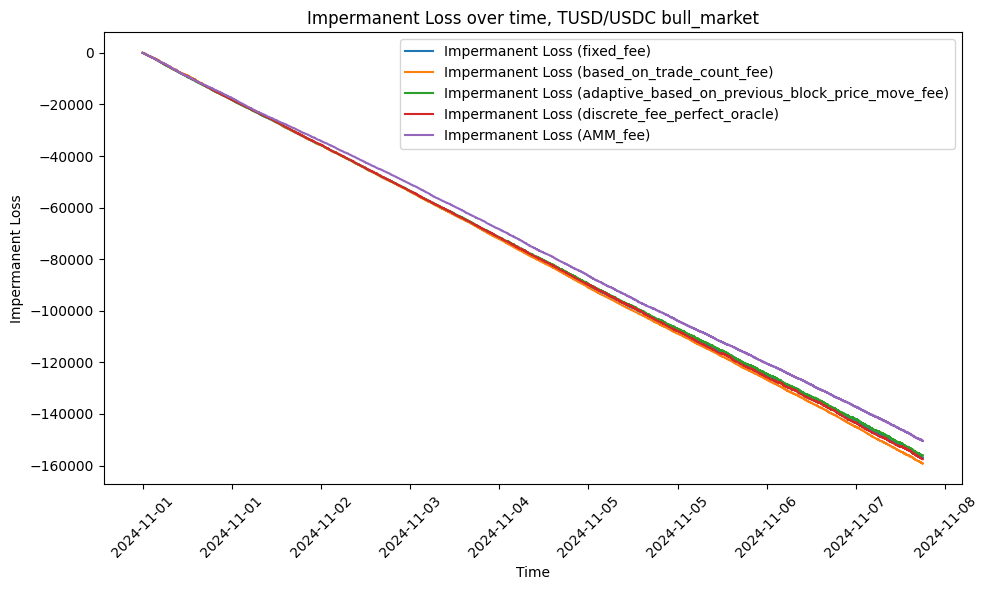

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,257.70,227,1.30,-283863.16,25105,-56.53,147632.52,28.28,-156955.45
1,based_on_trade_count_fee,220.41,209,1.21,-285896.49,25085,-56.99,150131.58,28.88,-159237.72
2,adaptive_based_on_previous_block_price_move_fee,434.53,326,1.50,-283702.20,25119,-56.45,146146.79,27.50,-156137.71
3,discrete_fee_perfect_oracle,191.93,160,1.36,-283785.17,25044,-56.65,148578.83,28.85,-157541.83
4,AMM_fee,1427.62,1163,1.39,-283193.50,25120,-56.37,135373.40,22.38,-150375.04


In [ ]:
plot_results_for_period(
    "TUSD/USDC bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

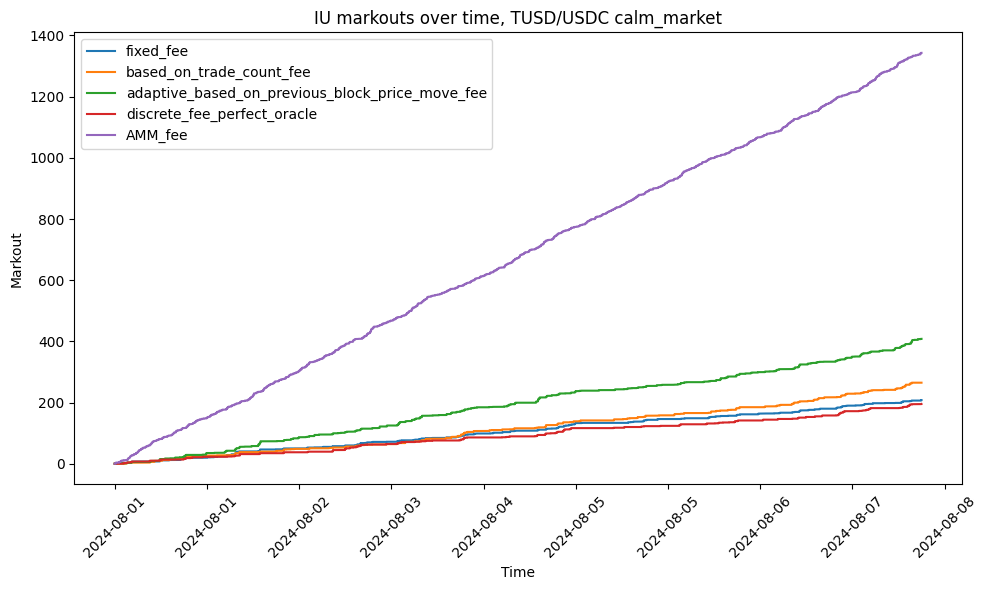

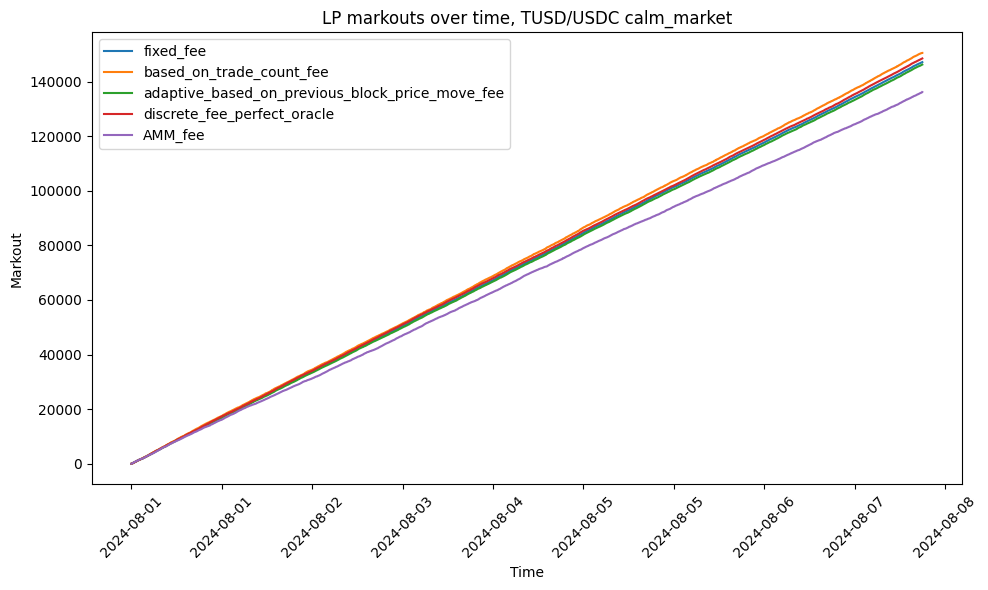

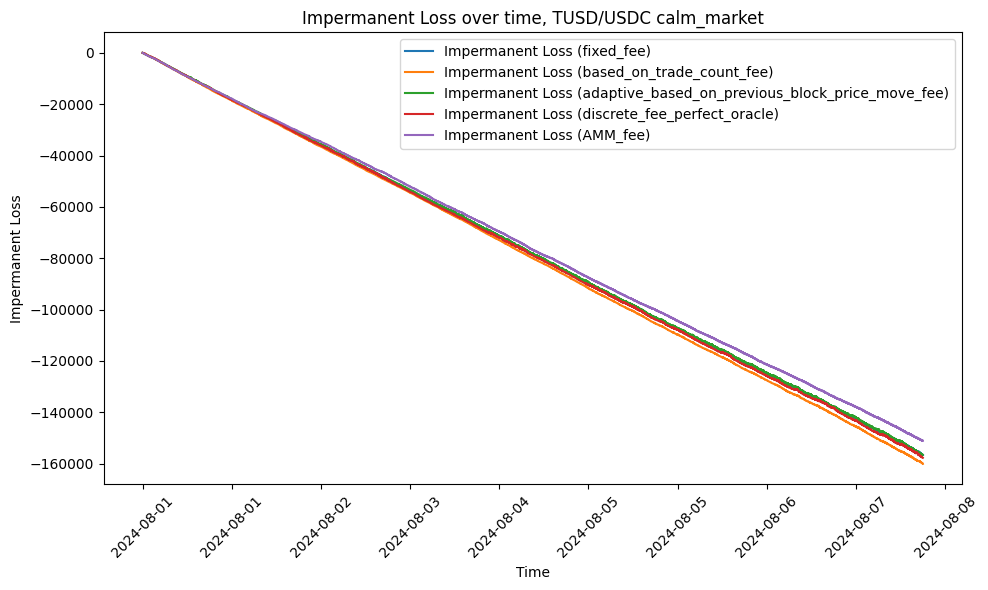

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,208.16,212,1.13,-283139.86,25093,-56.46,147104.50,28.30,-156633.85
1,based_on_trade_count_fee,264.89,219,1.37,-286748.24,25128,-57.11,150485.08,28.86,-160065.29
2,adaptive_based_on_previous_block_price_move_fee,408.17,330,1.40,-284277.18,25163,-56.51,146204.38,27.47,-156640.00
3,discrete_fee_perfect_oracle,195.19,166,1.34,-283621.51,25031,-56.69,148443.15,28.83,-157747.64
4,AMM_fee,1343.17,1145,1.34,-283044.62,25007,-56.64,136112.46,22.68,-151150.33


In [ ]:
plot_results_for_period(
    "TUSD/USDC calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

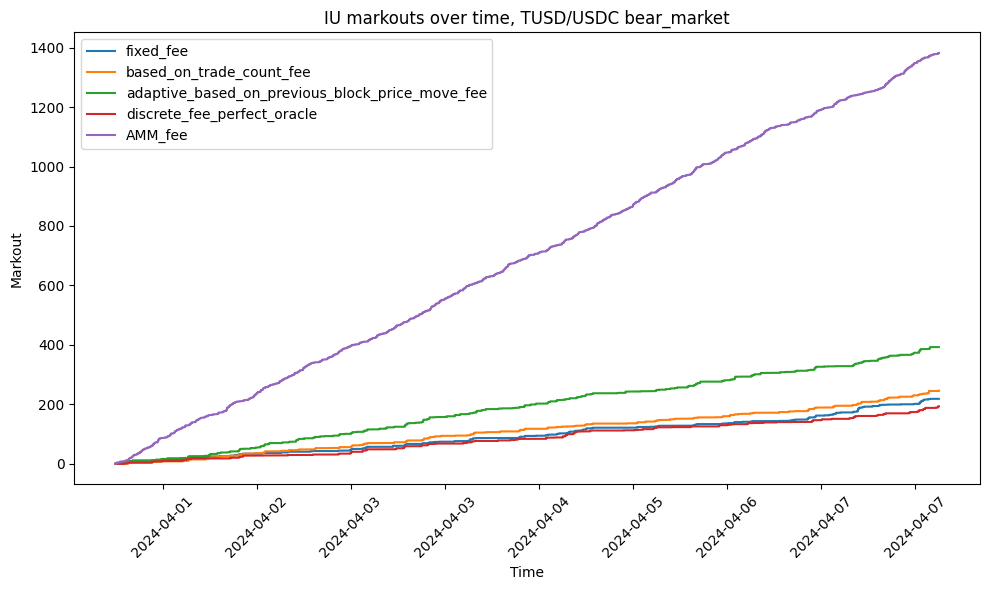

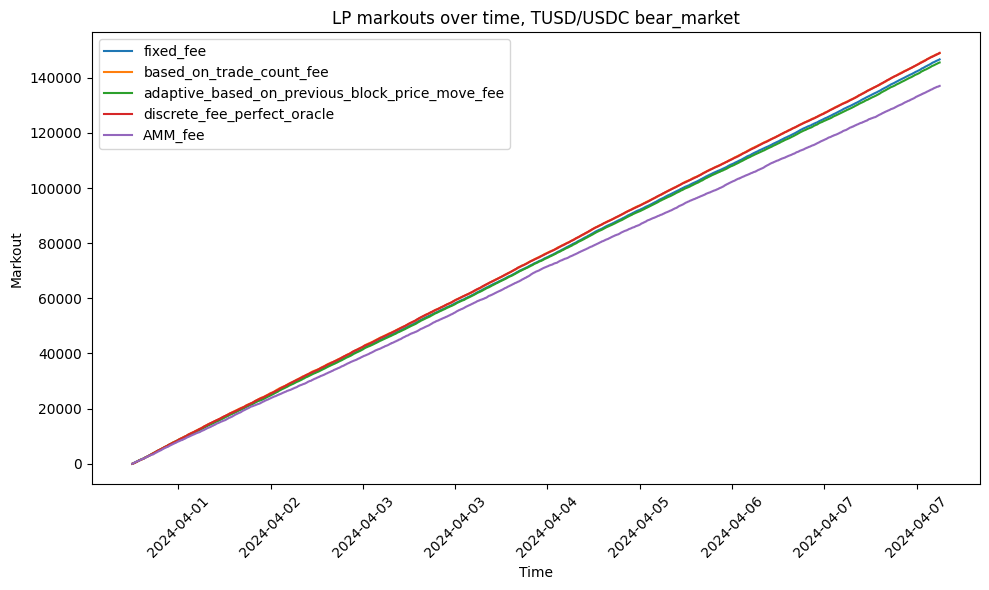

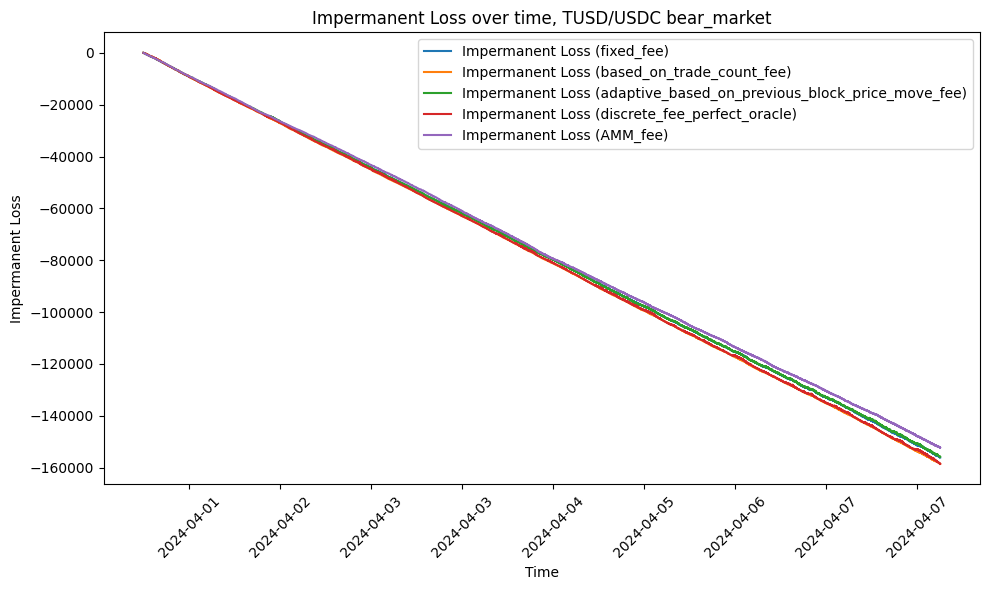

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,218.51,202,1.24,-282310.87,25041,-56.41,146637.17,28.30,-156113.65
1,based_on_trade_count_fee,246.35,223,1.26,-284736.43,25053,-56.86,148889.73,28.62,-158505.54
2,adaptive_based_on_previous_block_price_move_fee,392.61,314,1.42,-282945.87,25087,-56.44,145519.02,27.50,-155839.48
3,discrete_fee_perfect_oracle,193.46,175,1.26,-284693.46,25090,-56.77,148994.32,28.83,-158480.85
4,AMM_fee,1382.29,1137,1.38,-284416.69,25083,-56.73,137036.23,22.78,-152225.88


In [ ]:
plot_results_for_period(
    "TUSD/USDC bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

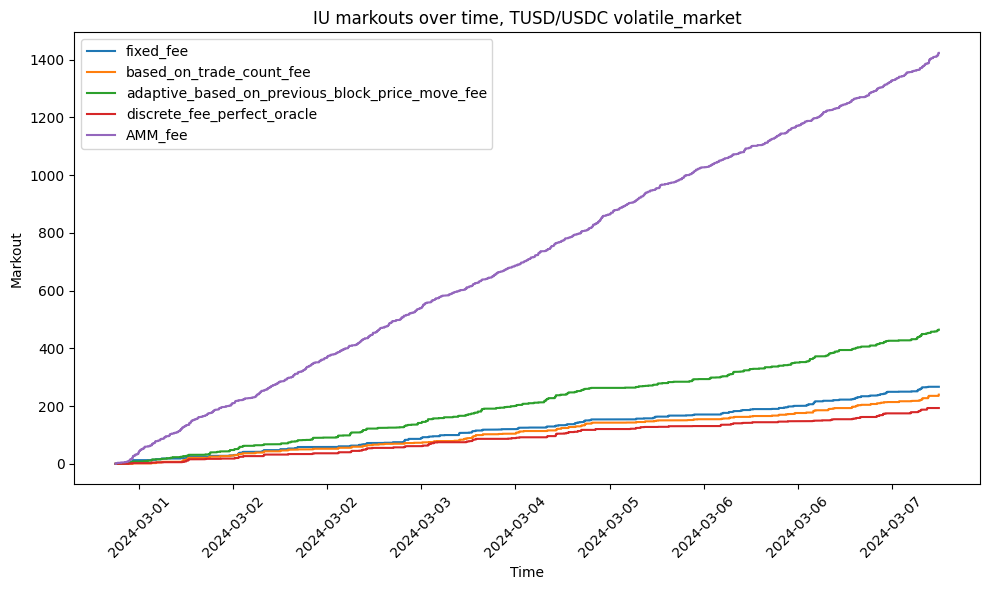

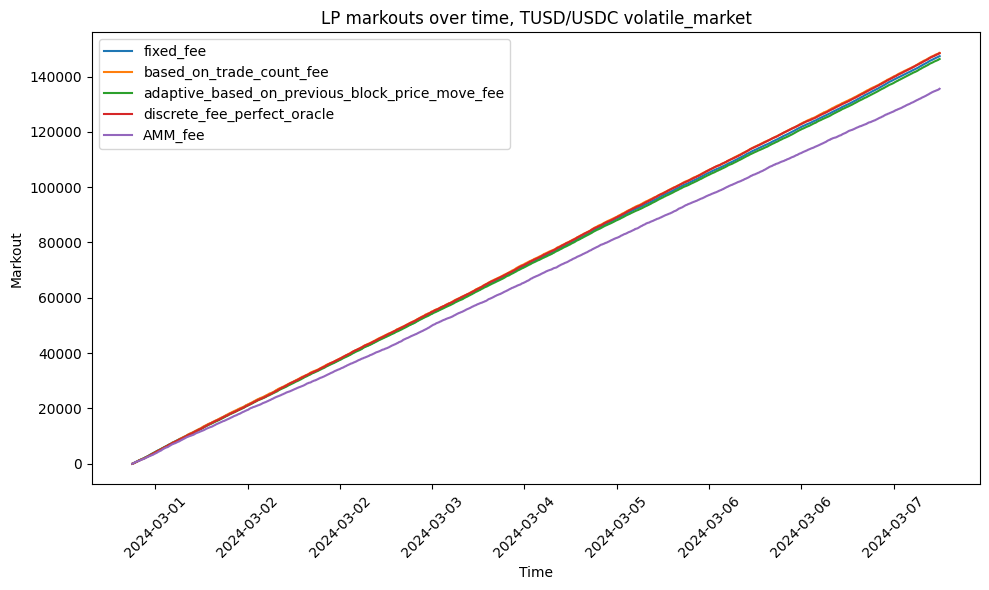

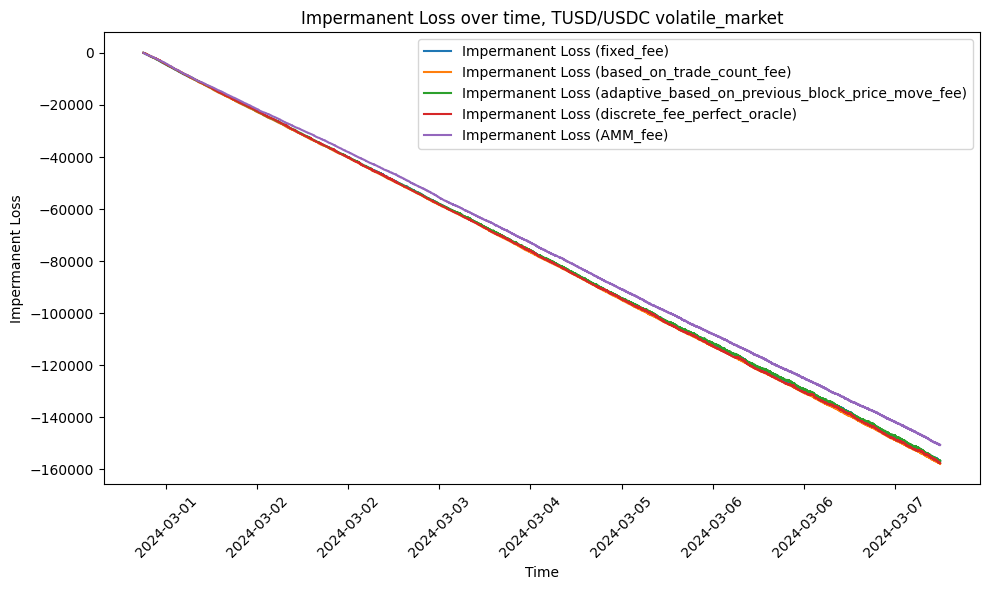

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,266.73,218,1.39,-283531.45,25094,-56.50,147367.13,28.28,-156763.69
1,based_on_trade_count_fee,239.53,201,1.35,-284207.43,25061,-56.72,148543.57,28.64,-157822.56
2,adaptive_based_on_previous_block_price_move_fee,464.49,347,1.50,-284514.03,25141,-56.61,146349.43,27.43,-156671.36
3,discrete_fee_perfect_oracle,193.14,163,1.35,-283630.79,25028,-56.68,148413.60,28.83,-157573.33
4,AMM_fee,1423.05,1148,1.40,-283058.59,25091,-56.45,135551.57,22.49,-150625.60


In [ ]:
plot_results_for_period(
    "TUSD/USDC volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### TUSD/USDP

##### bull_market

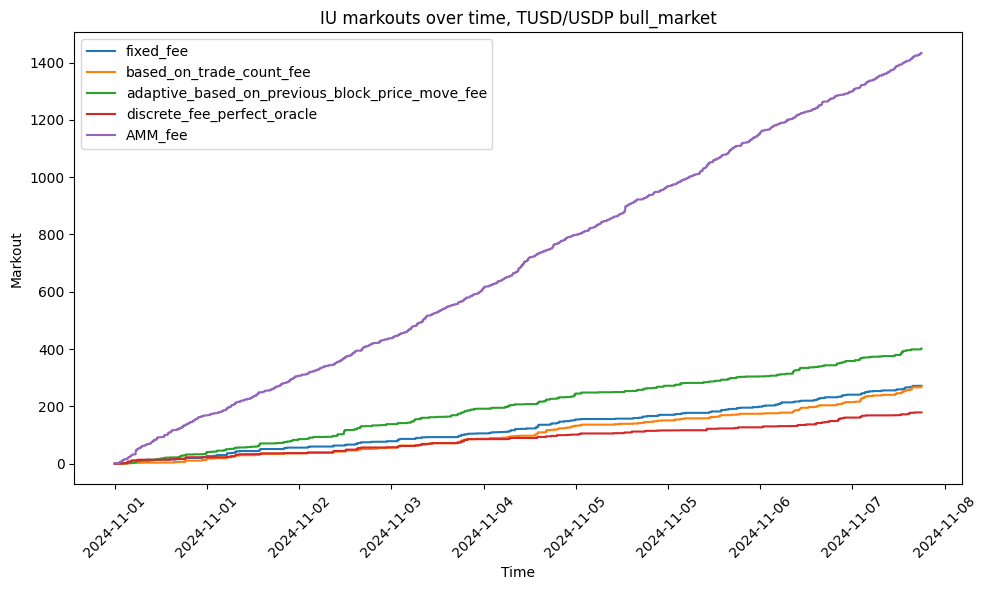

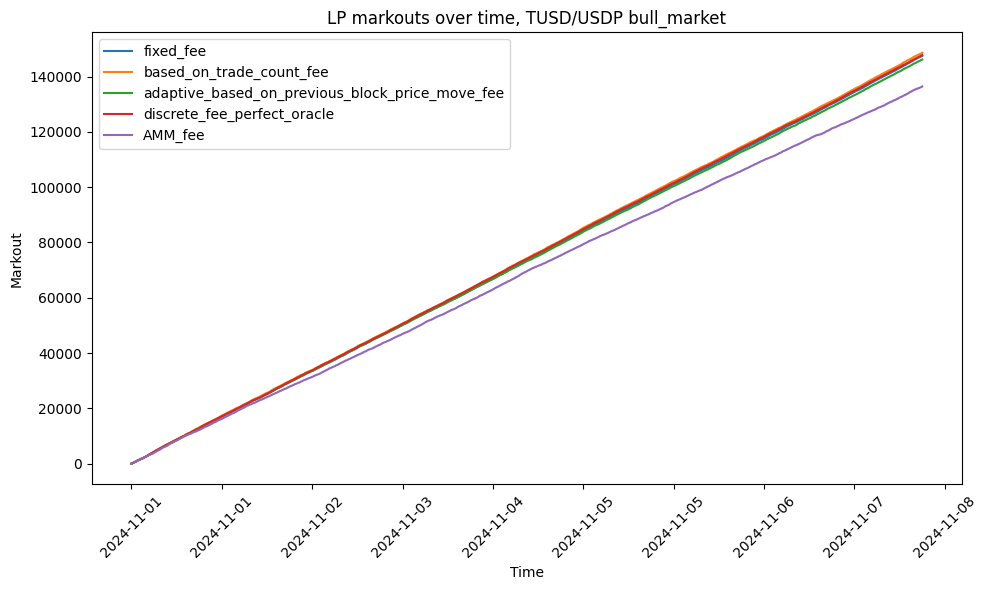

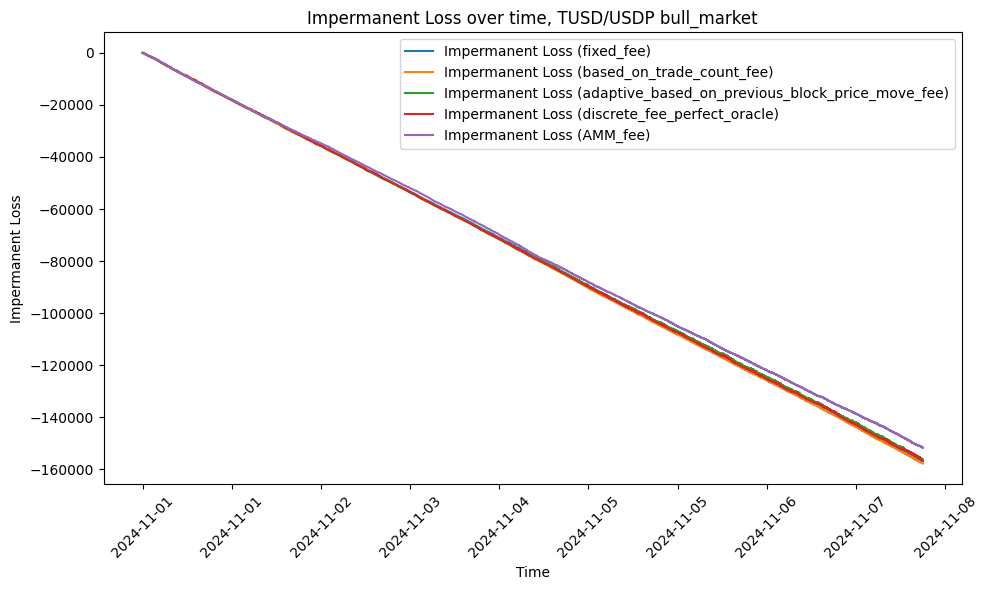

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,271.66,227,1.36,-283584.97,25069,-56.53,147482.69,28.27,-156912.73
1,based_on_trade_count_fee,269.66,208,1.46,-284022.83,25012,-56.76,148576.85,28.64,-157790.11
2,adaptive_based_on_previous_block_price_move_fee,401.72,317,1.43,-283994.53,25155,-56.41,146178.36,27.50,-156223.85
3,discrete_fee_perfect_oracle,178.65,140,1.44,-282567.07,24994,-56.51,147766.63,28.84,-156678.09
4,AMM_fee,1433.62,1180,1.38,-284603.75,25142,-56.58,136437.92,22.48,-151679.79


In [ ]:
plot_results_for_period(
    "TUSD/USDP bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

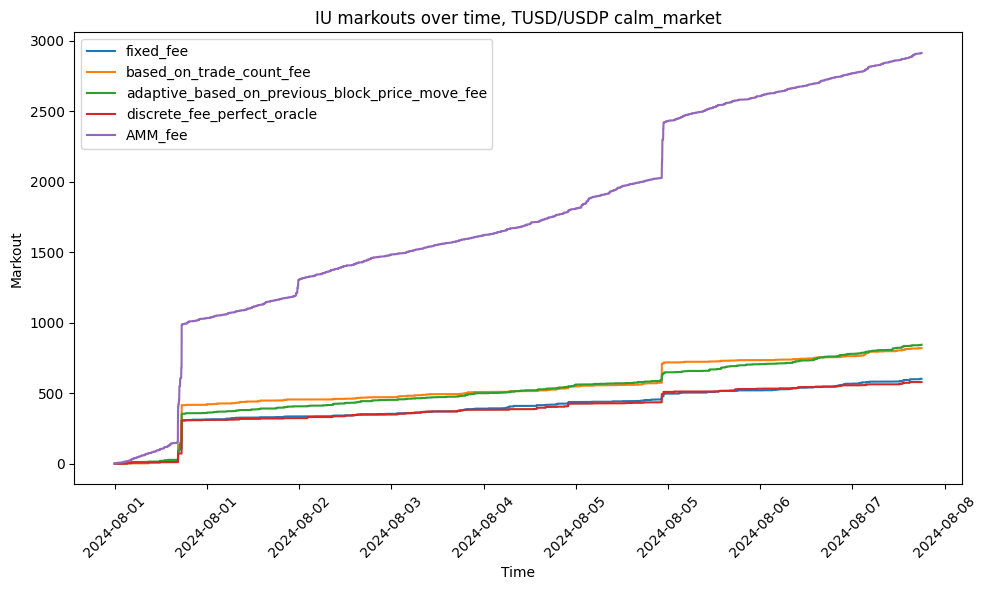

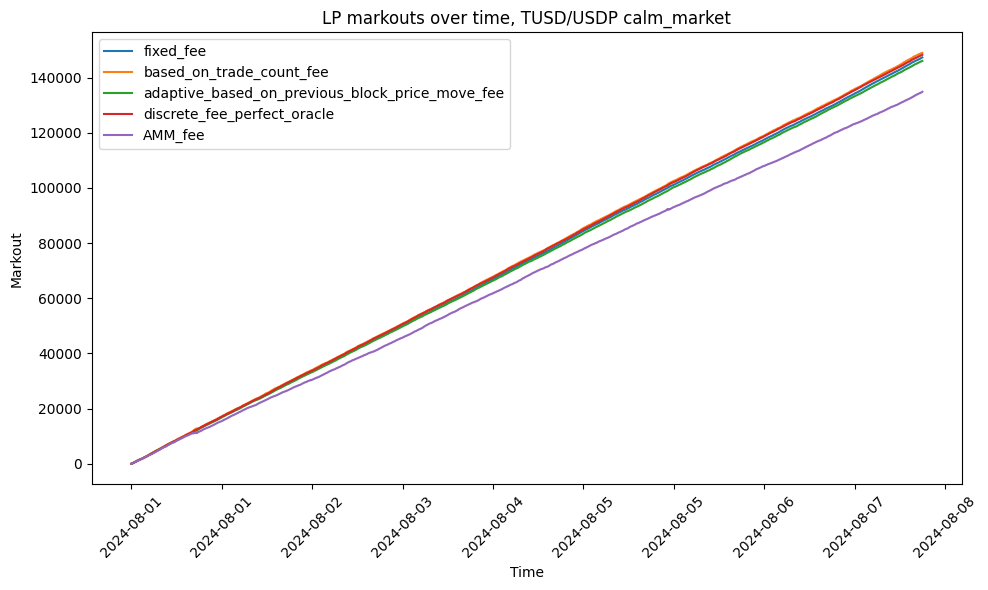

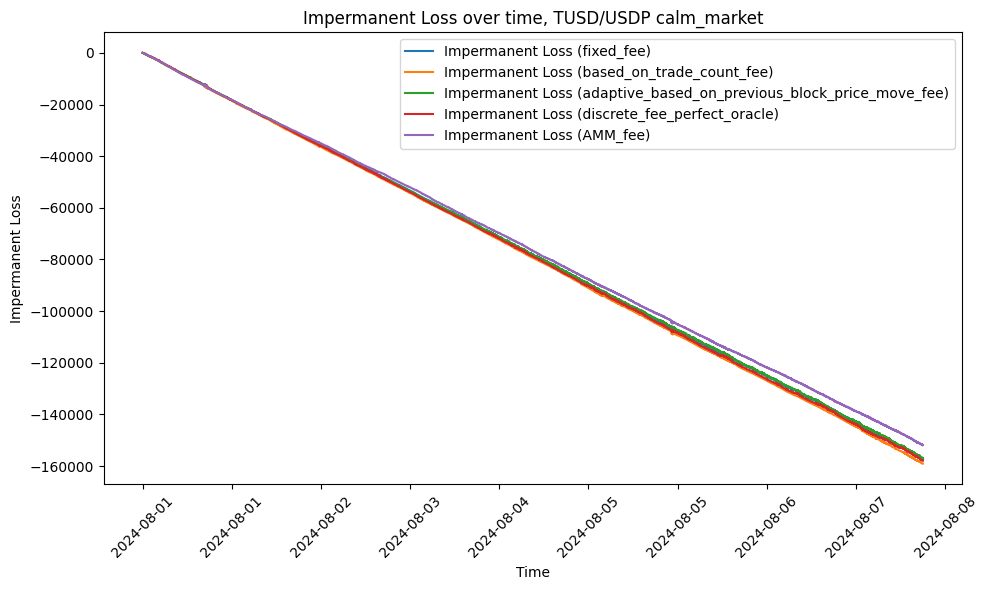

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,602.48,220,2.95,-283254.66,25111,-56.48,147306.61,28.22,-157209.14
1,based_on_trade_count_fee,819.79,226,3.84,-284901.39,25095,-56.85,148959.38,28.51,-159051.92
2,adaptive_based_on_previous_block_price_move_fee,844.11,348,2.62,-283825.70,25121,-56.57,146064.89,27.36,-156908.17
3,discrete_fee_perfect_oracle,579.25,163,3.75,-283039.14,25015,-56.66,148258.63,28.79,-157926.89
4,AMM_fee,2914.85,1226,2.58,-283439.33,25017,-56.76,134847.92,22.02,-151824.47


In [ ]:
plot_results_for_period(
    "TUSD/USDP calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

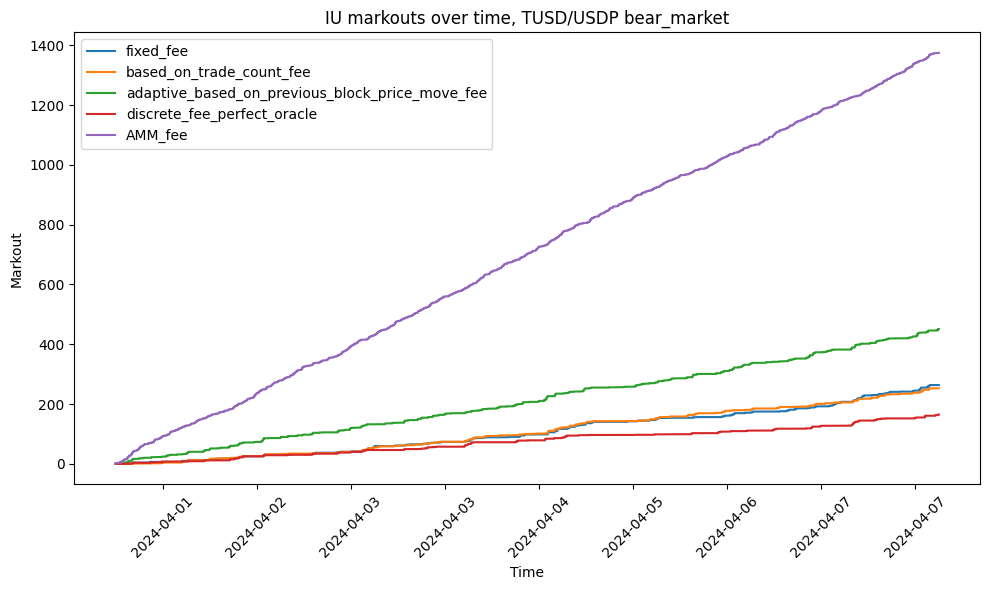

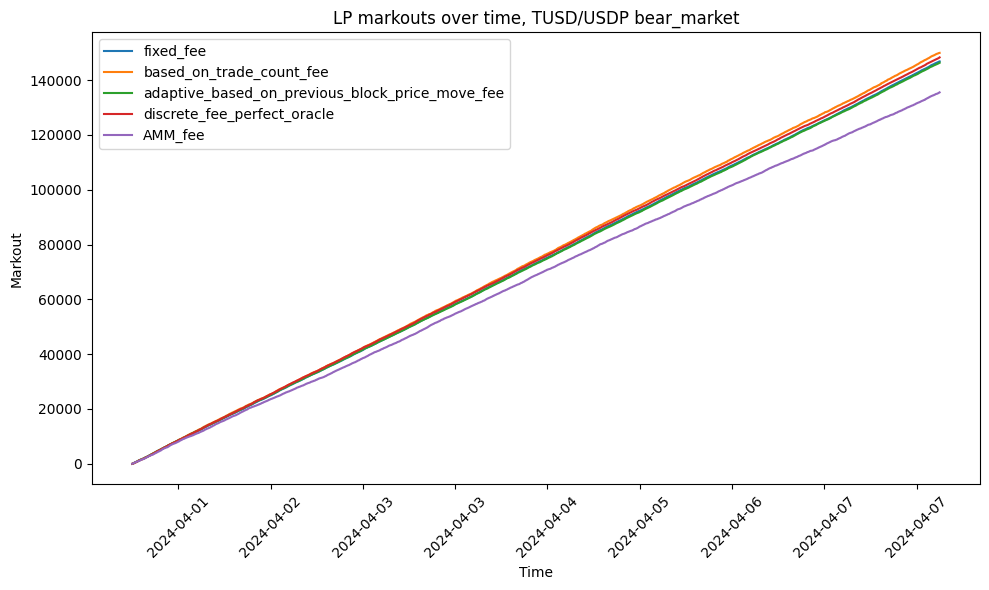

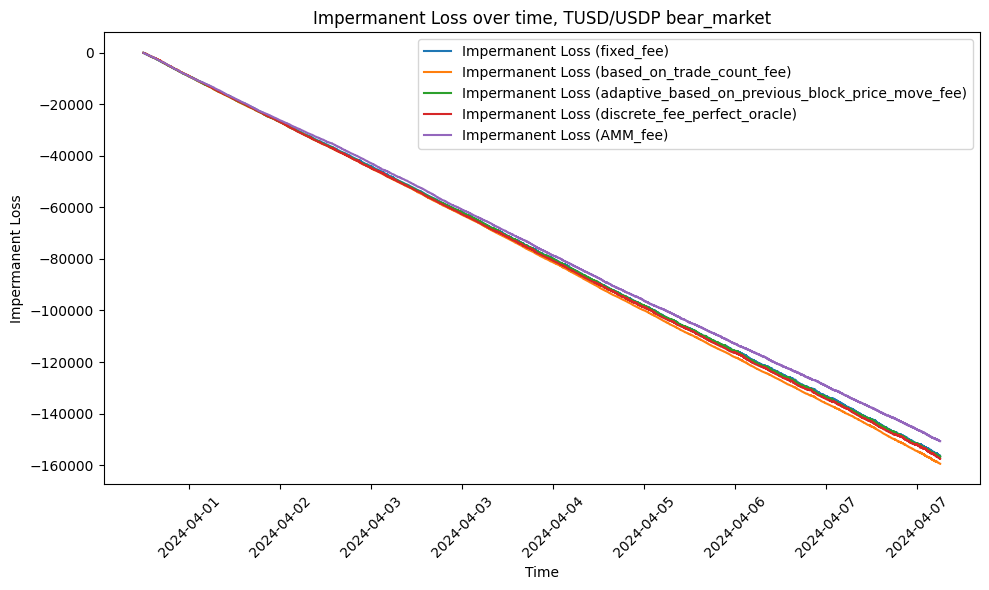

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,263.41,208,1.43,-282743.86,25052,-56.47,146846.16,28.29,-156441.42
1,based_on_trade_count_fee,252.55,213,1.35,-285728.45,25056,-57.05,149964.12,28.86,-159511.61
2,adaptive_based_on_previous_block_price_move_fee,450.98,336,1.51,-284611.07,25167,-56.59,146368.06,27.47,-156697.78
3,discrete_fee_perfect_oracle,165.01,144,1.31,-283509.81,25076,-56.56,148315.73,28.86,-157568.66
4,AMM_fee,1374.94,1138,1.37,-283181.65,25127,-56.39,135548.50,22.50,-150728.54


In [ ]:
plot_results_for_period(
    "TUSD/USDP bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

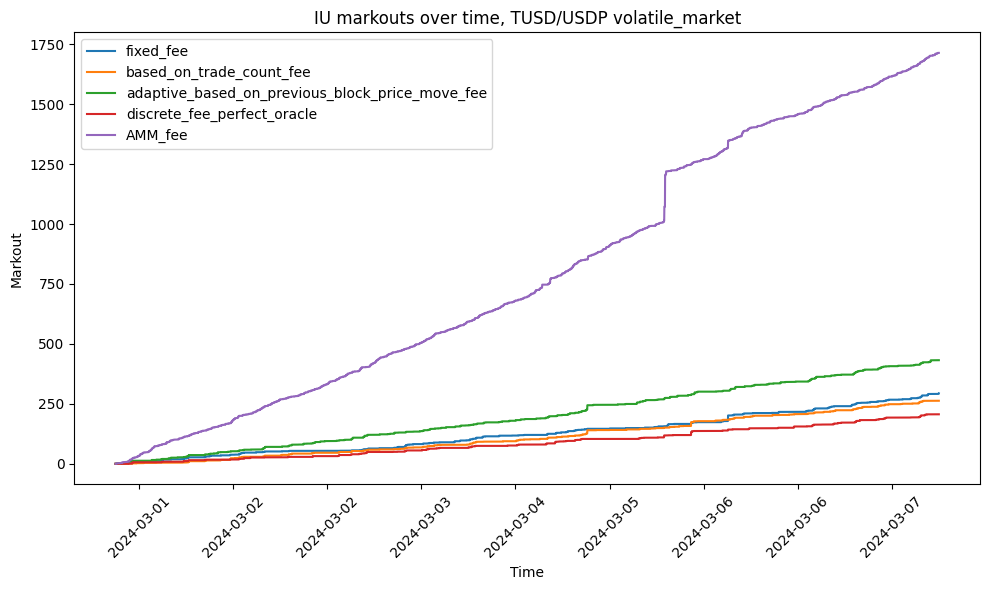

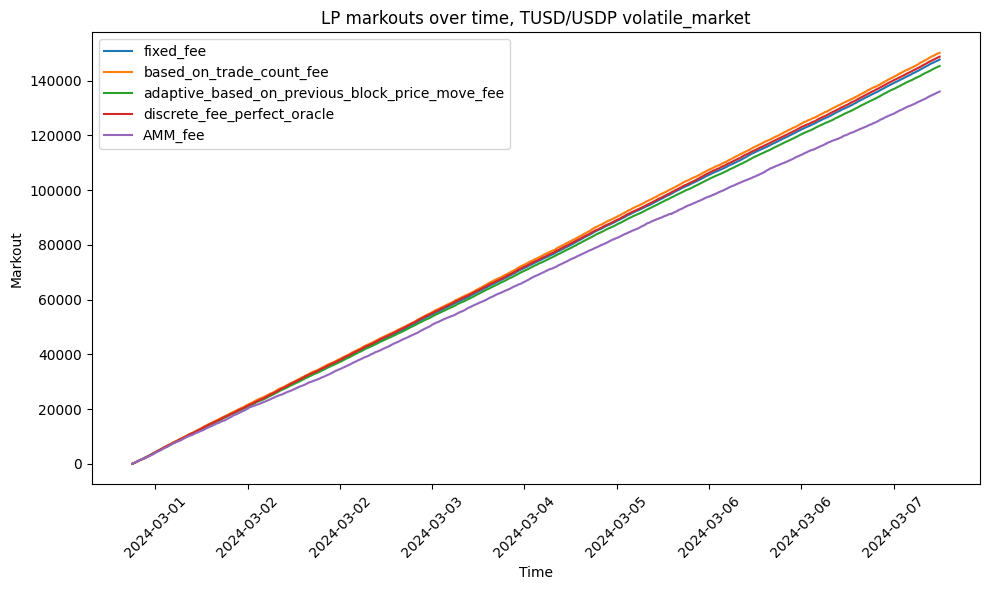

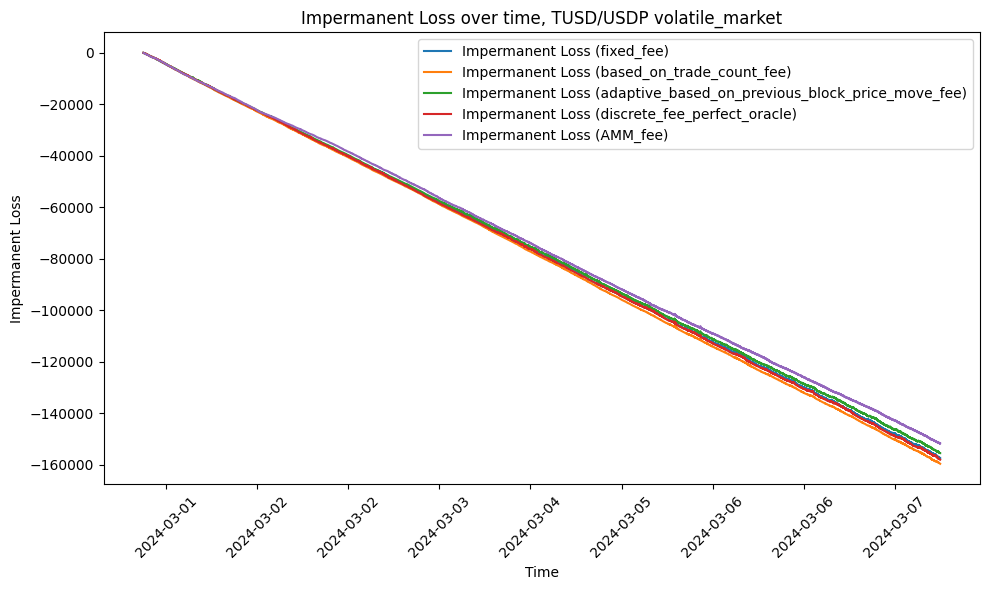

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,293.61,241,1.39,-283698.31,25076,-56.59,147672.32,28.26,-157295.62
1,based_on_trade_count_fee,262.94,216,1.38,-285815.87,25061,-57.04,150116.98,28.86,-159545.24
2,adaptive_based_on_previous_block_price_move_fee,432.15,298,1.62,-282387.50,25083,-56.31,145325.55,27.51,-155408.93
3,discrete_fee_perfect_oracle,206.47,175,1.34,-283824.31,25018,-56.75,148726.94,28.85,-157941.54
4,AMM_fee,1714.07,1198,1.61,-284003.67,25054,-56.71,136011.74,22.39,-151641.02


In [ ]:
plot_results_for_period(
    "TUSD/USDP volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### USDC/USDP

##### bull_market

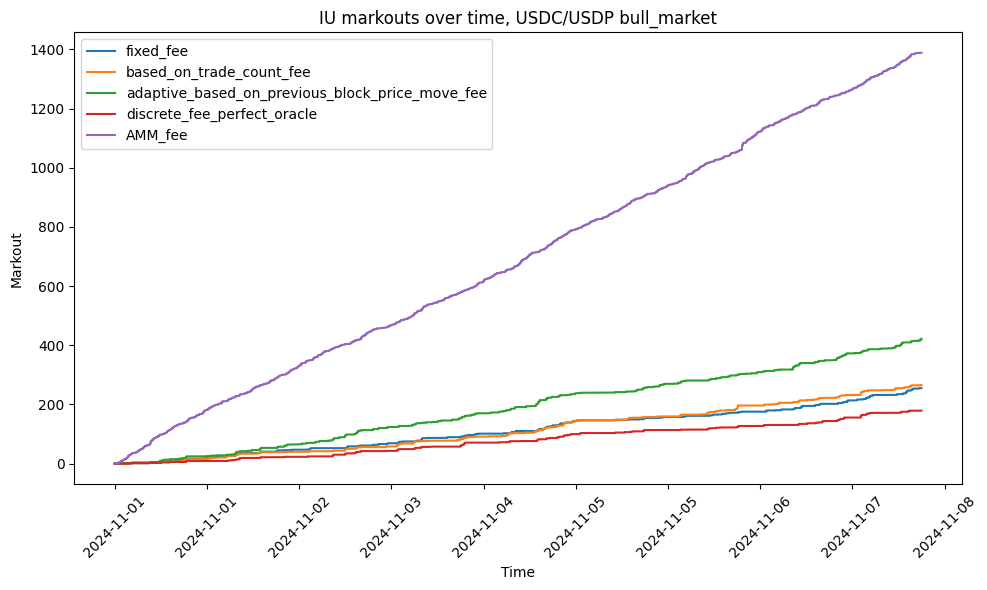

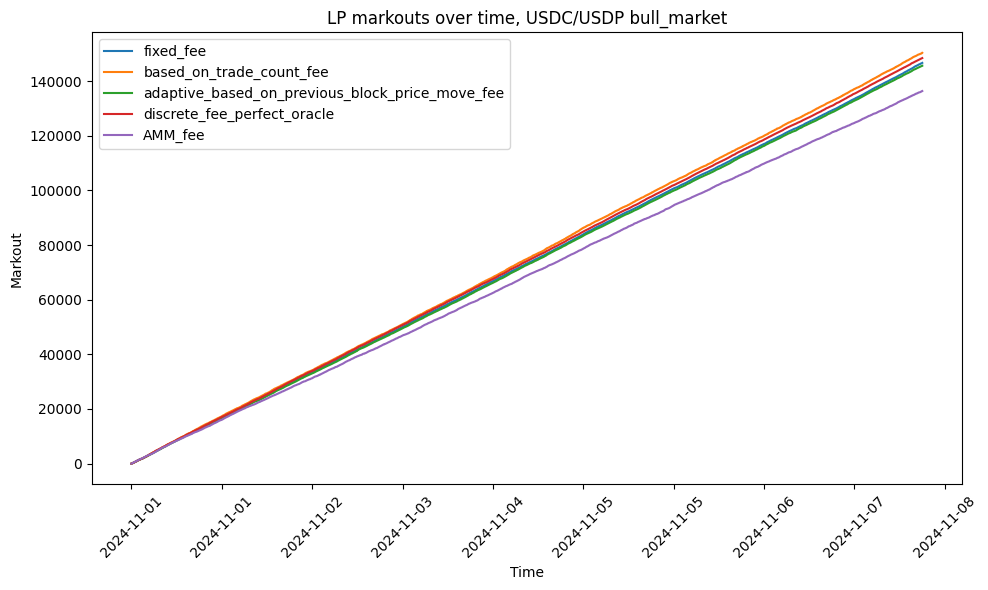

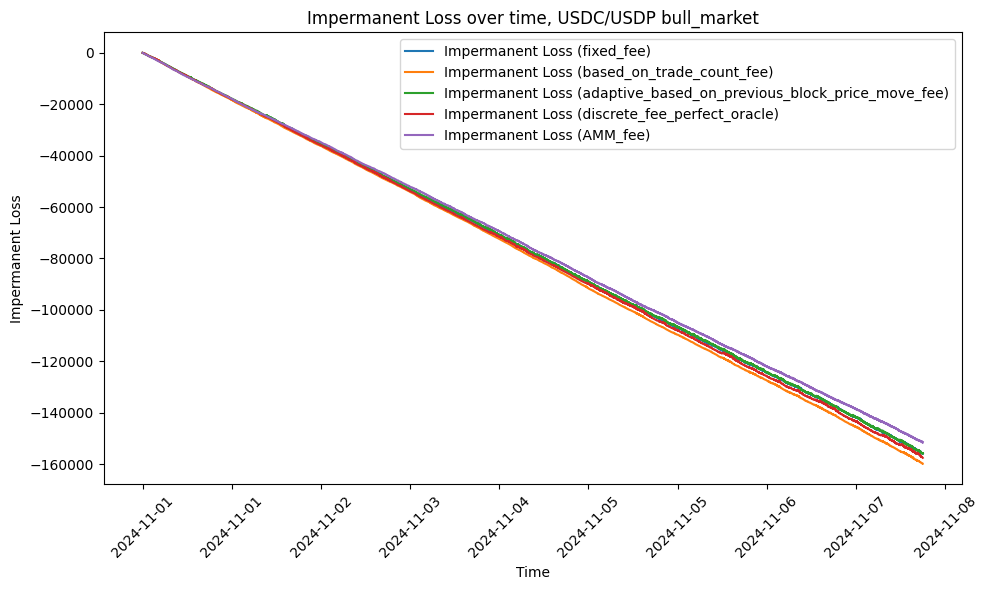

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,255.02,220,1.32,-282355.64,24999,-56.54,146690.00,28.28,-156044.98
1,based_on_trade_count_fee,265.49,232,1.31,-286338.17,25069,-57.19,150359.65,28.86,-159835.24
2,adaptive_based_on_previous_block_price_move_fee,422.23,324,1.47,-283368.13,25106,-56.50,145682.83,27.48,-155891.76
3,discrete_fee_perfect_oracle,178.96,154,1.32,-283496.23,25027,-56.71,148453.46,28.92,-157561.97
4,AMM_fee,1388.42,1157,1.36,-284216.39,25125,-56.63,136379.84,22.59,-151533.30


In [ ]:
plot_results_for_period(
    "USDC/USDP bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

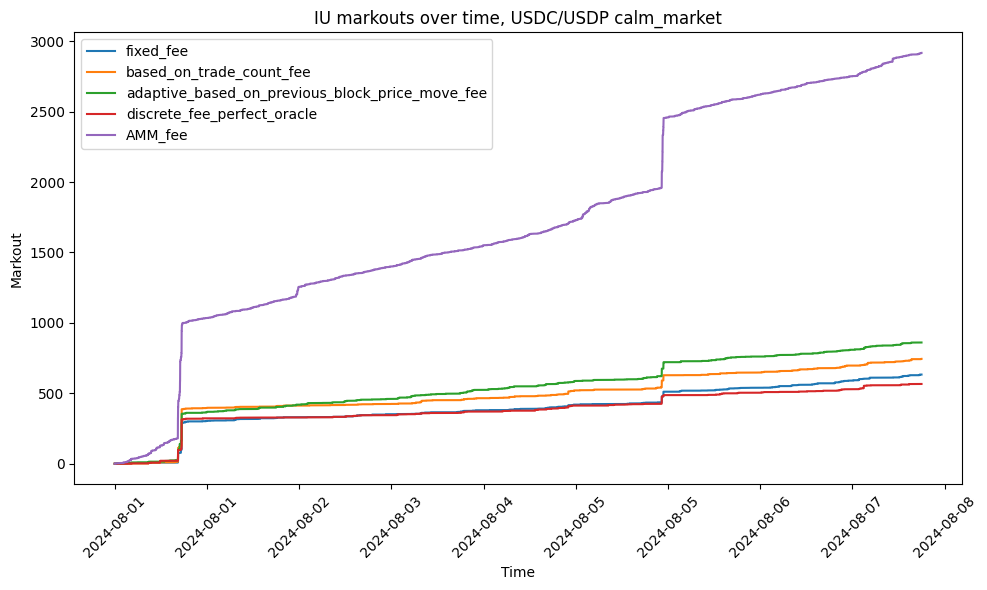

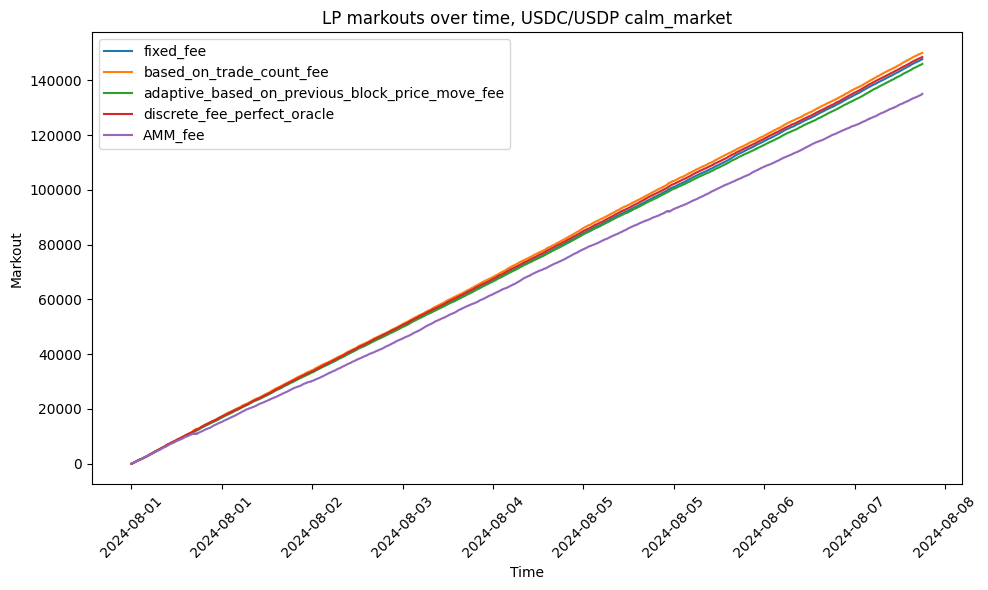

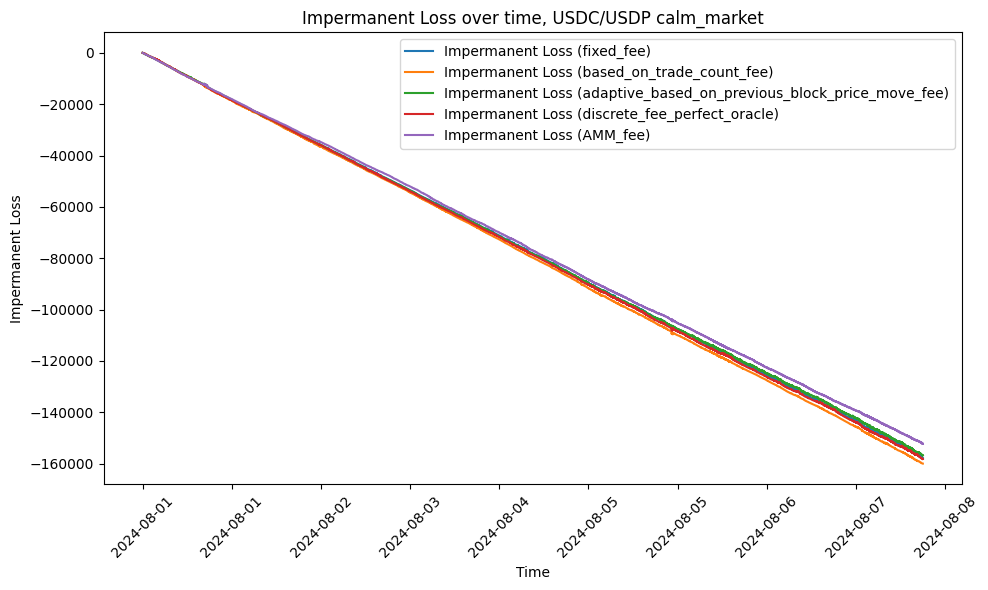

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,633.03,233,2.93,-284105.68,25142,-56.57,147765.11,28.21,-157746.08
1,based_on_trade_count_fee,744.44,231,3.43,-285555.95,25032,-57.13,150042.59,28.77,-160012.79
2,adaptive_based_on_previous_block_price_move_fee,860.71,343,2.71,-283595.08,25117,-56.53,146020.09,27.37,-156755.75
3,discrete_fee_perfect_oracle,566.21,169,3.56,-283390.29,25027,-56.69,148538.48,28.80,-158209.59
4,AMM_fee,2917.19,1256,2.53,-284522.29,25114,-56.73,135058.75,21.90,-152248.82


In [ ]:
plot_results_for_period(
    "USDC/USDP calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

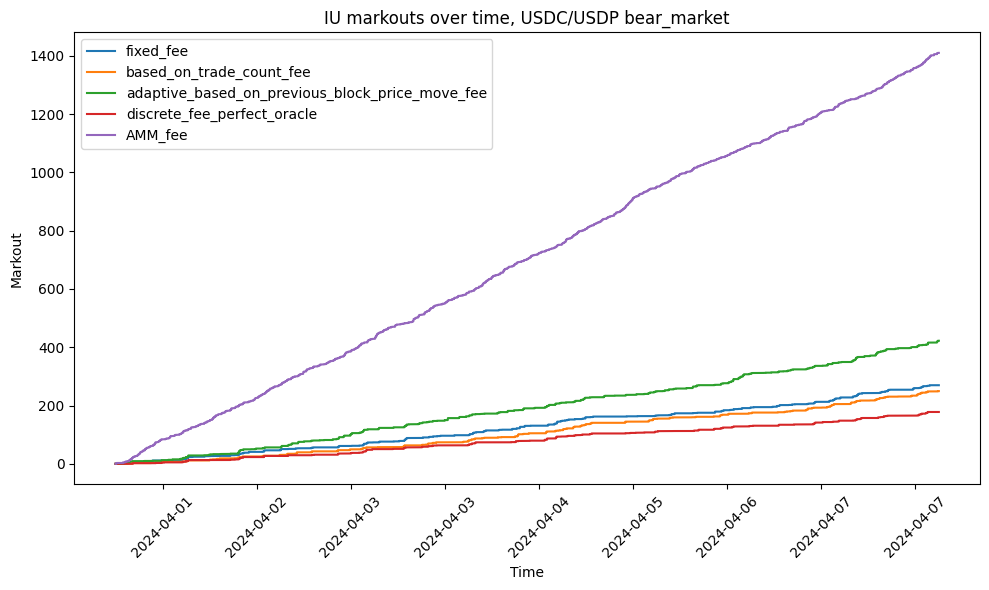

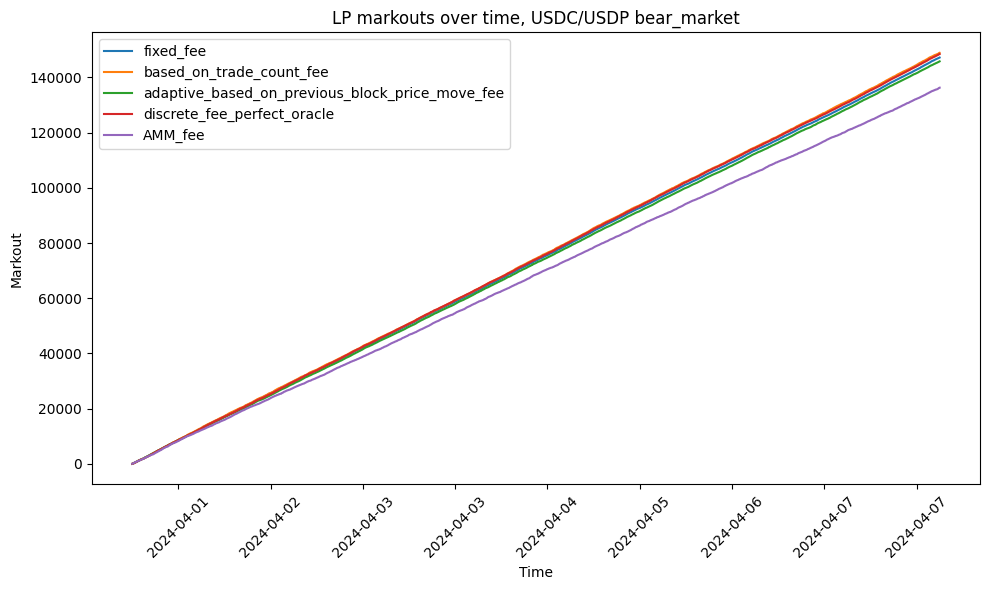

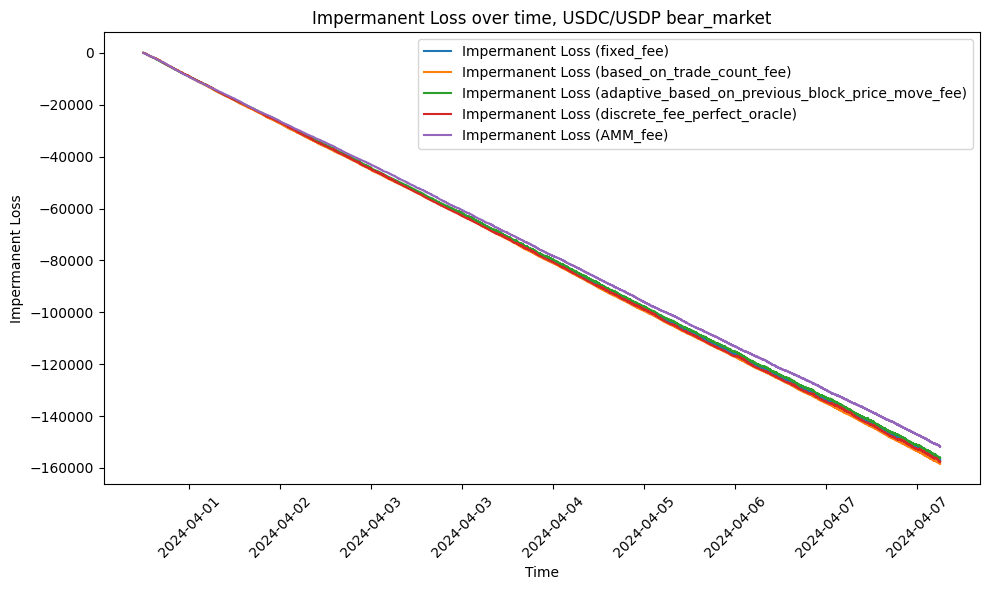

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,269.71,224,1.37,-283355.76,25063,-56.58,147196.24,28.28,-156904.60
1,based_on_trade_count_fee,249.52,216,1.32,-284830.46,25074,-56.84,148895.75,28.63,-158397.03
2,adaptive_based_on_previous_block_price_move_fee,422.33,319,1.49,-283550.89,25117,-56.50,145822.58,27.50,-156004.57
3,discrete_fee_perfect_oracle,177.85,167,1.22,-283675.17,25037,-56.70,148472.21,28.84,-157655.79
4,AMM_fee,1410.38,1179,1.36,-284507.04,25150,-56.62,136298.76,22.48,-151801.78


In [ ]:
plot_results_for_period(
    "USDC/USDP bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

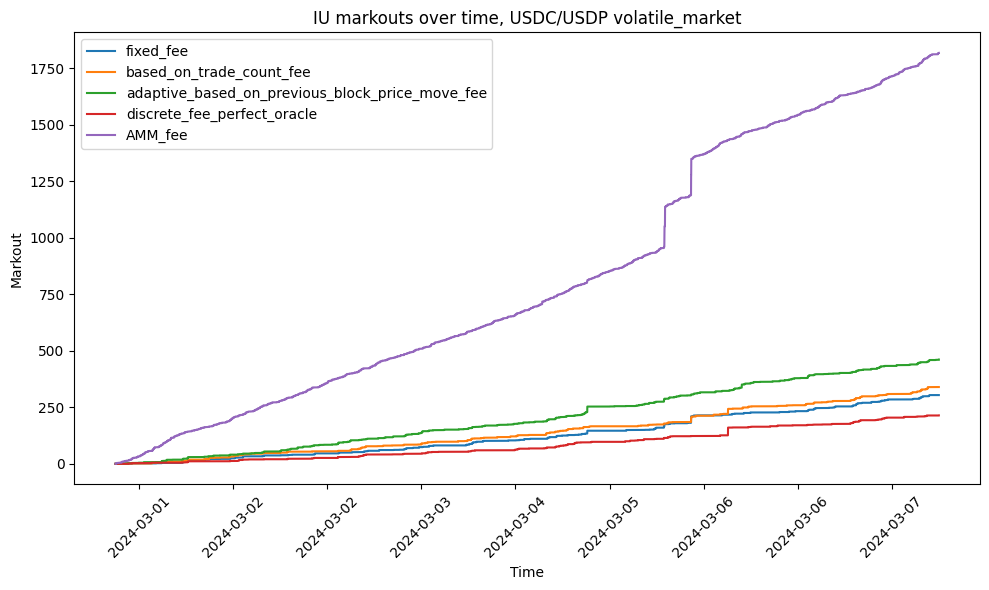

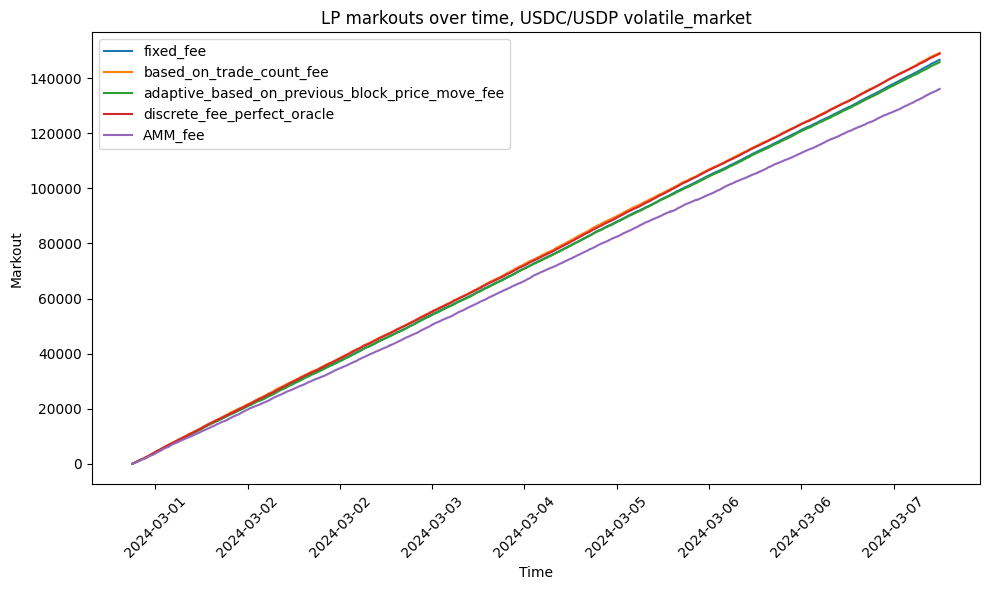

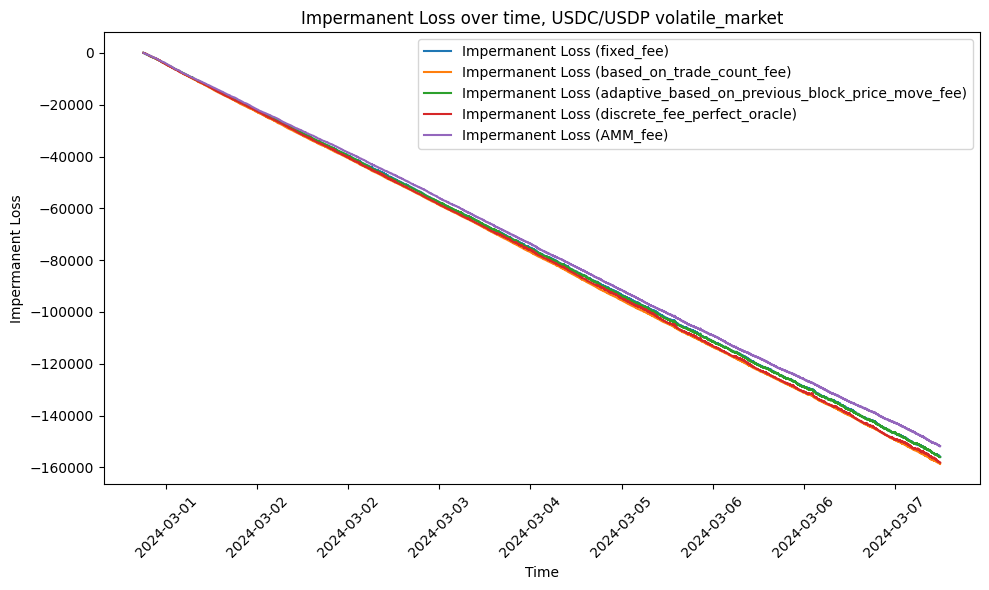

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,303.85,205,1.66,-282103.38,25018,-56.41,146643.60,28.28,-155975.65
1,based_on_trade_count_fee,339.45,216,1.74,-285031.56,25098,-56.81,149172.53,28.62,-158607.46
2,adaptive_based_on_previous_block_price_move_fee,461.08,320,1.61,-283209.55,25100,-56.44,145788.42,27.49,-156034.76
3,discrete_fee_perfect_oracle,214.15,173,1.41,-283963.74,25041,-56.73,148863.51,28.86,-158134.59
4,AMM_fee,1817.02,1200,1.70,-284674.03,25137,-56.66,136080.06,22.33,-151804.34


In [ ]:
plot_results_for_period(
    "USDC/USDP volatile_market",
    list(fee_algos_to_consider.keys()),
)

### Results: Non-stable / Stable (USDT-priced)

#### BTC/ETH

##### bull_market

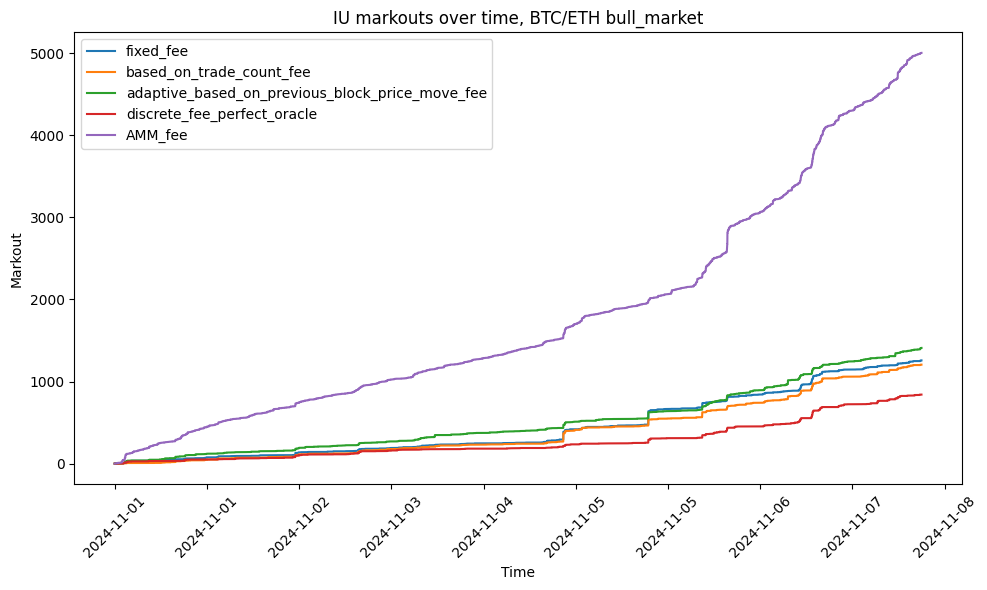

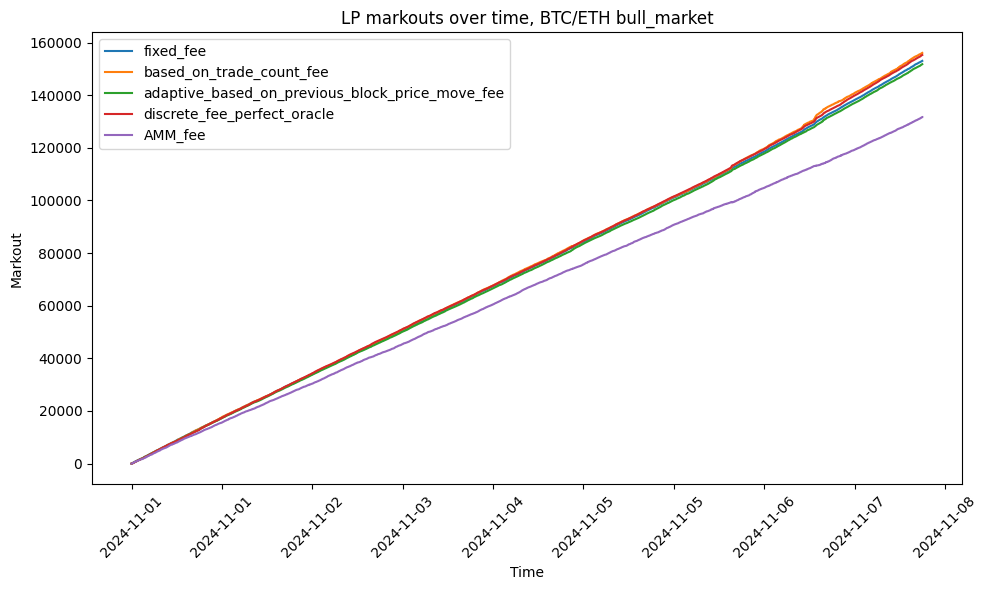

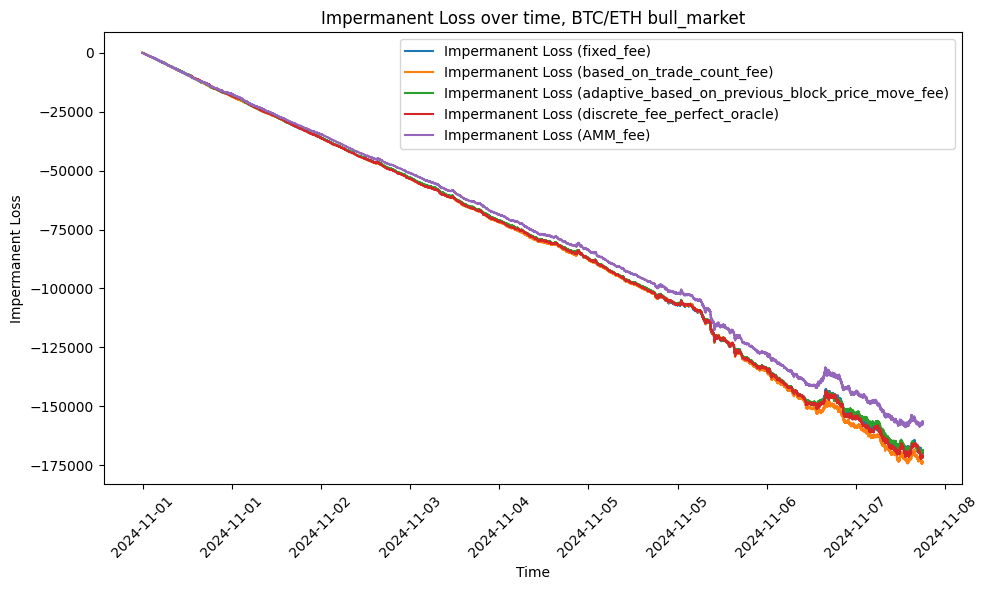

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,1257.44,446,2.92,-284008.13,25033,-56.34,153045.48,27.97,-168976.67
1,based_on_trade_count_fee,1205.55,446,2.80,-286154.15,25007,-56.82,156077.27,28.55,-173750.31
2,adaptive_based_on_previous_block_price_move_fee,1409.27,536,2.72,-284403.98,25059,-56.35,151792.89,27.27,-168825.03
3,discrete_fee_perfect_oracle,840.74,305,2.80,-284525.06,25009,-56.48,155284.17,29.09,-171814.99
4,AMM_fee,5002.60,1910,2.71,-285932.92,25035,-56.72,131710.96,19.13,-156966.15


In [ ]:
plot_results_for_period(
    "BTC/ETH bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

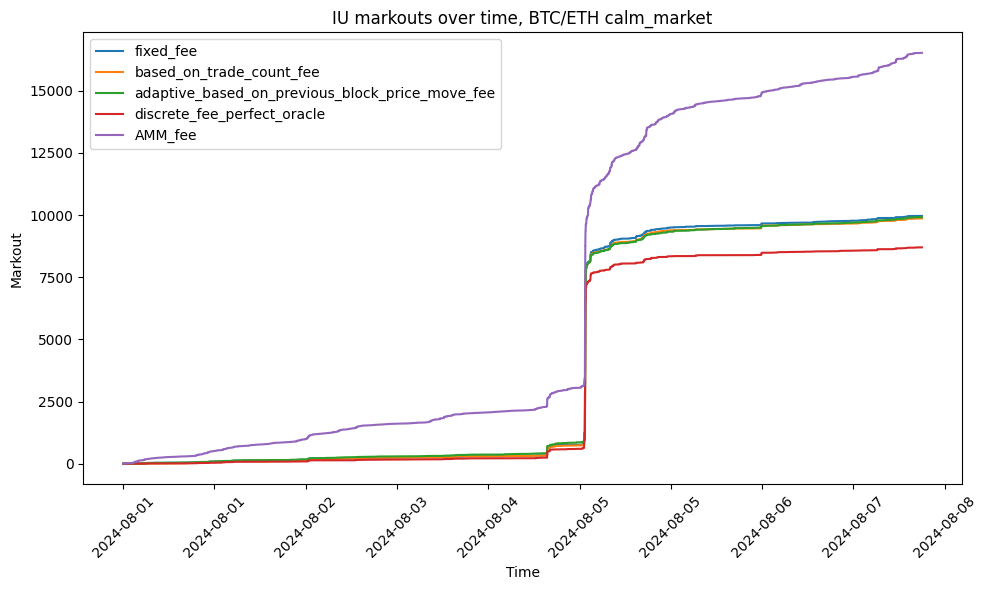

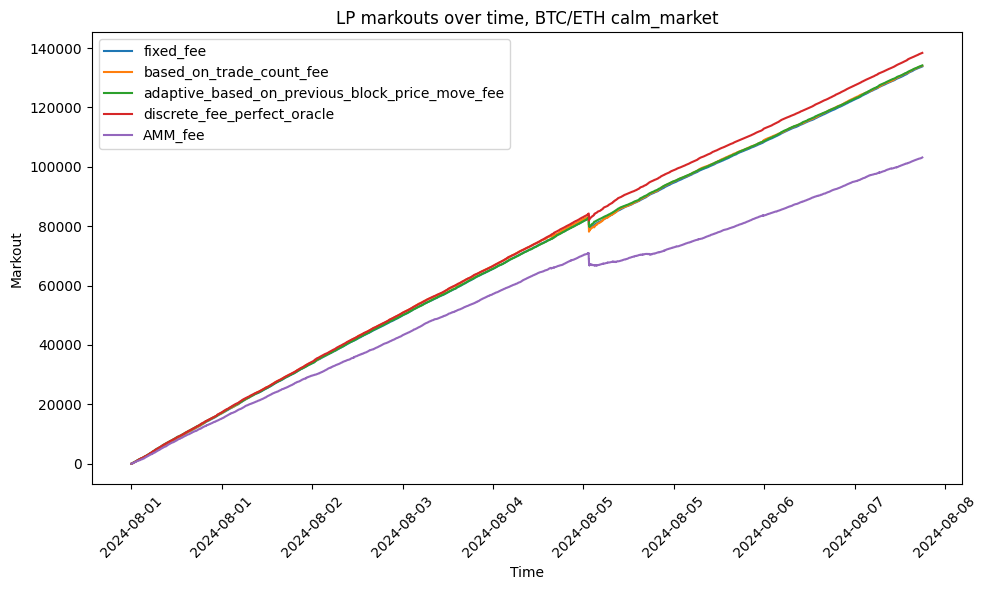

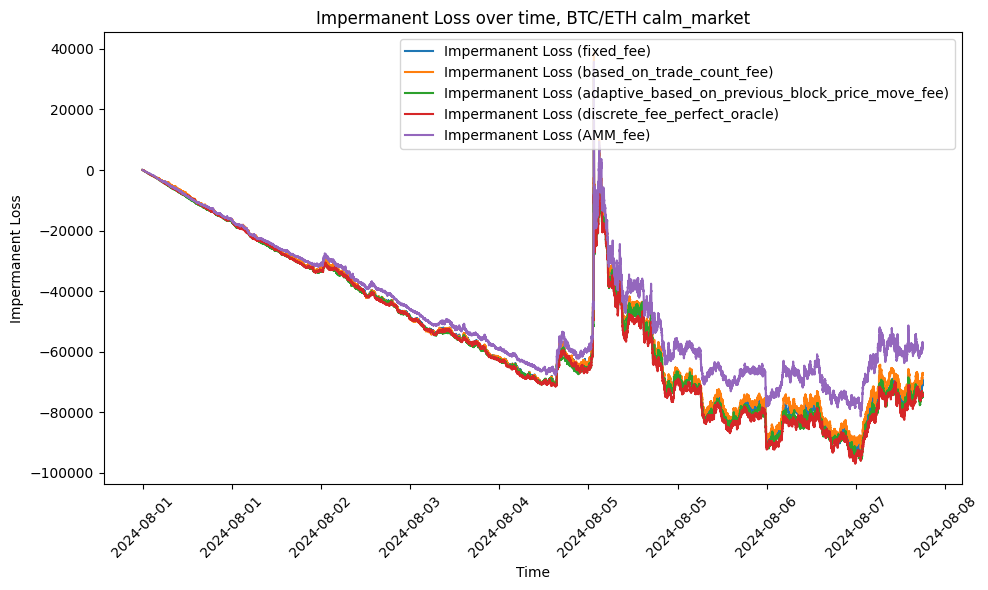

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,9966.54,612,14.76,-264773.25,25082,-59.57,133816.65,26.13,-69675.94
1,based_on_trade_count_fee,9865.40,604,14.75,-267095.08,25056,-60.14,134035.04,26.23,-67227.60
2,adaptive_based_on_previous_block_price_move_fee,9915.38,691,13.30,-264951.10,25072,-59.61,134174.43,25.85,-73906.60
3,discrete_fee_perfect_oracle,8702.49,427,17.47,-265444.70,25051,-59.77,138394.41,28.02,-74429.27
4,AMM_fee,16524.38,2366,7.09,-265253.85,25011,-59.88,103159.05,15.26,-58101.88


In [ ]:
plot_results_for_period(
    "BTC/ETH calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

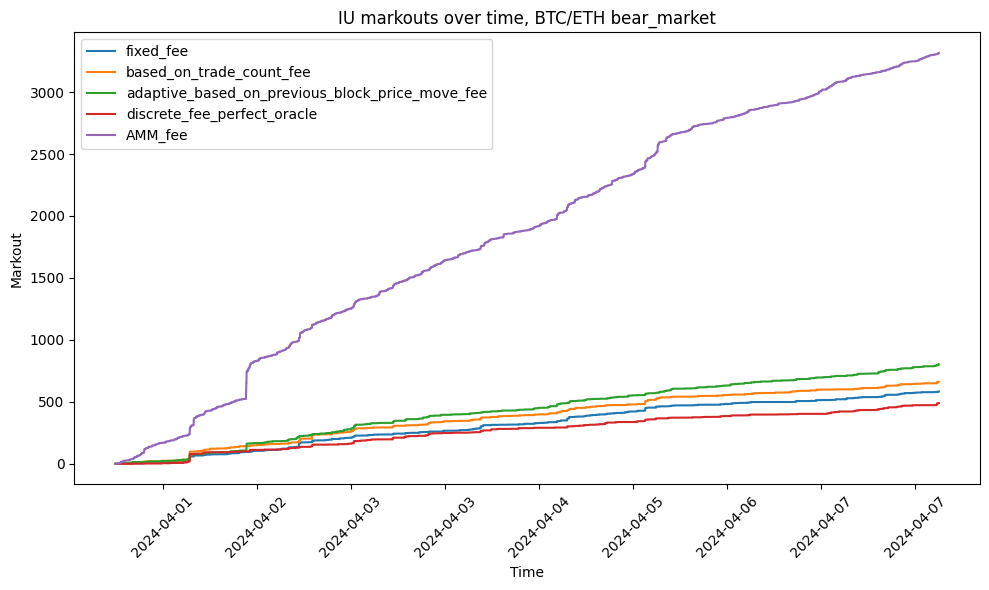

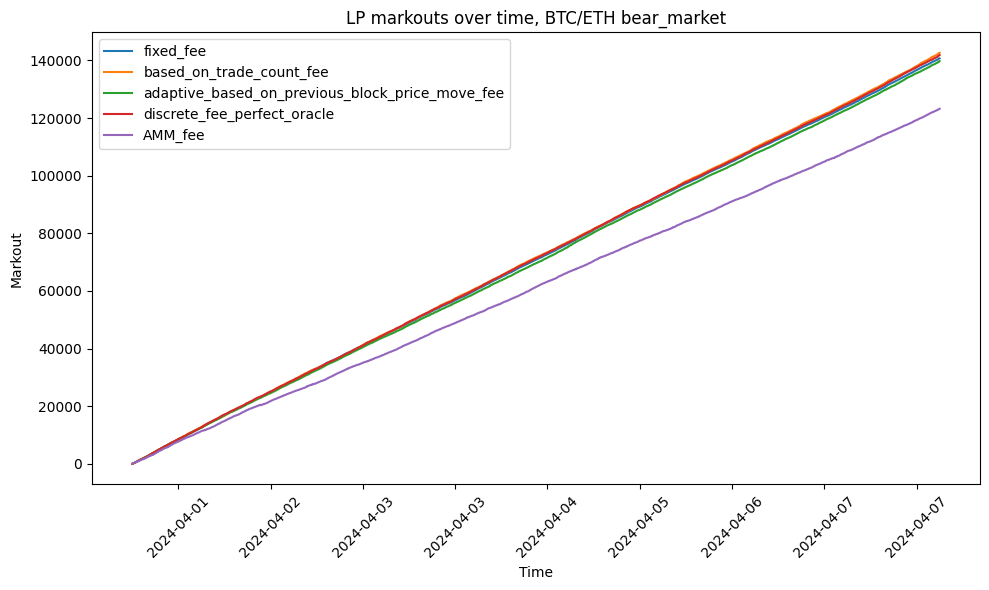

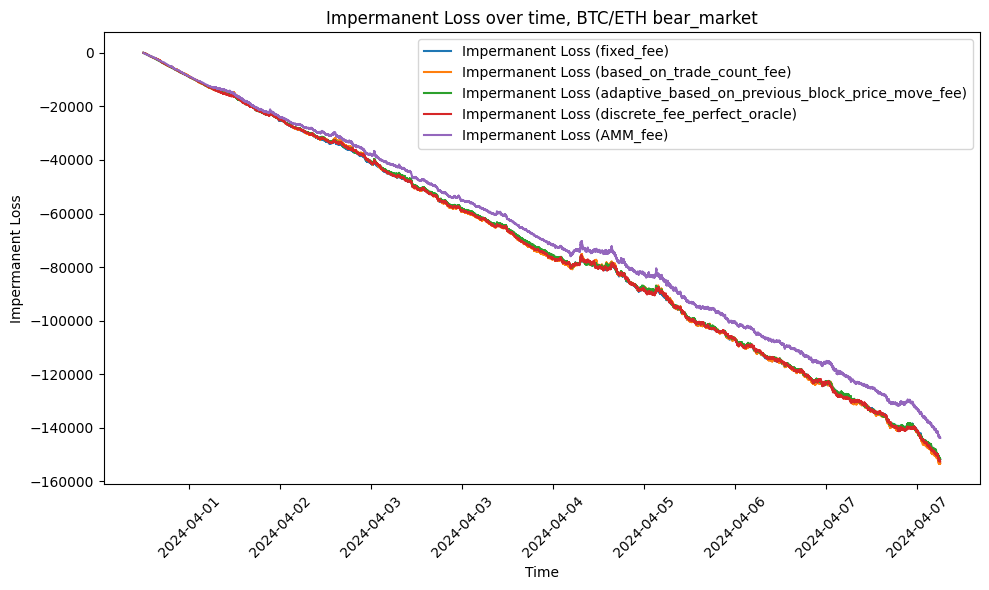

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,583.59,346,1.93,-273236.61,25103,-58.13,140665.39,28.12,-151945.59
1,based_on_trade_count_fee,661.19,342,2.18,-274910.46,25022,-58.70,142605.00,28.60,-153448.34
2,adaptive_based_on_previous_block_price_move_fee,802.20,449,2.02,-273598.18,25088,-58.27,139699.14,27.44,-151668.64
3,discrete_fee_perfect_oracle,489.67,247,2.22,-273127.89,25018,-58.32,141836.34,28.93,-152636.76
4,AMM_fee,3316.34,1619,2.29,-273816.23,25116,-58.28,123216.16,20.05,-143783.46


In [ ]:
plot_results_for_period(
    "BTC/ETH bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

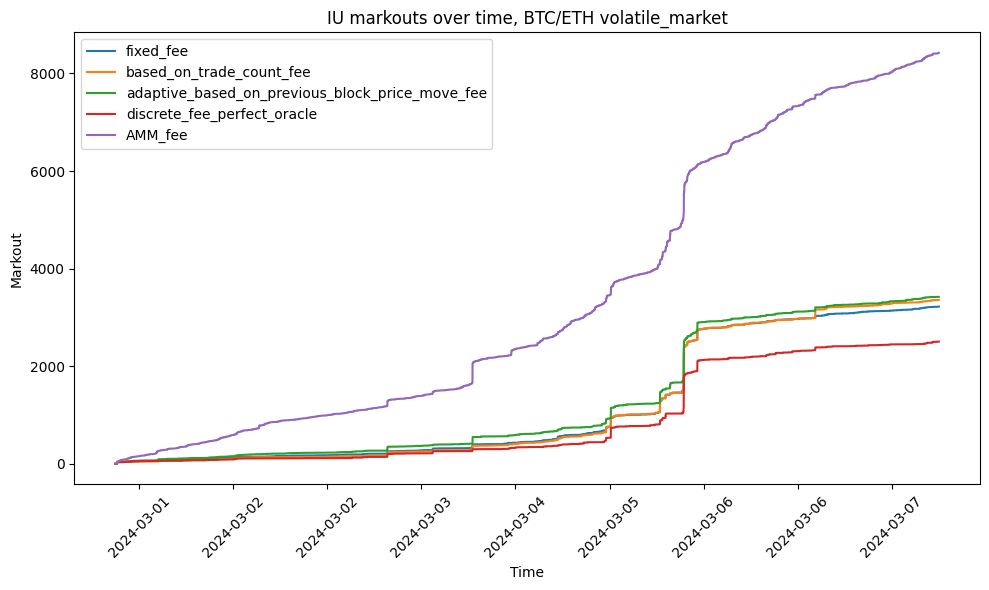

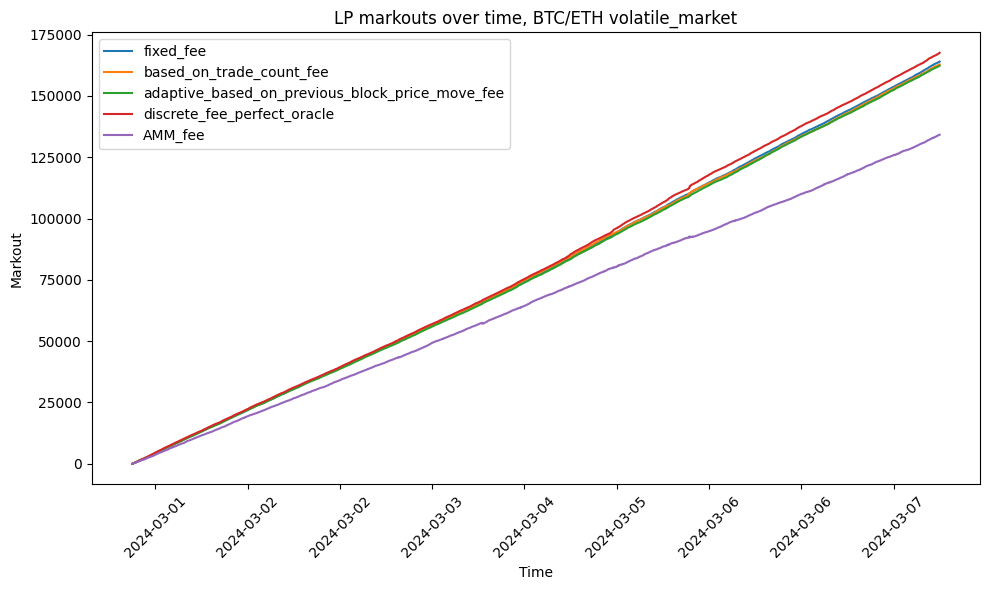

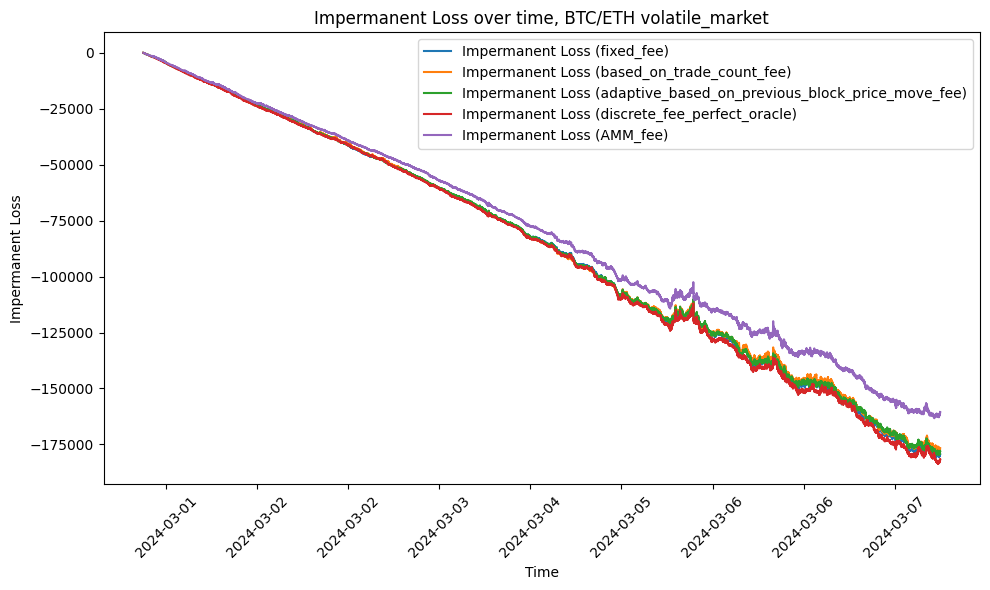

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,3222.17,591,5.10,-292221.12,25026,-55.04,164010.43,27.61,-179275.80
1,based_on_trade_count_fee,3358.73,568,5.49,-291723.75,25037,-54.94,162808.59,27.49,-176669.45
2,adaptive_based_on_previous_block_price_move_fee,3421.59,651,4.93,-291820.99,25070,-54.86,162322.40,26.99,-177994.43
3,discrete_fee_perfect_oracle,2504.91,407,5.61,-294072.34,25055,-55.33,167564.56,29.09,-181571.56
4,AMM_fee,8422.10,2265,3.60,-292856.63,25112,-55.00,134204.51,17.51,-160523.59


In [ ]:
plot_results_for_period(
    "BTC/ETH volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### BTC/BNB

##### bull_market

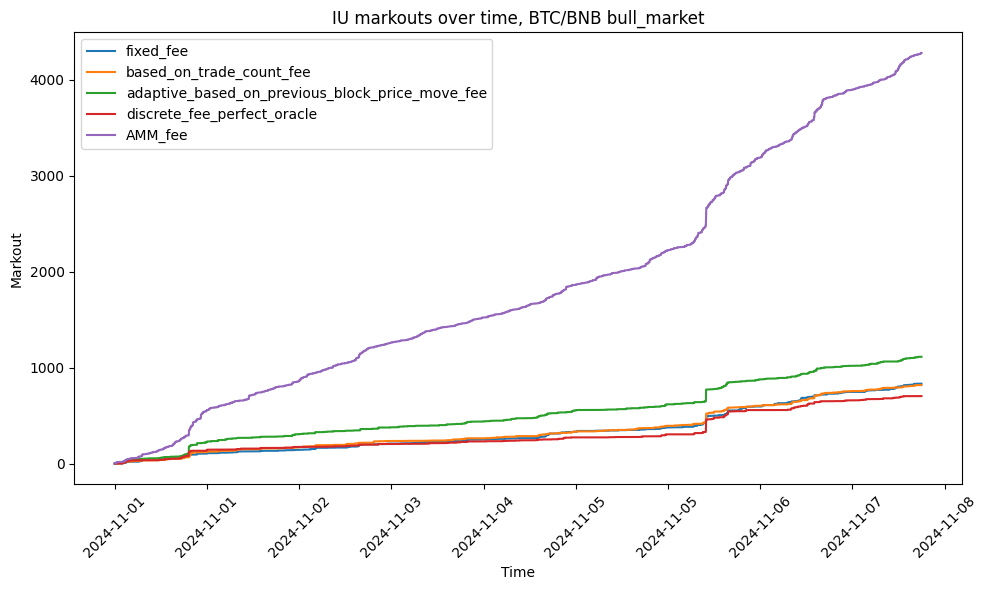

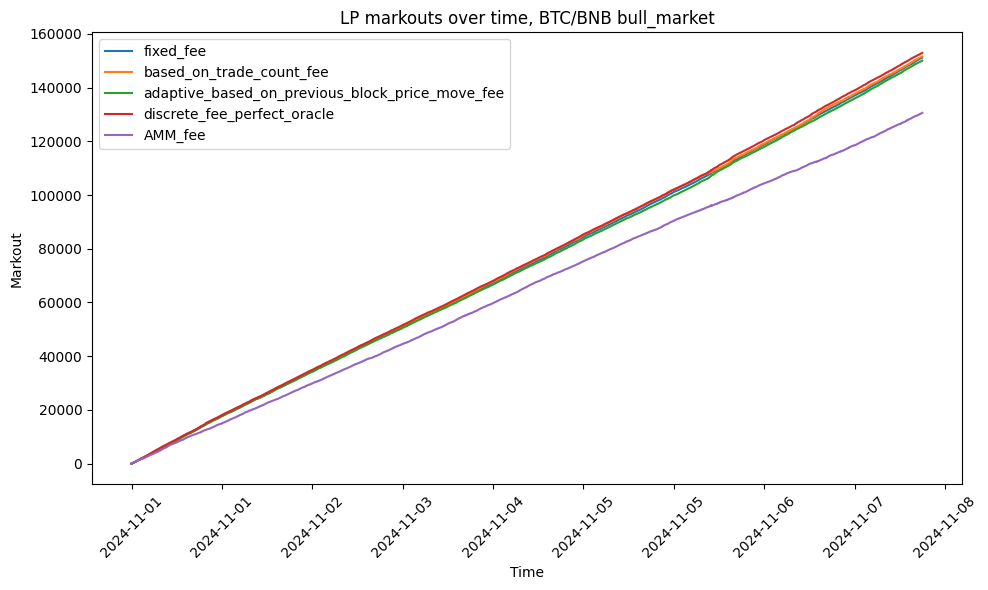

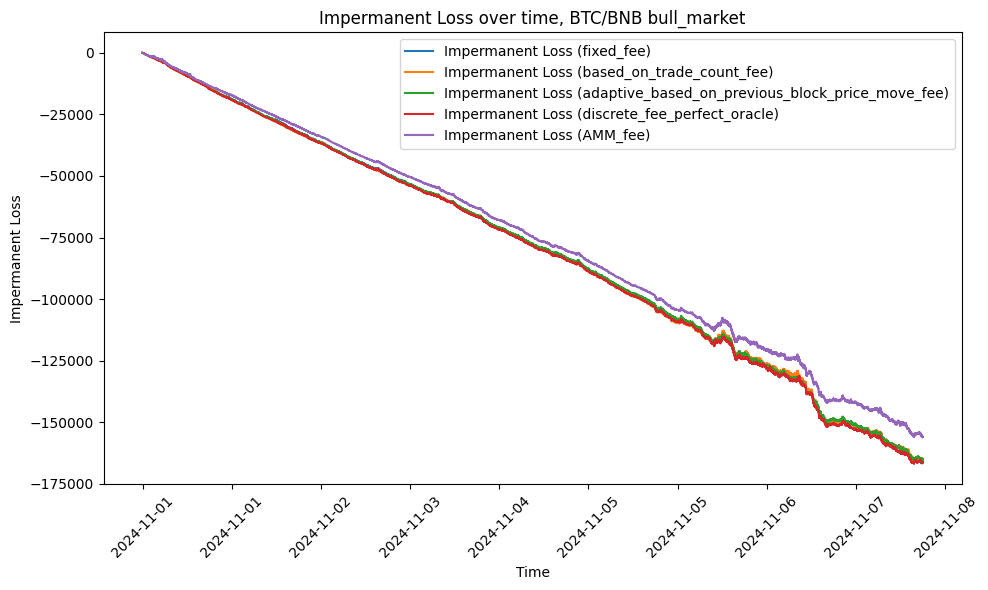

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,832.99,416,2.15,-282909.05,25039,-56.58,151126.53,28.05,-166117.30
1,based_on_trade_count_fee,818.21,391,2.25,-284204.54,25040,-56.83,151568.34,28.25,-165506.89
2,adaptive_based_on_previous_block_price_move_fee,1113.50,476,2.49,-283189.98,25094,-56.50,150002.67,27.47,-165253.18
3,discrete_fee_perfect_oracle,703.36,273,2.70,-282601.37,25053,-56.48,152912.44,29.05,-166528.46
4,AMM_fee,4278.72,1849,2.45,-284463.68,25168,-56.60,130571.44,19.29,-156041.77


In [ ]:
plot_results_for_period(
    "BTC/BNB bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

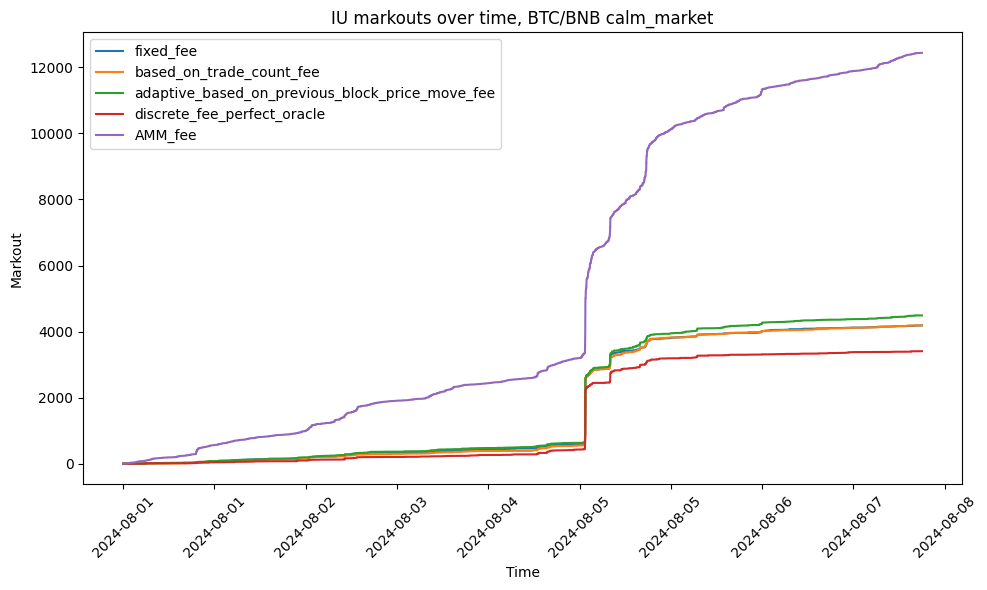

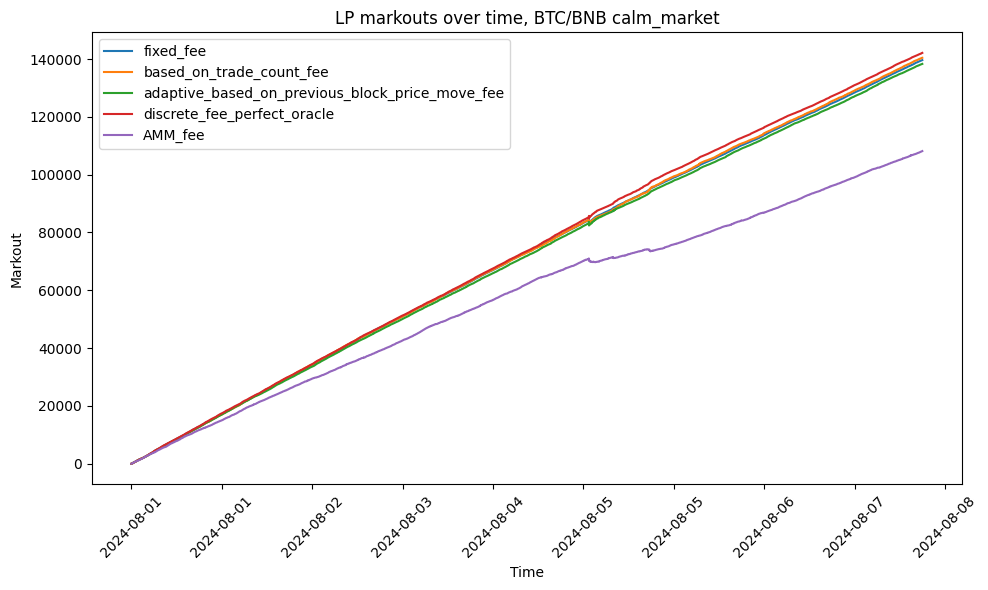

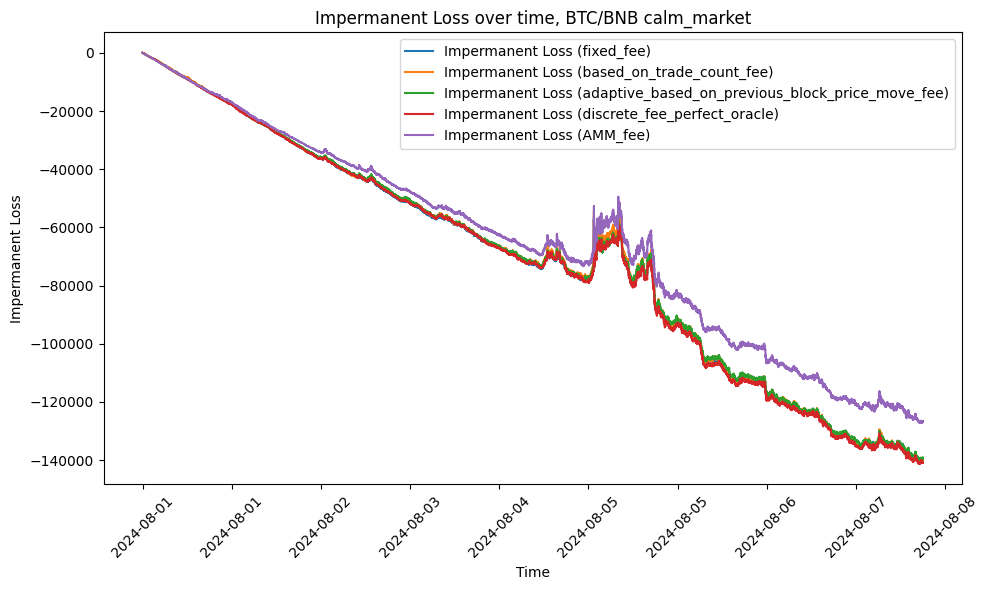

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,4186.98,610,7.00,-267984.06,24999,-59.21,139631.55,27.25,-140045.88
1,based_on_trade_count_fee,4187.51,571,7.39,-269426.39,25066,-59.37,140425.18,27.51,-139984.43
2,adaptive_based_on_previous_block_price_move_fee,4490.02,673,6.77,-267065.54,25001,-59.01,138318.37,26.66,-139422.30
3,discrete_fee_perfect_oracle,3406.36,406,8.34,-268065.61,25036,-59.15,142127.81,28.77,-140883.55
4,AMM_fee,12437.81,2483,5.12,-268984.67,25060,-59.33,108153.41,15.54,-126899.23


In [ ]:
plot_results_for_period(
    "BTC/BNB calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

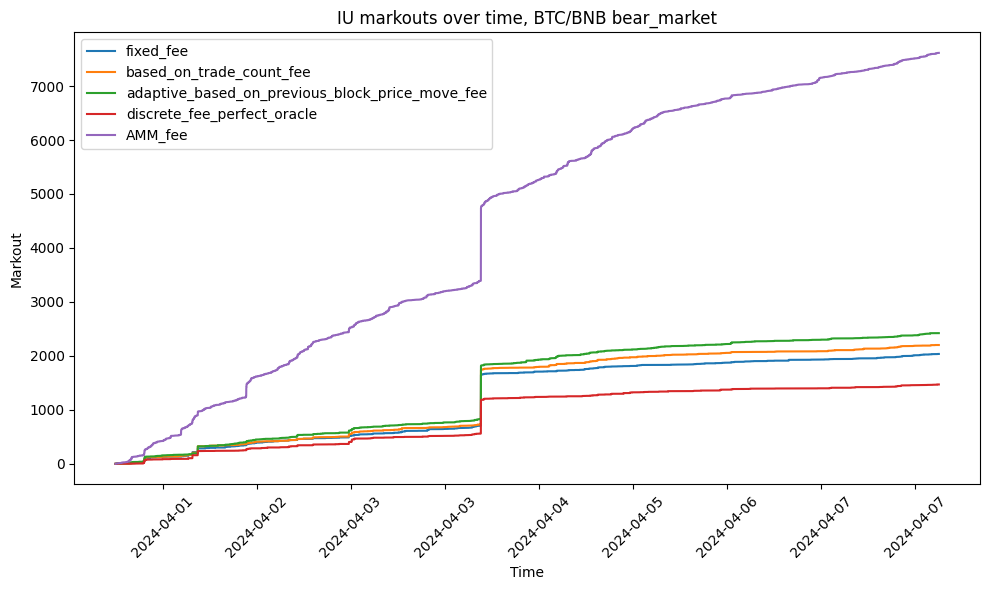

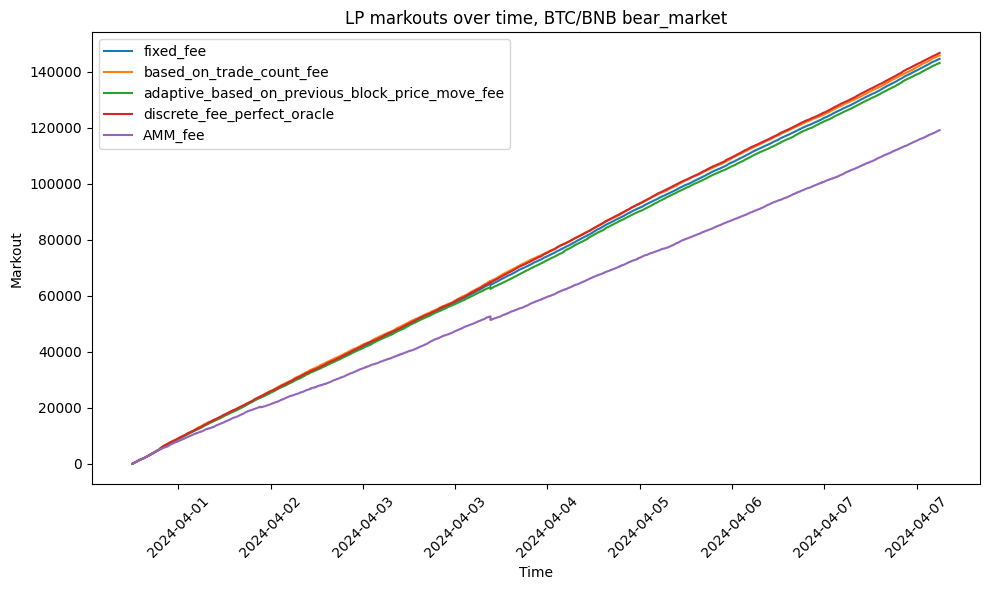

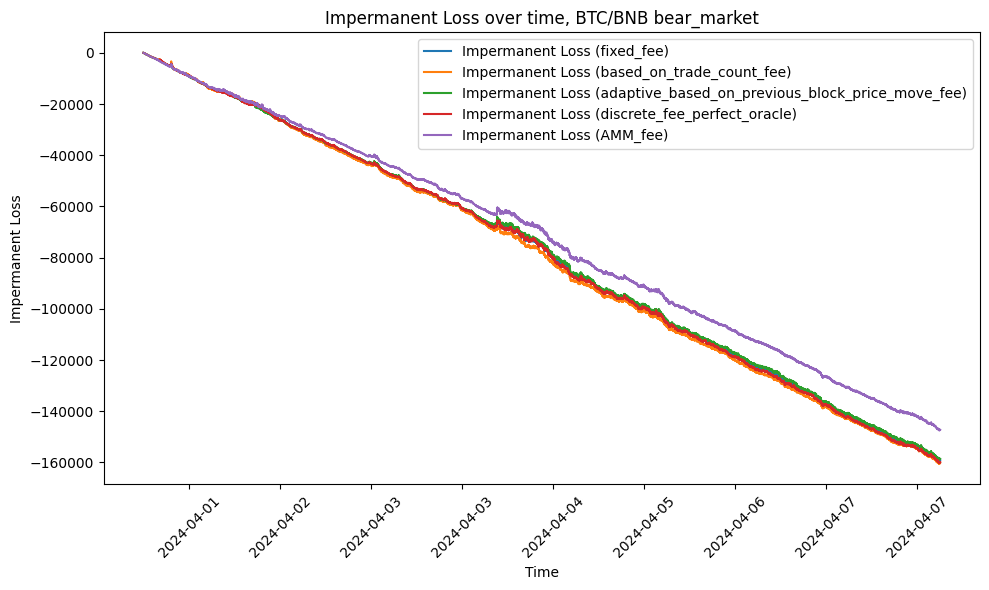

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,2035.61,467,4.62,-276218.30,25083,-57.97,144579.74,27.77,-159213.76
1,based_on_trade_count_fee,2201.40,458,5.05,-276446.49,25047,-58.09,145775.84,28.06,-160287.05
2,adaptive_based_on_previous_block_price_move_fee,2421.40,578,4.44,-275513.41,25062,-57.86,143104.27,26.96,-158687.39
3,discrete_fee_perfect_oracle,1470.29,311,4.91,-275742.23,25025,-58.00,146700.94,29.03,-159969.54
4,AMM_fee,7615.27,2124,3.76,-276120.50,25142,-57.82,119116.31,17.52,-147340.72


In [ ]:
plot_results_for_period(
    "BTC/BNB bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

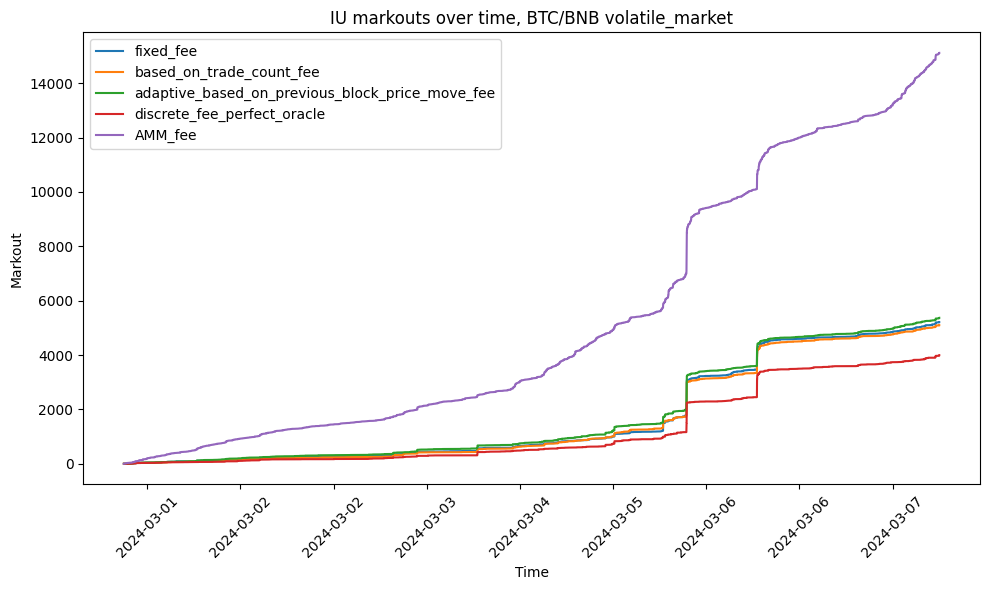

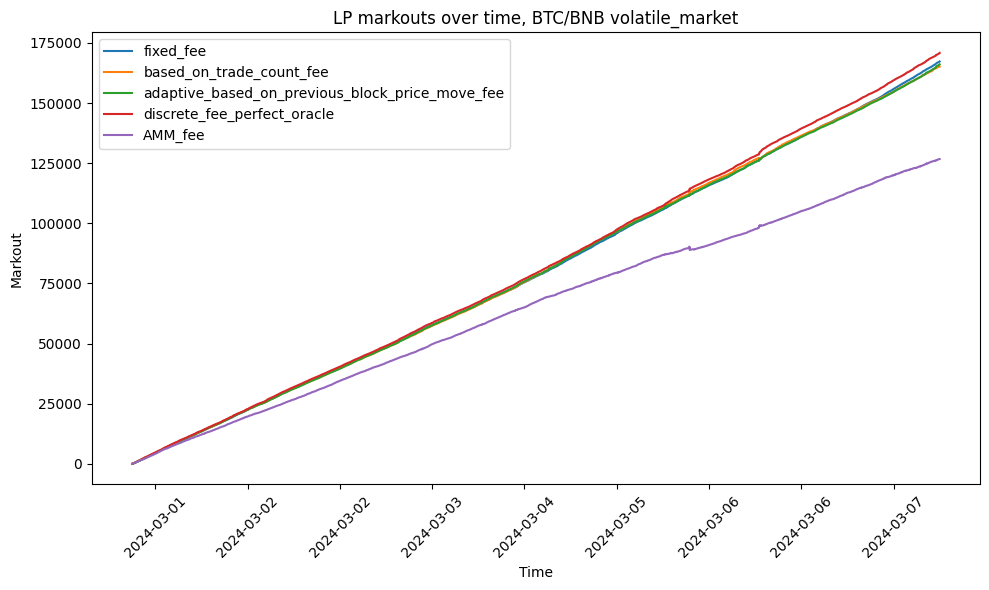

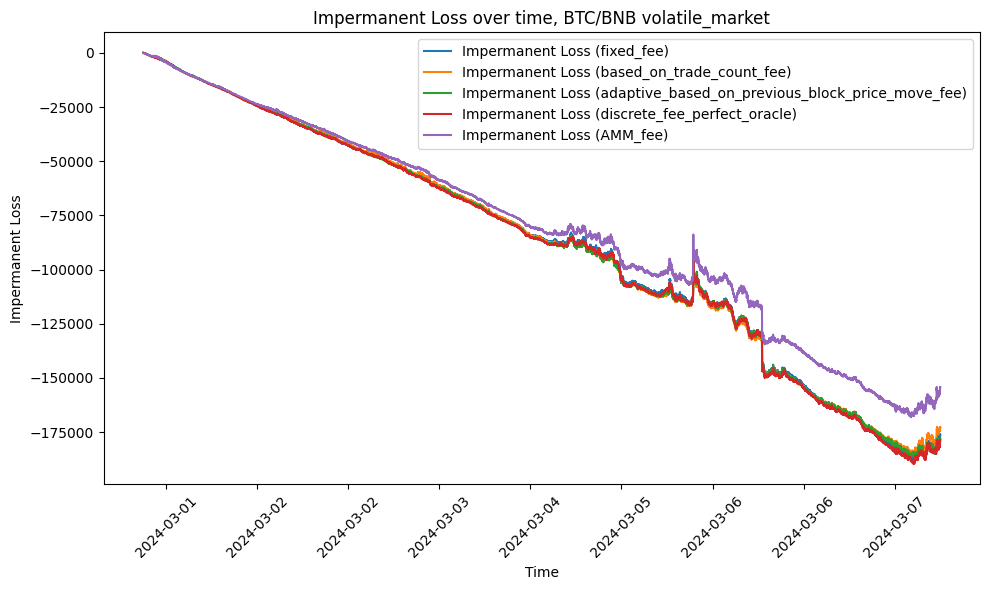

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,5213.24,821,5.74,-291587.14,25032,-55.61,167286.88,27.19,-176306.39
1,based_on_trade_count_fee,5101.31,800,5.74,-290234.98,24955,-55.53,165173.07,27.01,-173037.64
2,adaptive_based_on_previous_block_price_move_fee,5369.18,914,5.40,-291651.10,25036,-55.61,166084.51,26.62,-178277.19
3,discrete_fee_perfect_oracle,3997.74,578,6.15,-290918.22,24981,-55.61,170862.59,29.05,-178627.04
4,AMM_fee,15112.45,2993,4.66,-293000.89,25031,-55.91,126724.84,14.93,-154266.72


In [ ]:
plot_results_for_period(
    "BTC/BNB volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### ETH/BNB

##### bull_market

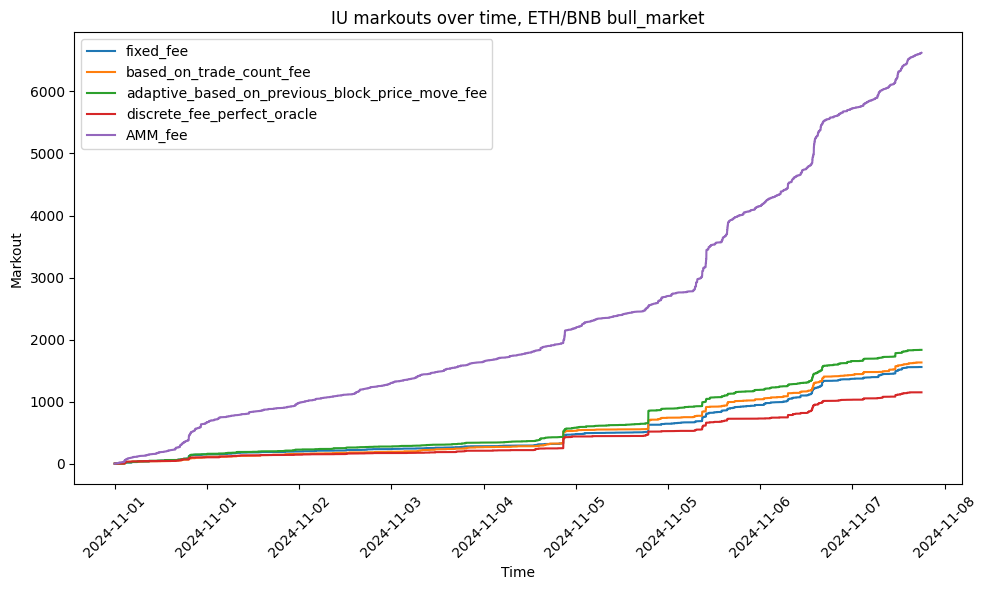

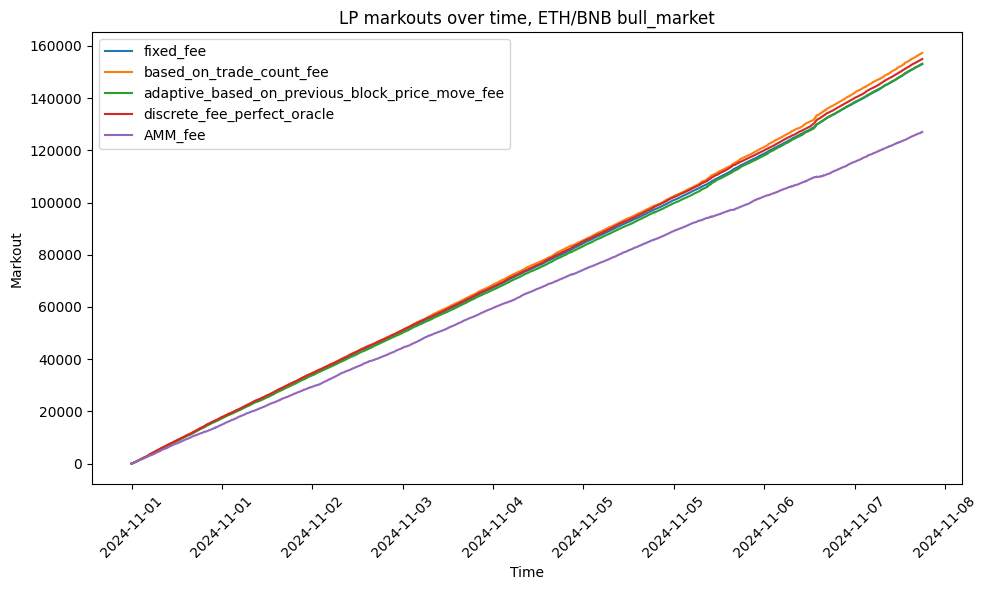

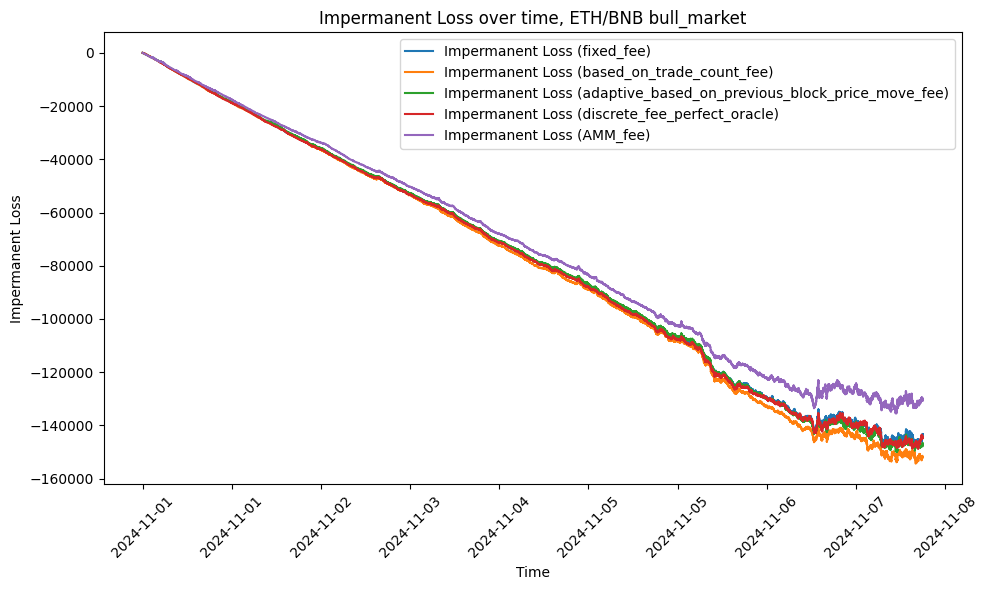

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,1557.62,472,3.33,-283427.92,25071,-56.49,153029.19,27.90,-143268.51
1,based_on_trade_count_fee,1630.86,462,3.56,-286048.82,25049,-57.05,157322.79,28.75,-151830.29
2,adaptive_based_on_previous_block_price_move_fee,1834.03,563,3.31,-284166.21,25088,-56.58,153169.69,27.47,-146689.76
3,discrete_fee_perfect_oracle,1149.58,332,3.47,-283021.45,25016,-56.52,155000.43,29.04,-144588.05
4,AMM_fee,6622.19,2088,3.21,-283212.31,25041,-56.53,127033.64,17.97,-130561.28


In [ ]:
plot_results_for_period(
    "ETH/BNB bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

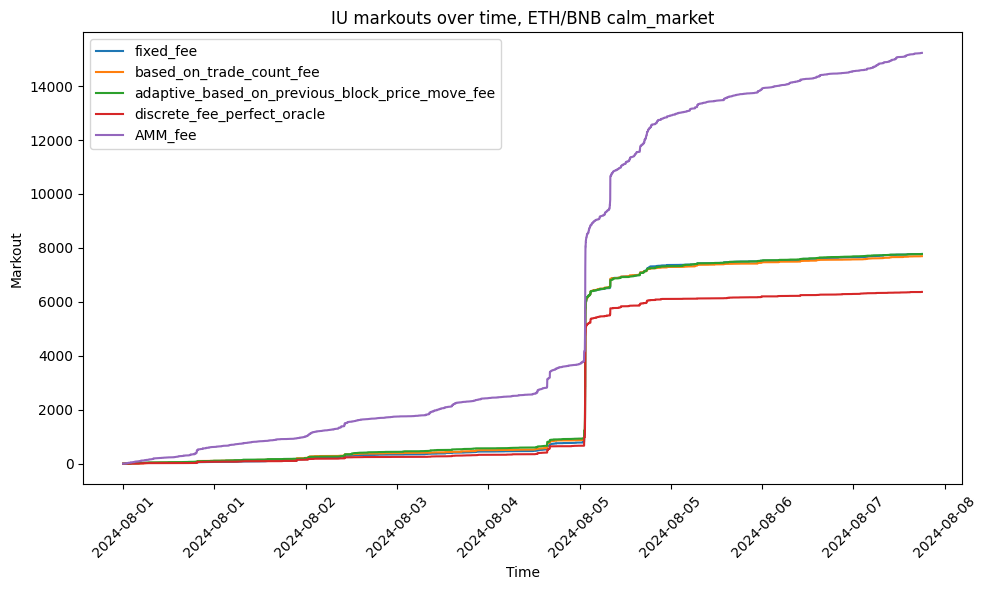

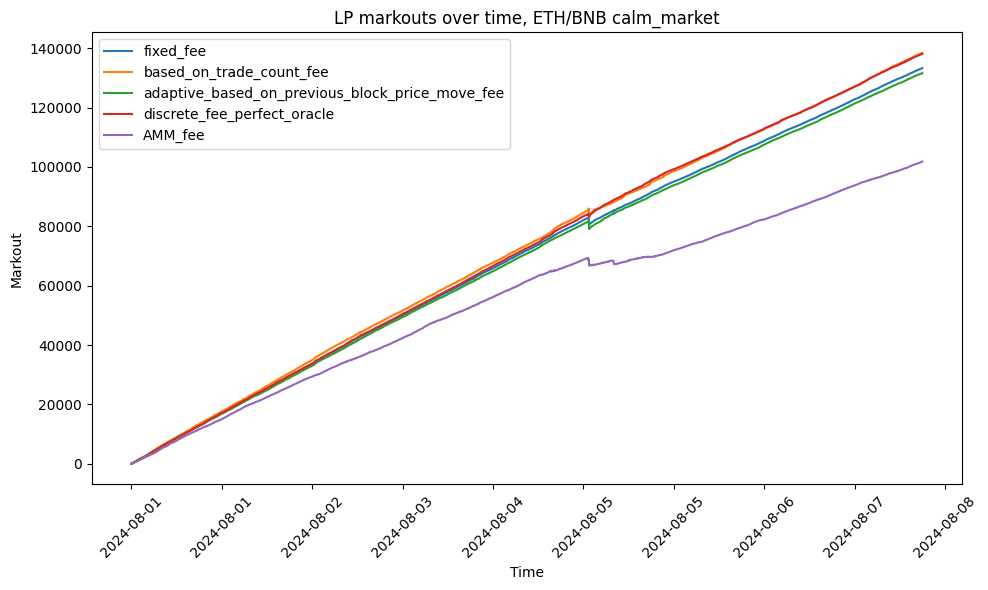

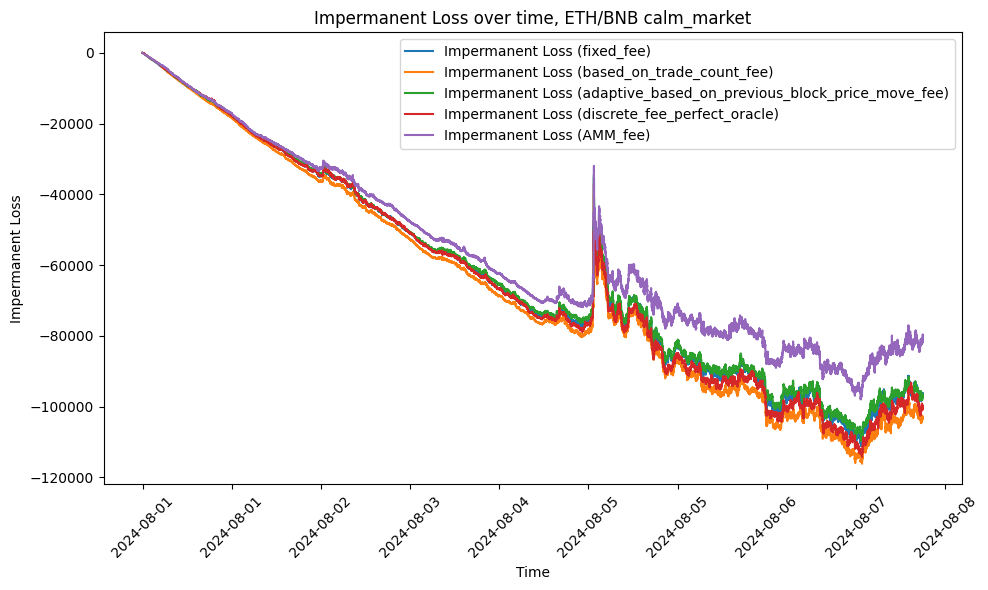

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,7776.69,620,11.98,-263535.50,25031,-60.18,133338.15,26.52,-96599.92
1,based_on_trade_count_fee,7693.69,616,11.93,-266397.51,25078,-60.70,138456.71,27.51,-103180.04
2,adaptive_based_on_previous_block_price_move_fee,7774.44,708,10.75,-263358.20,25032,-60.12,131652.76,25.80,-97172.80
3,discrete_fee_perfect_oracle,6368.89,459,12.99,-264230.54,25066,-60.25,138148.49,28.33,-100561.83
4,AMM_fee,15230.55,2441,6.41,-264194.62,25036,-60.40,101819.57,15.09,-80175.10


In [ ]:
plot_results_for_period(
    "ETH/BNB calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

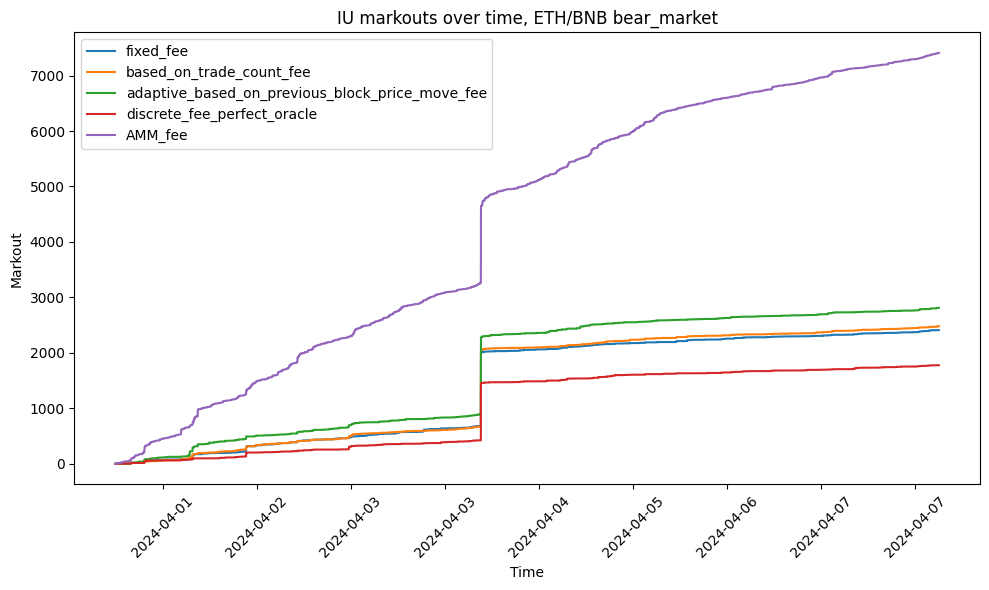

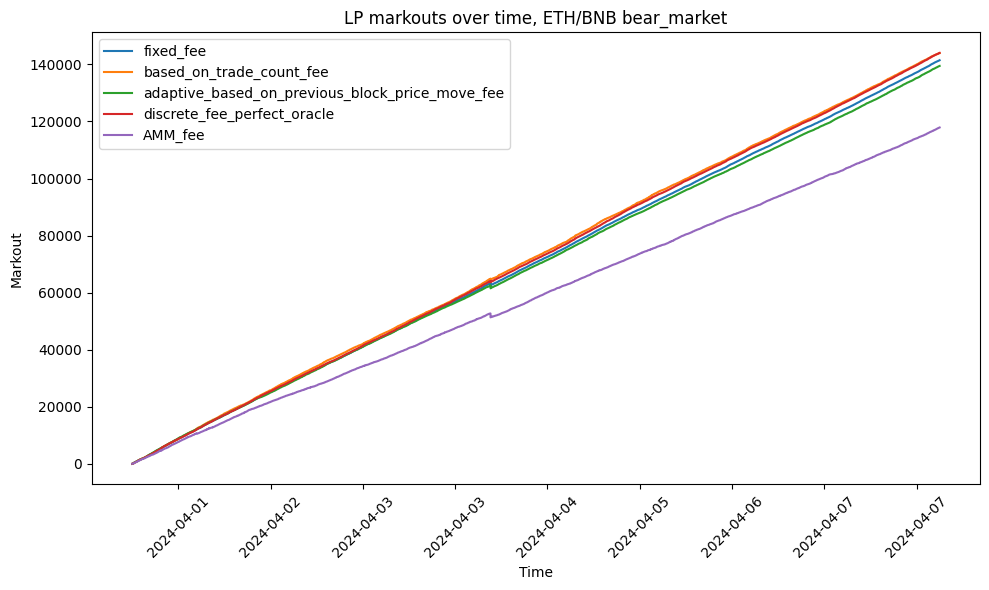

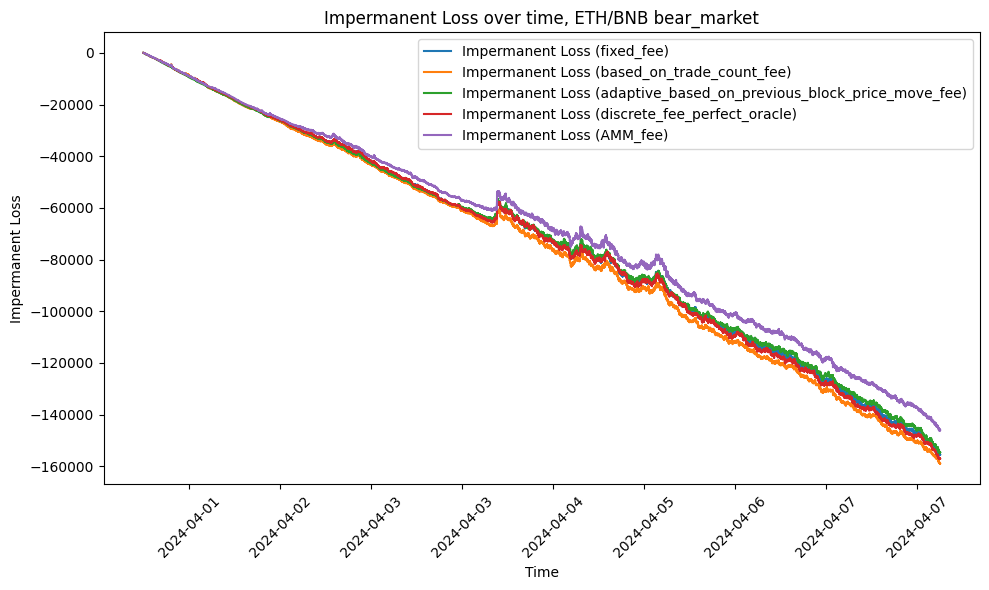

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,2410.11,425,5.93,-273518.04,25089,-58.22,141466.59,27.72,-155595.51
1,based_on_trade_count_fee,2480.83,450,5.80,-275375.71,25078,-58.65,143949.94,28.10,-159002.38
2,adaptive_based_on_previous_block_price_move_fee,2812.52,534,5.53,-273344.56,25037,-58.31,139474.68,26.84,-154537.33
3,discrete_fee_perfect_oracle,1777.06,297,6.23,-272852.14,25025,-58.24,144041.16,28.98,-157162.93
4,AMM_fee,7408.78,2204,3.59,-275277.51,25108,-58.59,117887.21,17.43,-146072.26


In [ ]:
plot_results_for_period(
    "ETH/BNB bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

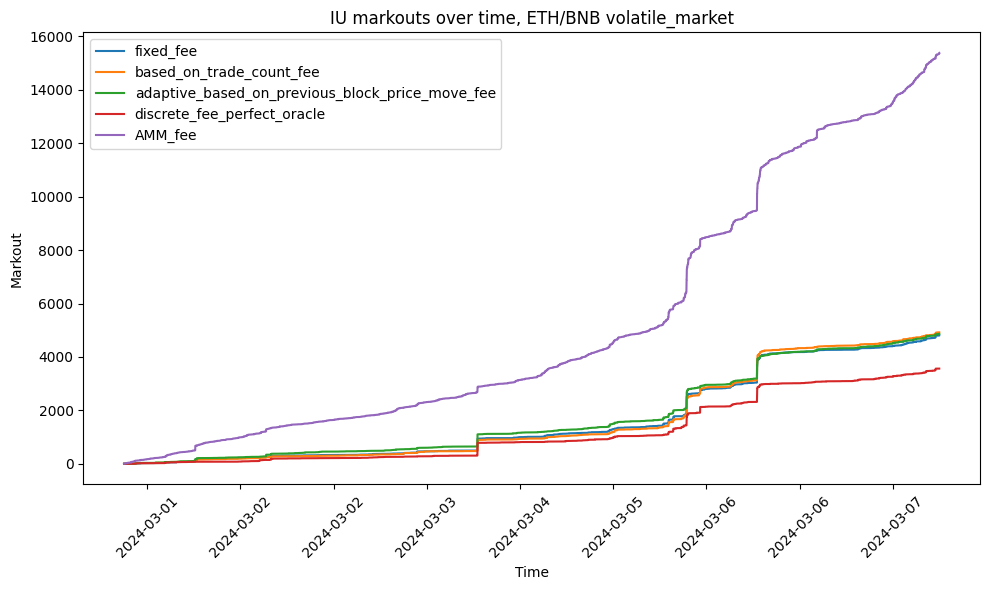

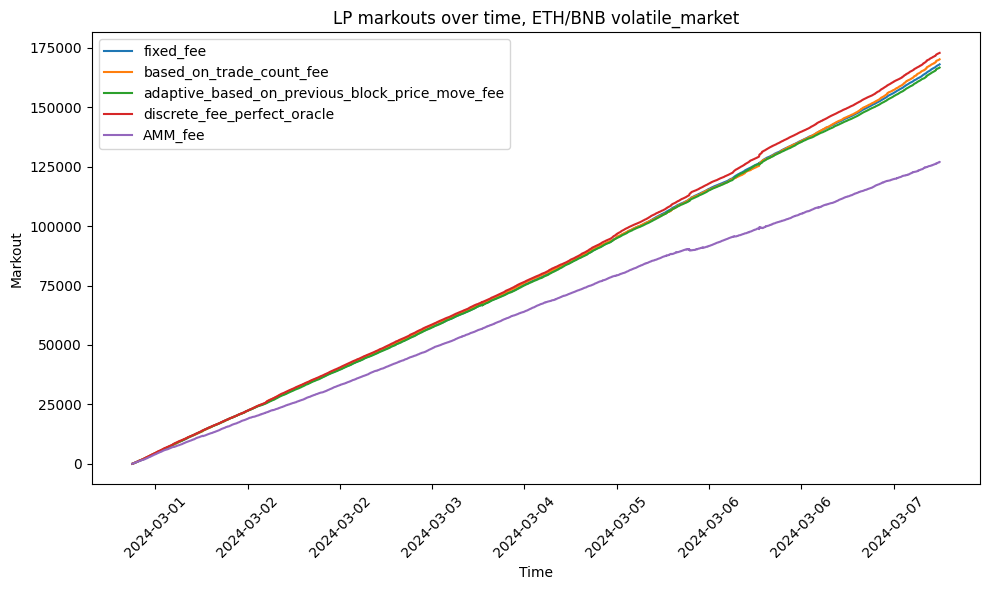

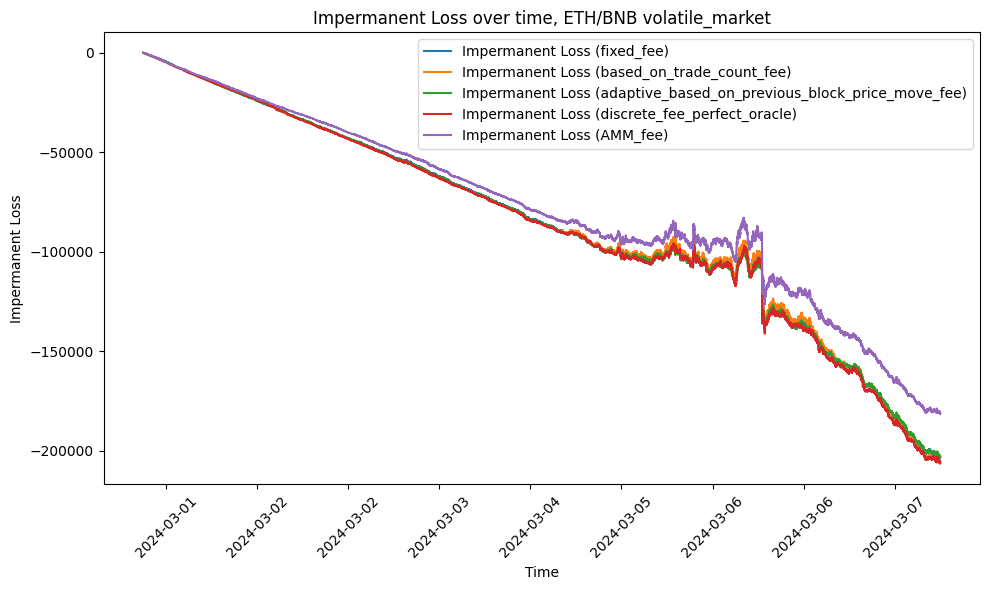

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,4818.44,776,5.60,-292973.24,25092,-55.28,168074.19,27.29,-203249.65
1,based_on_trade_count_fee,4922.17,765,5.76,-293628.12,25022,-55.57,170196.49,27.73,-205708.56
2,adaptive_based_on_previous_block_price_move_fee,4867.78,881,5.08,-292432.20,25027,-55.33,166712.02,26.70,-202990.00
3,discrete_fee_perfect_oracle,3564.21,547,5.80,-293791.51,25106,-55.41,172886.70,29.22,-206102.21
4,AMM_fee,15384.75,2918,4.80,-294487.68,25071,-55.64,126938.19,14.94,-181005.10


In [ ]:
plot_results_for_period(
    "ETH/BNB volatile_market",
    list(fee_algos_to_consider.keys()),
)

### Results: Non-stable / Non-stable (USDT-priced)

#### ETH/BTC

##### bull_market

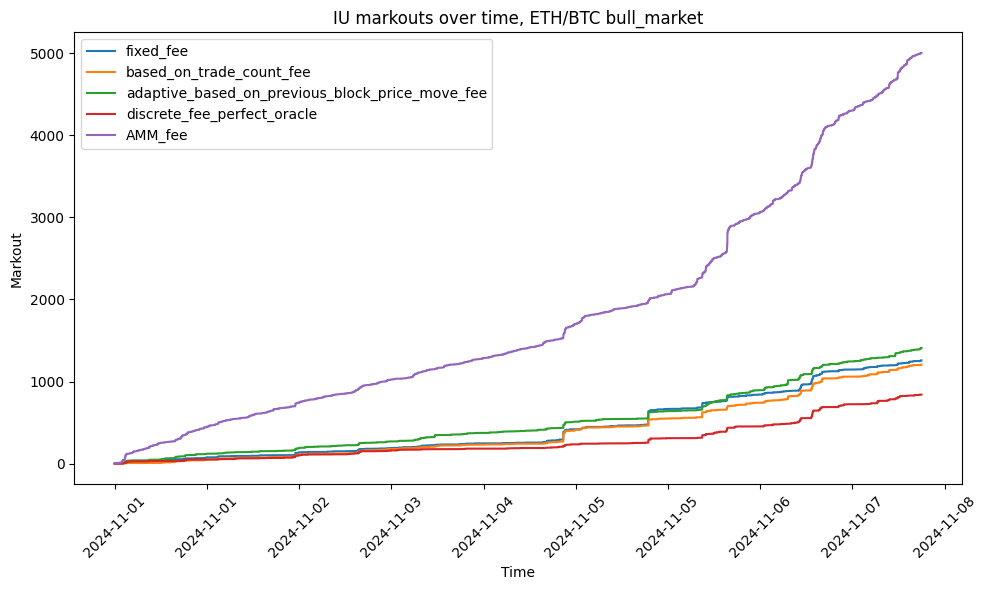

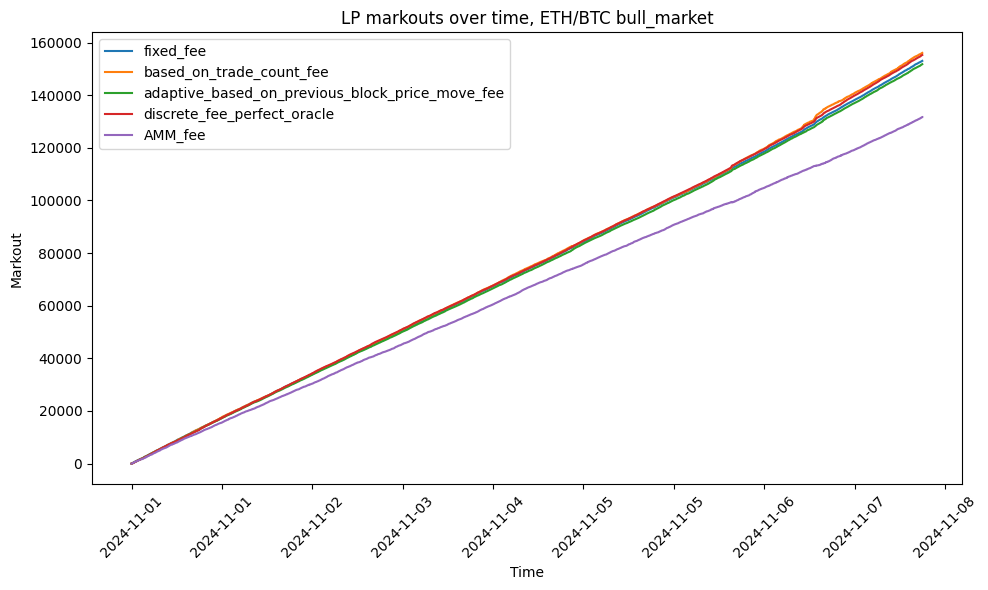

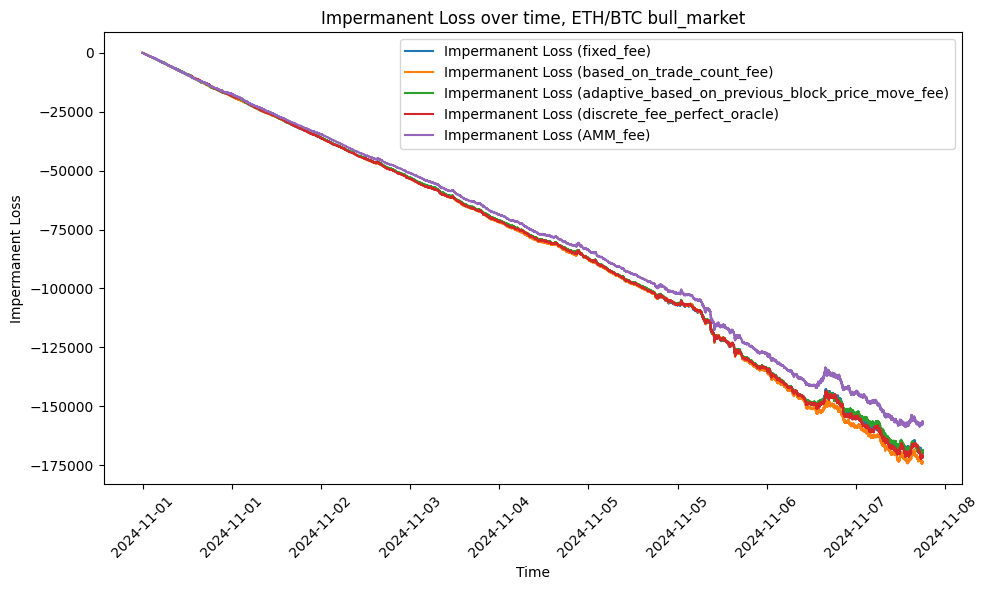

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,1257.44,446,2.92,-284008.13,25033,-56.34,153045.48,27.97,-168976.67
1,based_on_trade_count_fee,1205.55,446,2.80,-286154.15,25007,-56.82,156077.27,28.55,-173750.31
2,adaptive_based_on_previous_block_price_move_fee,1409.27,536,2.72,-284403.98,25059,-56.35,151792.89,27.27,-168825.03
3,discrete_fee_perfect_oracle,840.74,305,2.80,-284525.06,25009,-56.48,155284.17,29.09,-171814.99
4,AMM_fee,5002.60,1910,2.71,-285932.92,25035,-56.72,131710.96,19.13,-156966.15


In [ ]:
plot_results_for_period(
    "ETH/BTC bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

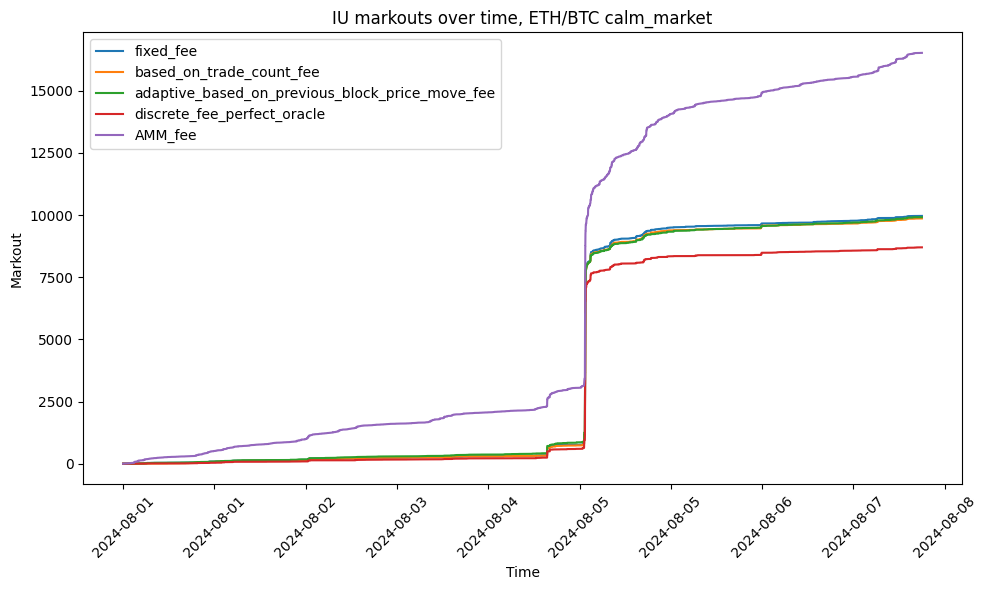

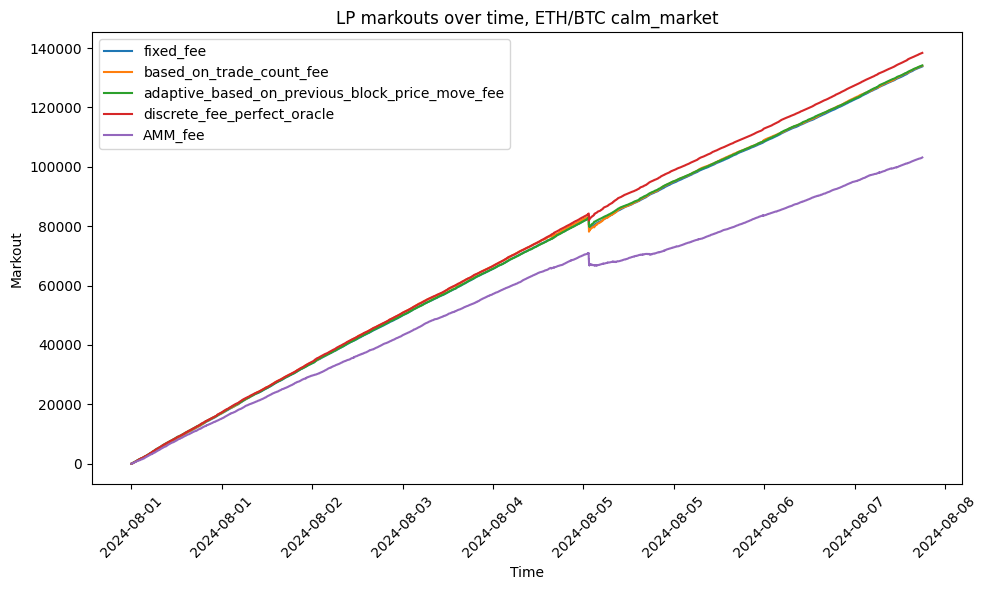

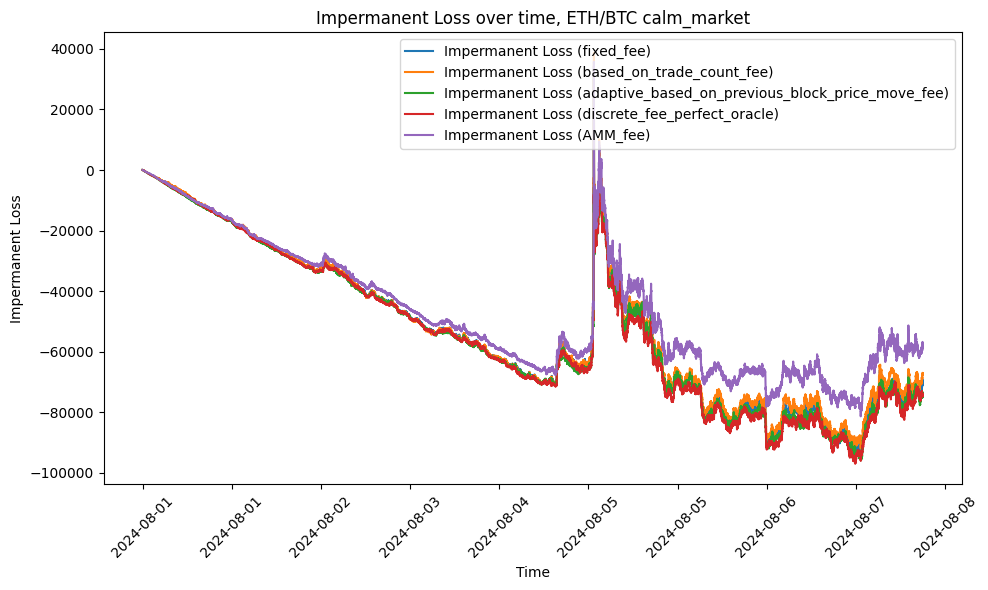

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,9966.54,612,14.76,-264773.25,25082,-59.57,133816.65,26.13,-69675.94
1,based_on_trade_count_fee,9865.40,604,14.75,-267095.08,25056,-60.14,134035.04,26.23,-67227.60
2,adaptive_based_on_previous_block_price_move_fee,9915.38,691,13.30,-264951.10,25072,-59.61,134174.43,25.85,-73906.60
3,discrete_fee_perfect_oracle,8702.49,427,17.47,-265444.70,25051,-59.77,138394.41,28.02,-74429.27
4,AMM_fee,16524.38,2366,7.09,-265253.85,25011,-59.88,103159.05,15.26,-58101.88


In [ ]:
plot_results_for_period(
    "ETH/BTC calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

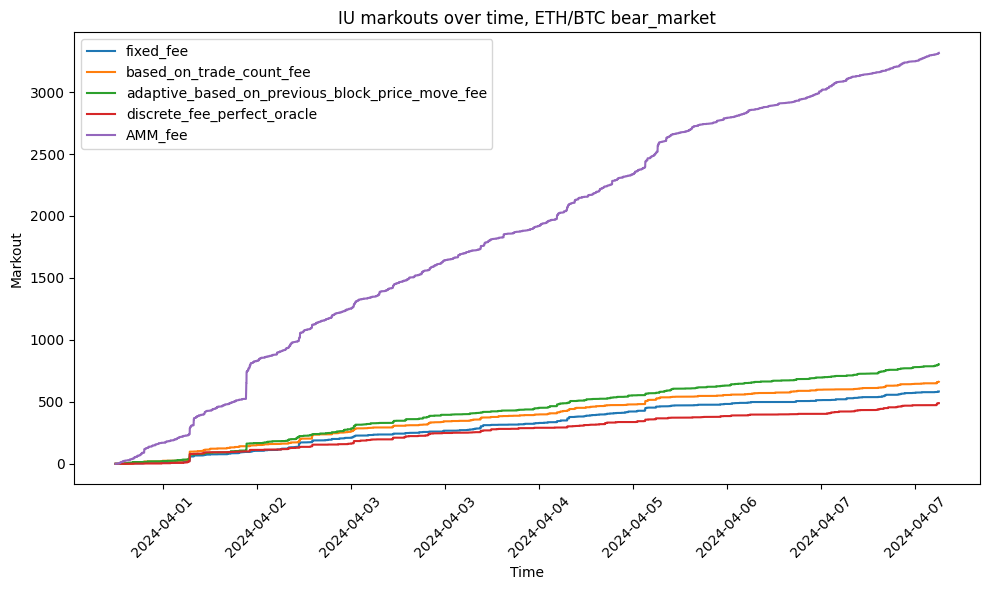

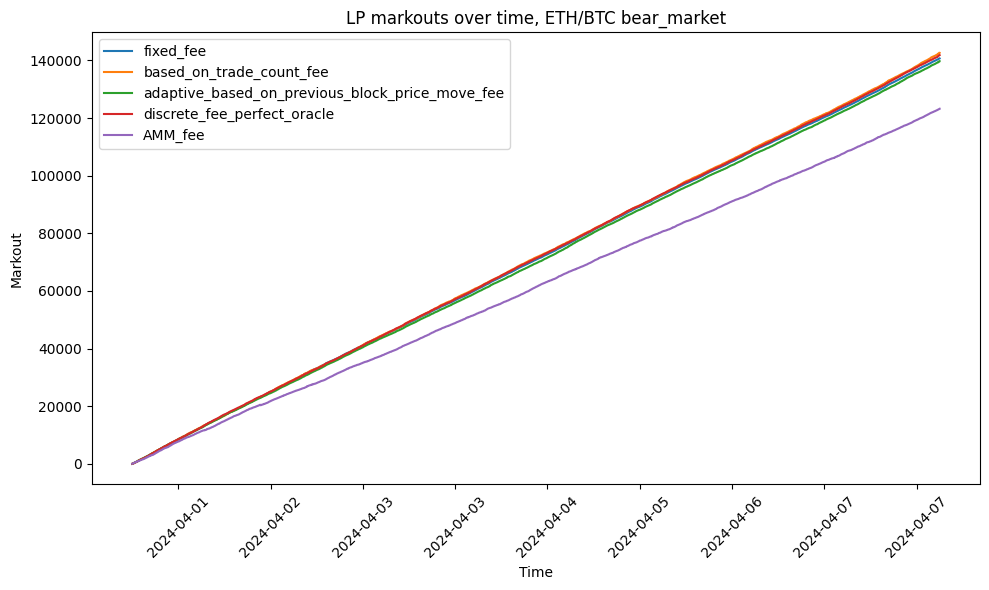

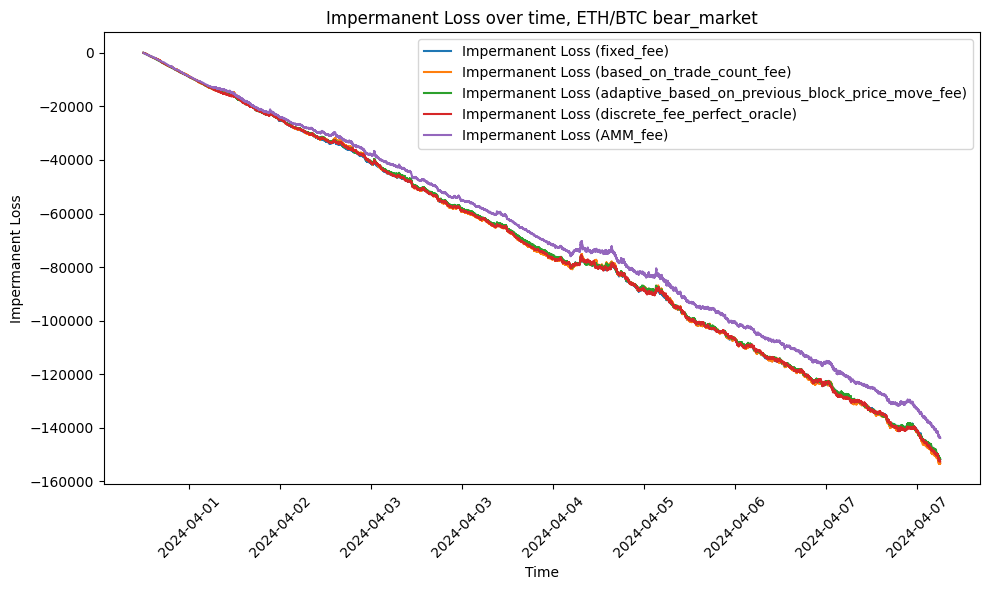

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,583.59,346,1.93,-273236.61,25103,-58.13,140665.39,28.12,-151945.59
1,based_on_trade_count_fee,661.19,342,2.18,-274910.46,25022,-58.70,142605.00,28.60,-153448.34
2,adaptive_based_on_previous_block_price_move_fee,802.20,449,2.02,-273598.18,25088,-58.27,139699.14,27.44,-151668.64
3,discrete_fee_perfect_oracle,489.67,247,2.22,-273127.89,25018,-58.32,141836.34,28.93,-152636.76
4,AMM_fee,3316.34,1619,2.29,-273816.23,25116,-58.28,123216.16,20.05,-143783.46


In [ ]:
plot_results_for_period(
    "ETH/BTC bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

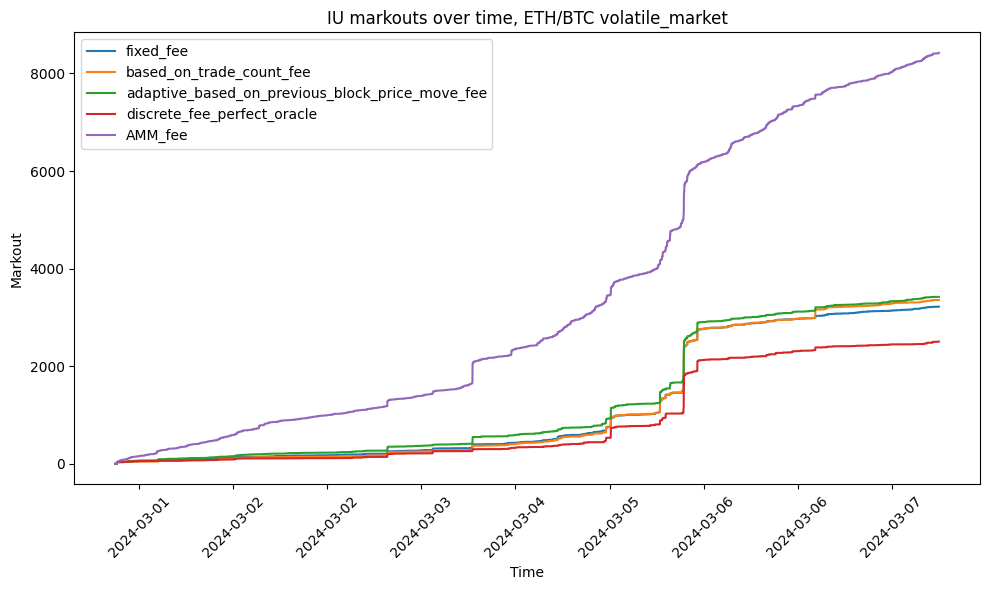

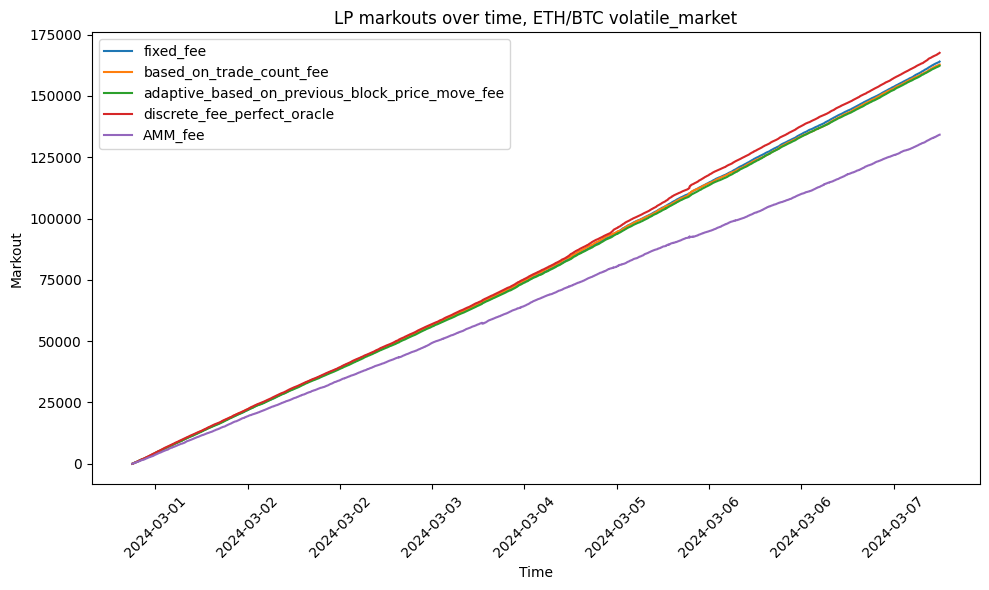

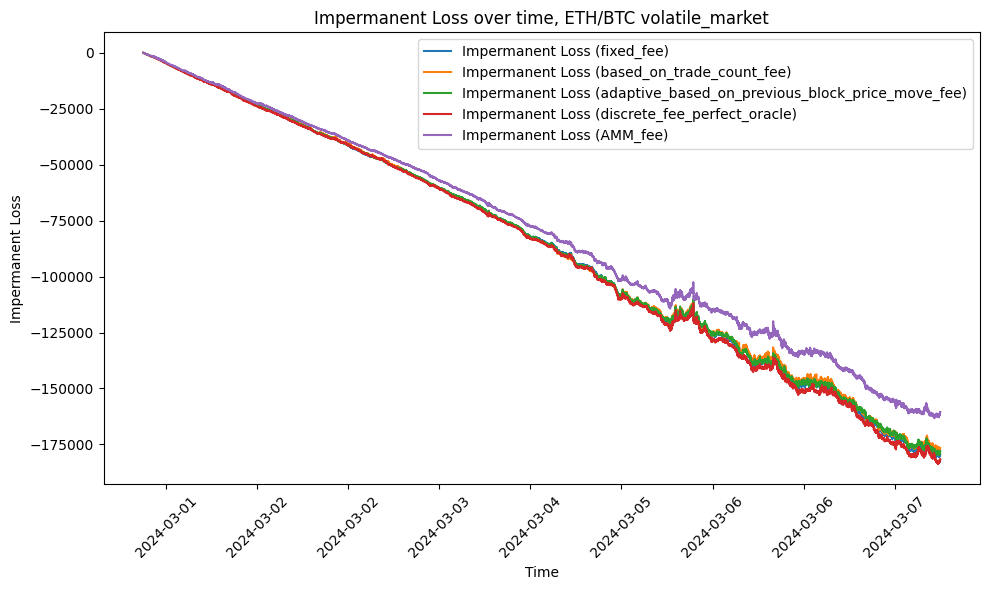

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,3222.17,591,5.10,-292221.12,25026,-55.04,164010.43,27.61,-179275.80
1,based_on_trade_count_fee,3358.73,568,5.49,-291723.75,25037,-54.94,162808.59,27.49,-176669.45
2,adaptive_based_on_previous_block_price_move_fee,3421.59,651,4.93,-291820.99,25070,-54.86,162322.40,26.99,-177994.43
3,discrete_fee_perfect_oracle,2504.91,407,5.61,-294072.34,25055,-55.33,167564.56,29.09,-181571.56
4,AMM_fee,8422.10,2265,3.60,-292856.63,25112,-55.00,134204.51,17.51,-160523.59


In [ ]:
plot_results_for_period(
    "ETH/BTC volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### BNB/ETH

##### bull_market

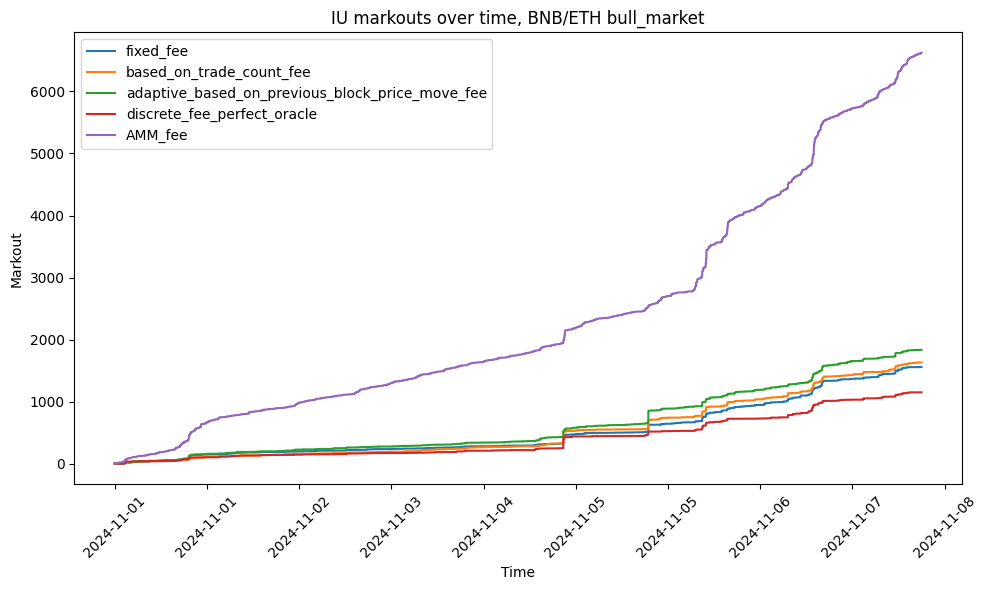

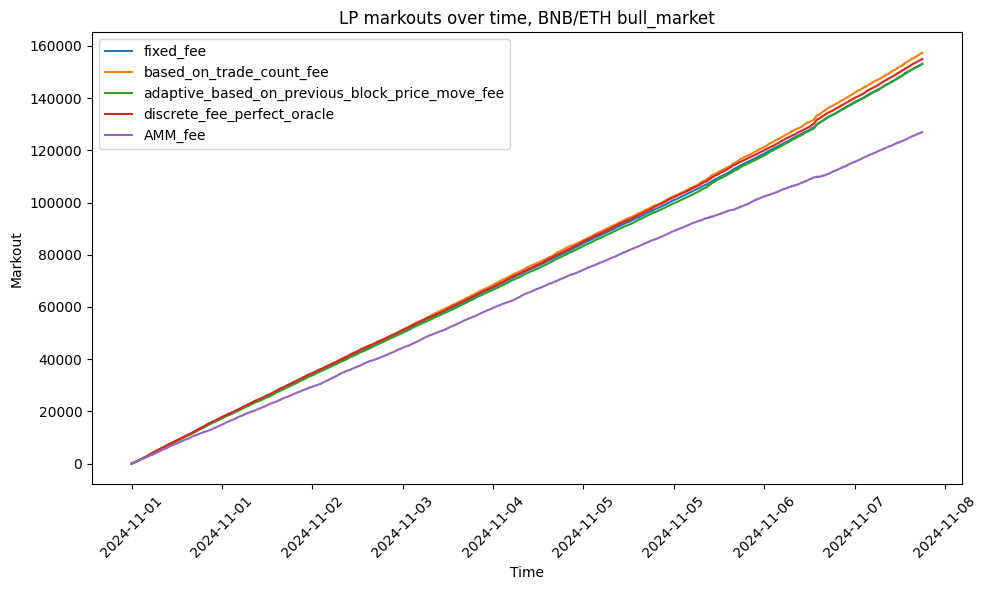

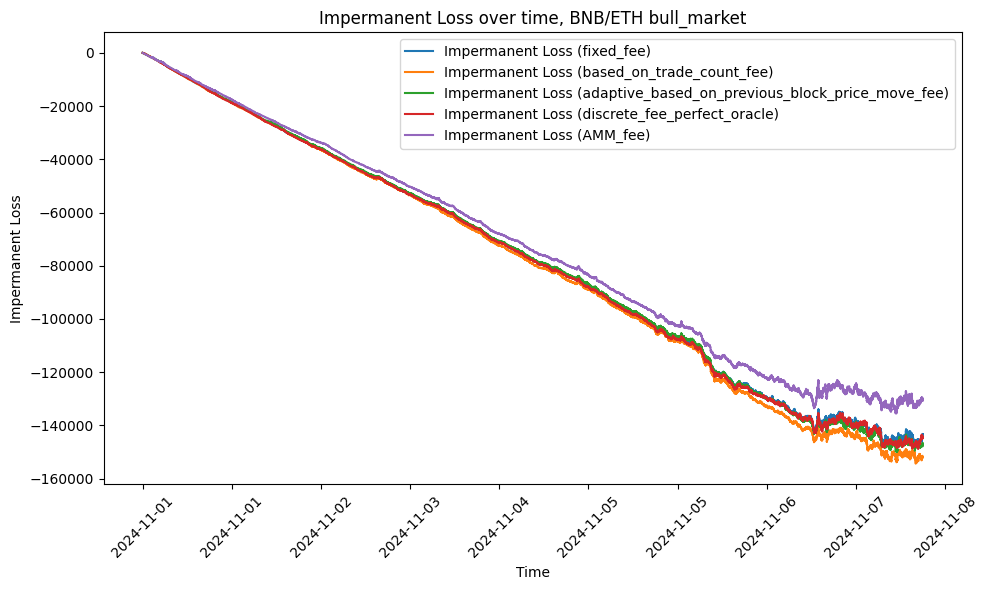

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,1557.62,472,3.33,-283427.92,25071,-56.49,153029.19,27.90,-143268.51
1,based_on_trade_count_fee,1630.86,462,3.56,-286048.82,25049,-57.05,157322.79,28.75,-151830.29
2,adaptive_based_on_previous_block_price_move_fee,1834.03,563,3.31,-284166.21,25088,-56.58,153169.69,27.47,-146689.76
3,discrete_fee_perfect_oracle,1149.58,332,3.47,-283021.45,25016,-56.52,155000.43,29.04,-144588.05
4,AMM_fee,6622.19,2088,3.21,-283212.31,25041,-56.53,127033.64,17.97,-130561.28


In [ ]:
plot_results_for_period(
    "BNB/ETH bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

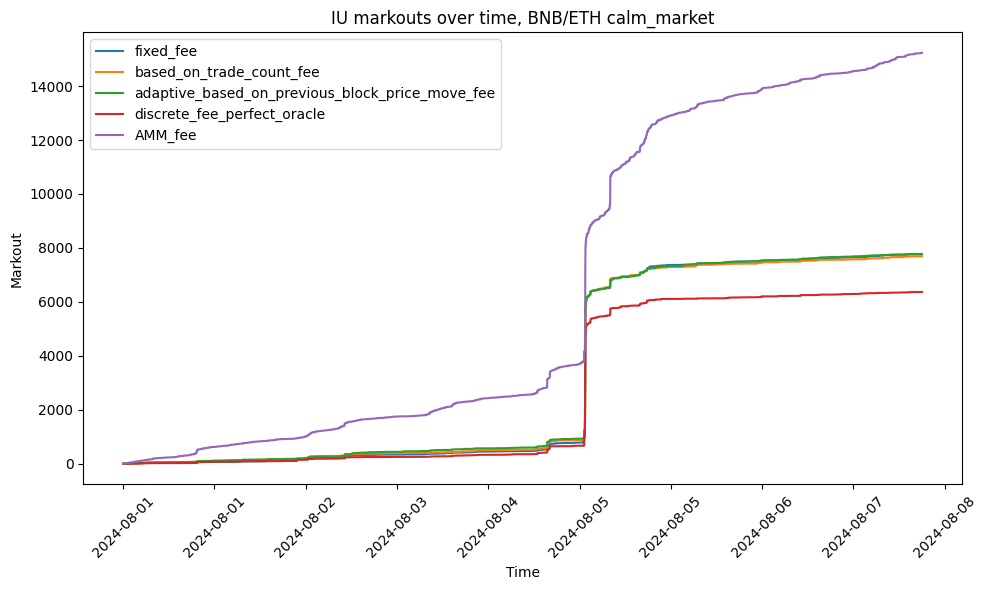

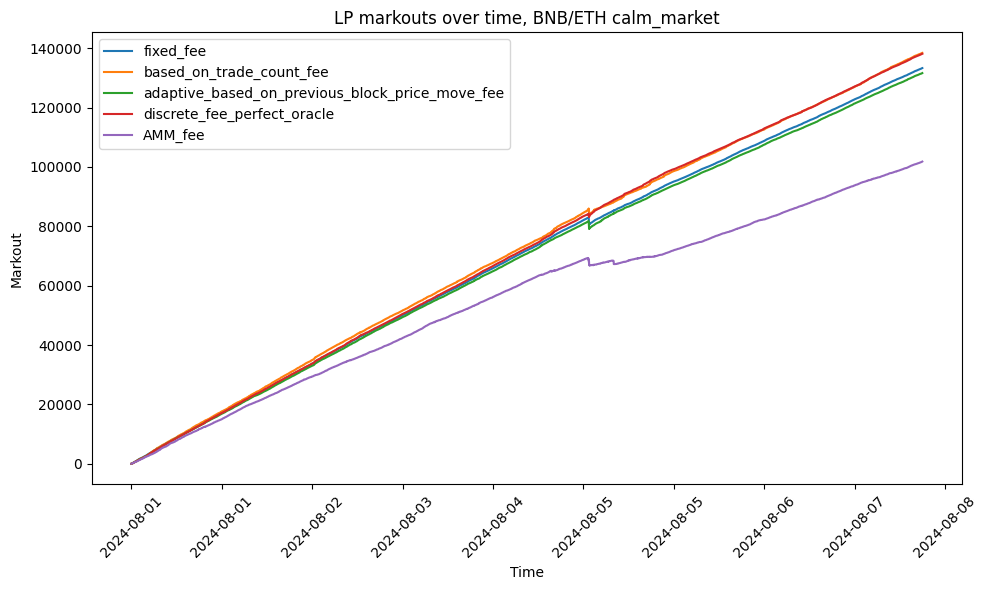

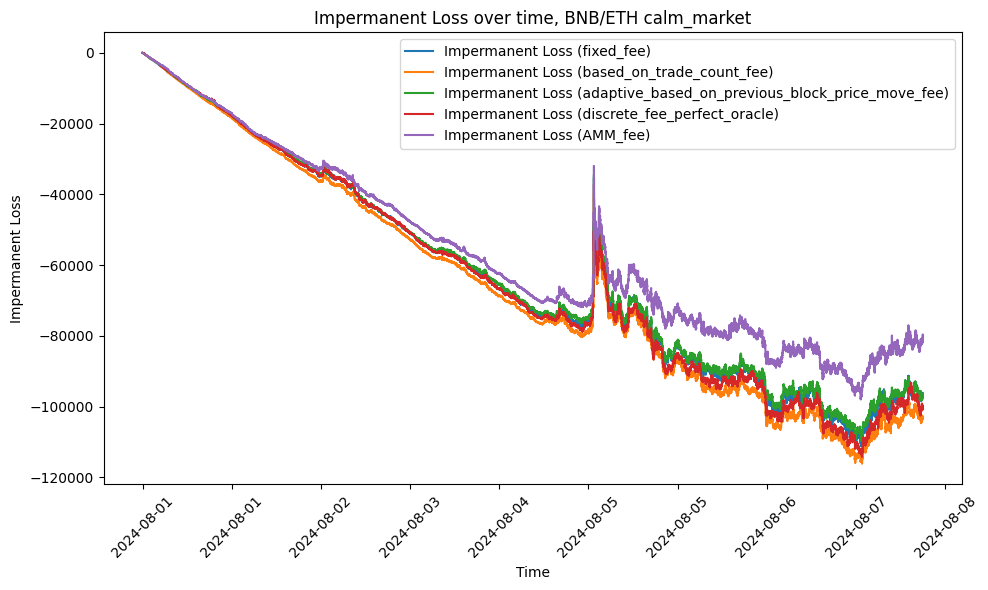

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,7776.69,620,11.98,-263535.50,25031,-60.18,133338.15,26.52,-96599.92
1,based_on_trade_count_fee,7693.69,616,11.93,-266397.51,25078,-60.70,138456.71,27.51,-103180.04
2,adaptive_based_on_previous_block_price_move_fee,7774.44,708,10.75,-263358.20,25032,-60.12,131652.76,25.80,-97172.80
3,discrete_fee_perfect_oracle,6368.89,459,12.99,-264230.54,25066,-60.25,138148.49,28.33,-100561.83
4,AMM_fee,15230.55,2441,6.41,-264194.62,25036,-60.40,101819.57,15.09,-80175.10


In [ ]:
plot_results_for_period(
    "BNB/ETH calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

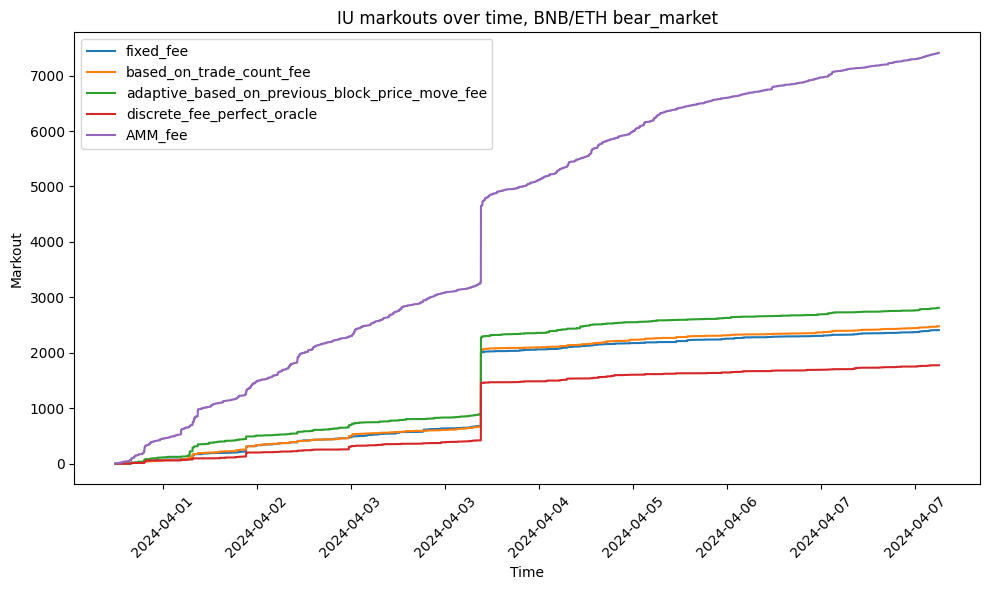

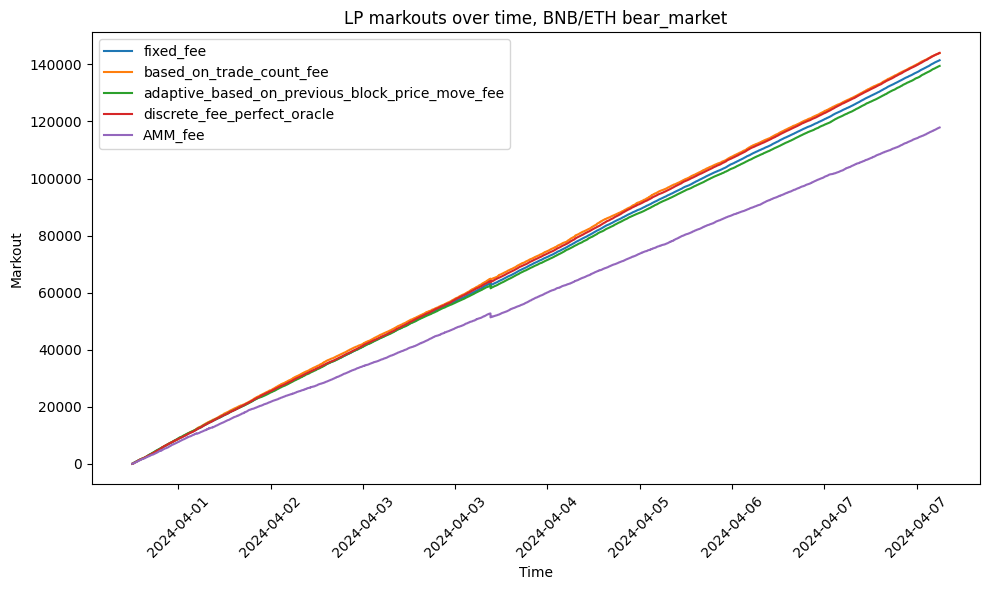

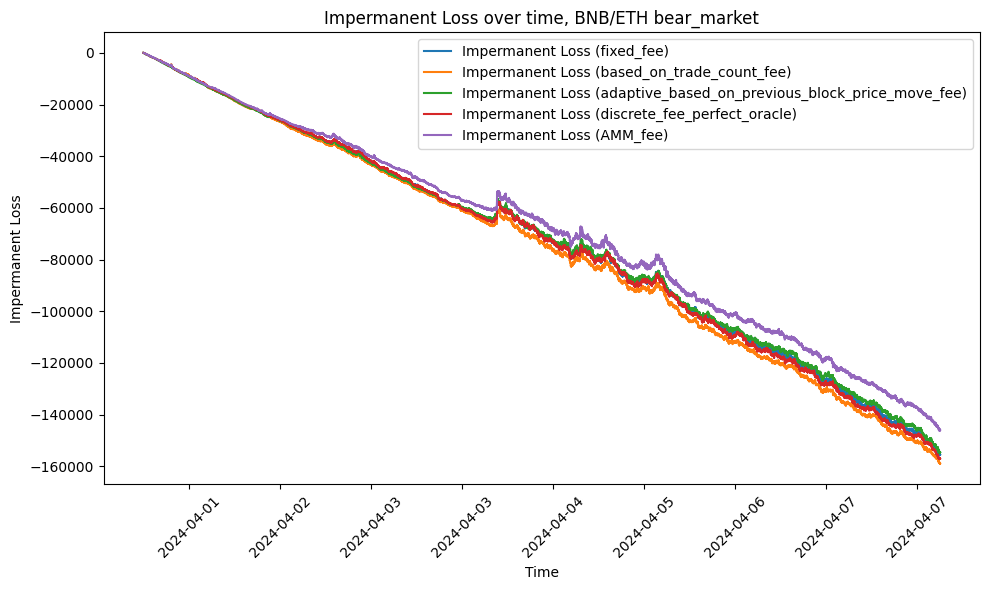

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,2410.11,425,5.93,-273518.04,25089,-58.22,141466.59,27.72,-155595.51
1,based_on_trade_count_fee,2480.83,450,5.80,-275375.71,25078,-58.65,143949.94,28.10,-159002.38
2,adaptive_based_on_previous_block_price_move_fee,2812.52,534,5.53,-273344.56,25037,-58.31,139474.68,26.84,-154537.33
3,discrete_fee_perfect_oracle,1777.06,297,6.23,-272852.14,25025,-58.24,144041.16,28.98,-157162.93
4,AMM_fee,7408.78,2204,3.59,-275277.51,25108,-58.59,117887.21,17.43,-146072.26


In [ ]:
plot_results_for_period(
    "BNB/ETH bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

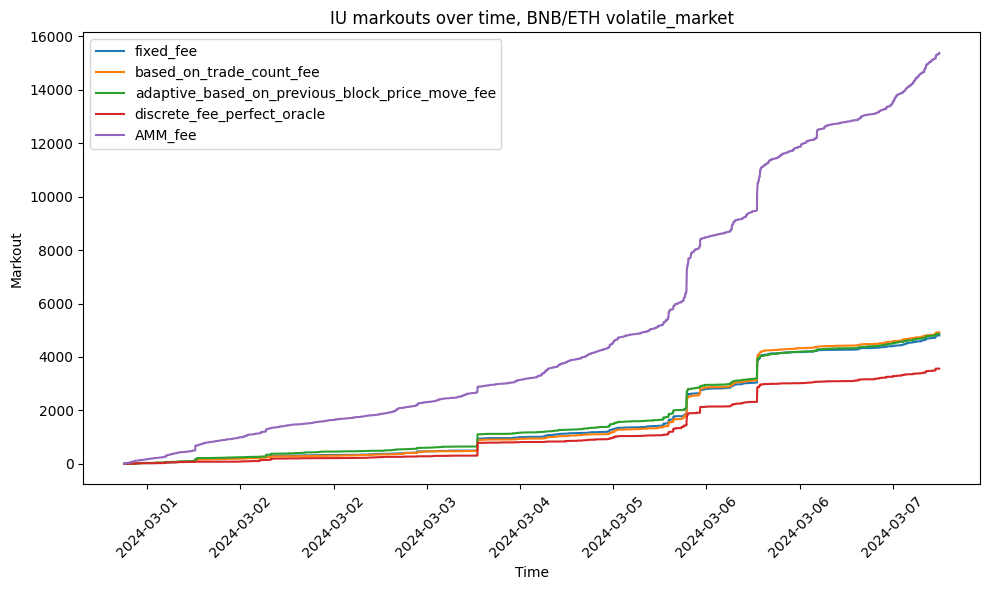

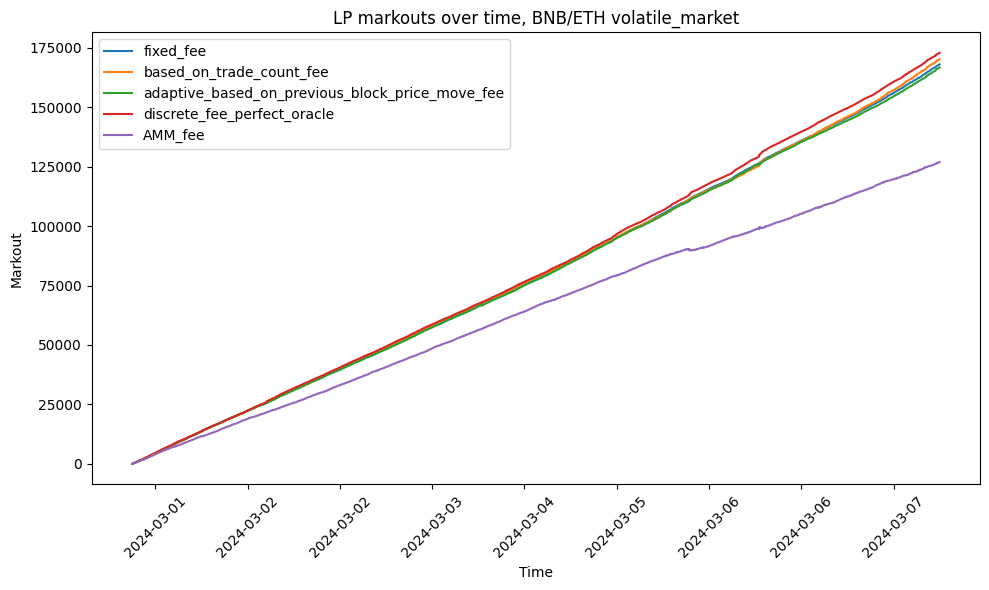

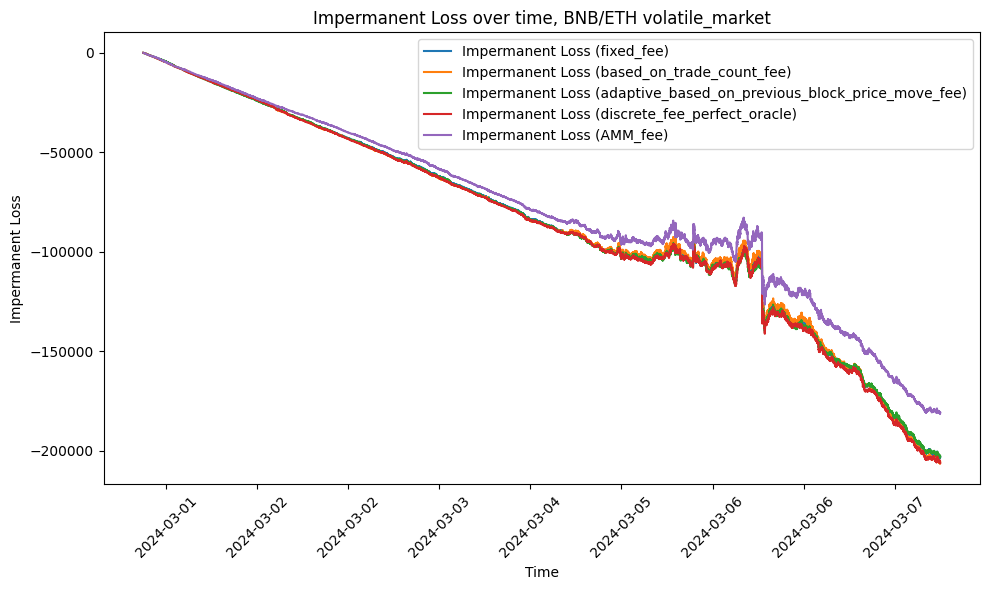

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,4818.44,776,5.60,-292973.24,25092,-55.28,168074.19,27.29,-203249.65
1,based_on_trade_count_fee,4922.17,765,5.76,-293628.12,25022,-55.57,170196.49,27.73,-205708.56
2,adaptive_based_on_previous_block_price_move_fee,4867.78,881,5.08,-292432.20,25027,-55.33,166712.02,26.70,-202990.00
3,discrete_fee_perfect_oracle,3564.21,547,5.80,-293791.51,25106,-55.41,172886.70,29.22,-206102.21
4,AMM_fee,15384.75,2918,4.80,-294487.68,25071,-55.64,126938.19,14.94,-181005.10


In [ ]:
plot_results_for_period(
    "BNB/ETH volatile_market",
    list(fee_algos_to_consider.keys()),
)

#### DOGE/BTC

##### bull_market

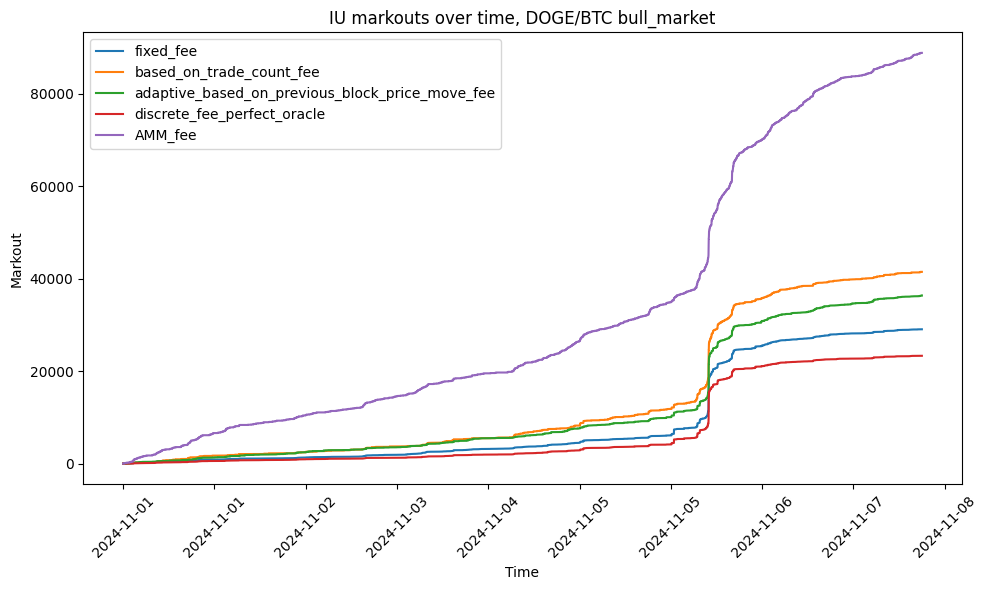

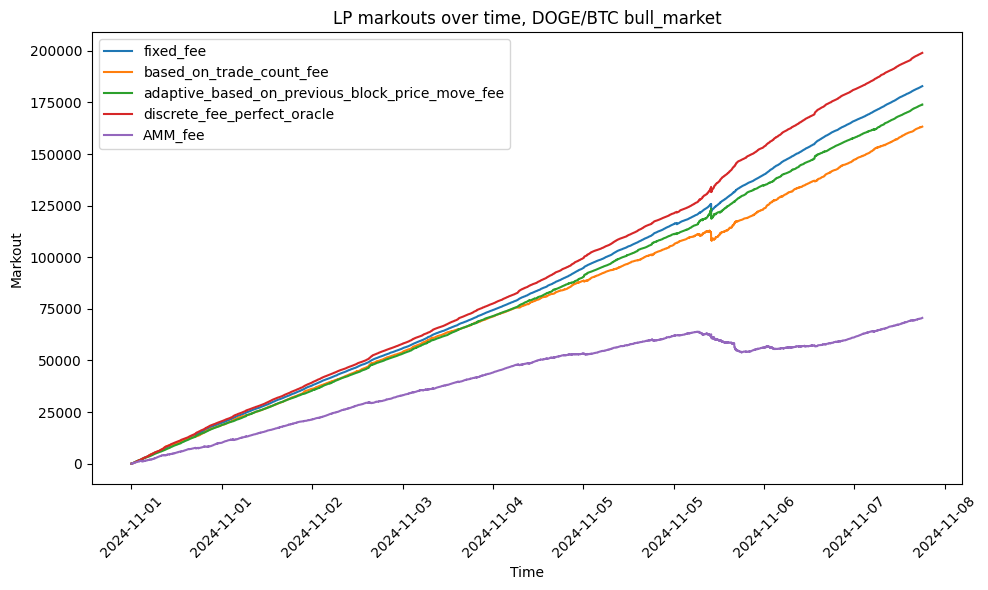

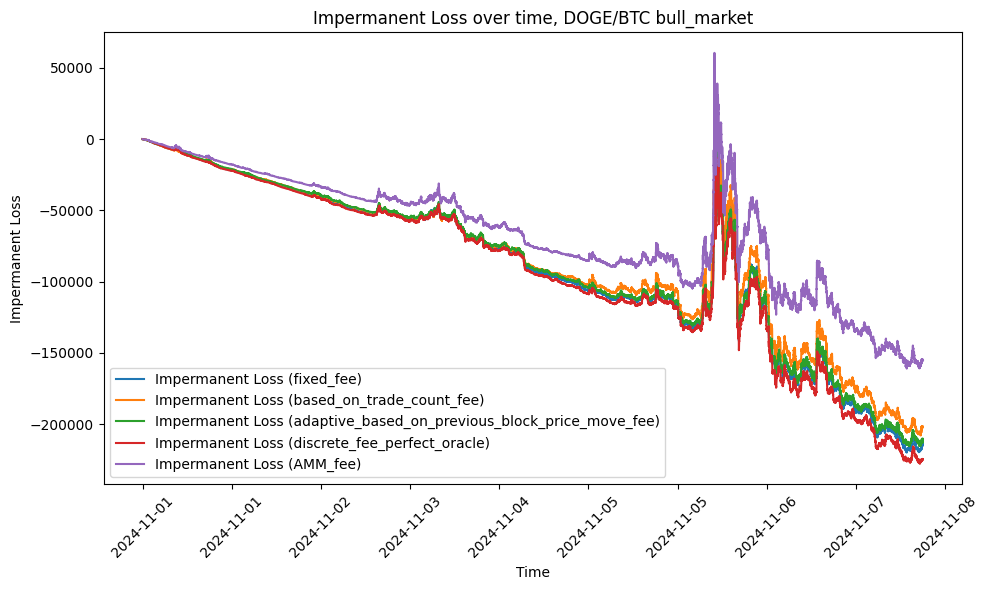

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,29042.39,1783,11.65,-287819.78,25012,-56.11,182889.42,23.99,-213636.07
1,based_on_trade_count_fee,41459.93,1069,19.47,-287733.05,24982,-56.19,163270.83,22.52,-202295.58
2,adaptive_based_on_previous_block_price_move_fee,36363.53,1327,15.87,-288099.30,25062,-56.06,173996.79,23.42,-210402.43
3,discrete_fee_perfect_oracle,23311.37,1319,12.67,-288378.12,25057,-56.11,199020.89,28.52,-224641.04
4,AMM_fee,88801.39,1178,24.09,-288479.82,25118,-56.05,70622.95,8.00,-155205.62


In [ ]:
plot_results_for_period(
    "DOGE/BTC bull_market",
    list(fee_algos_to_consider.keys()),
)

##### calm_market

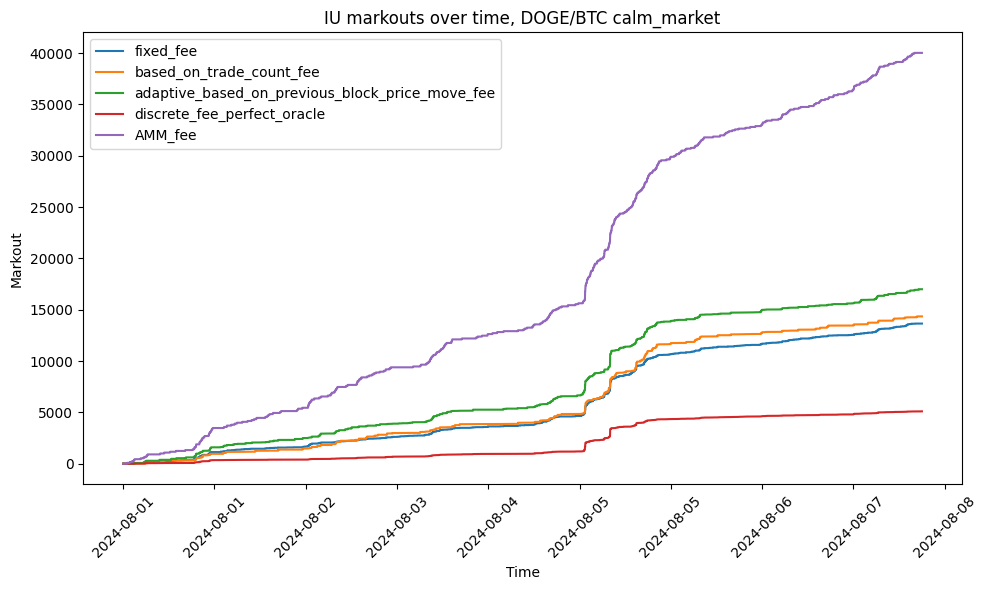

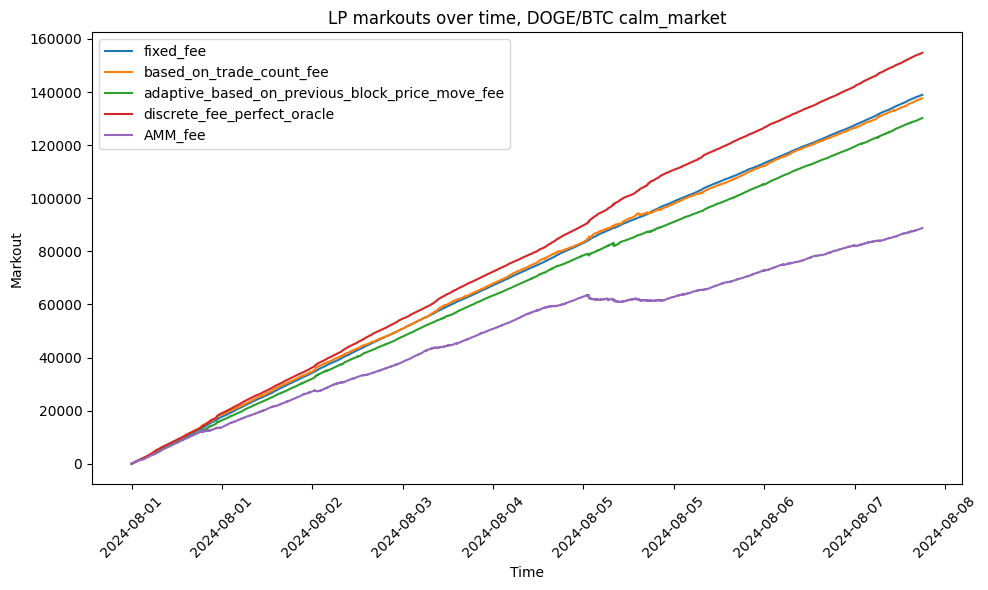

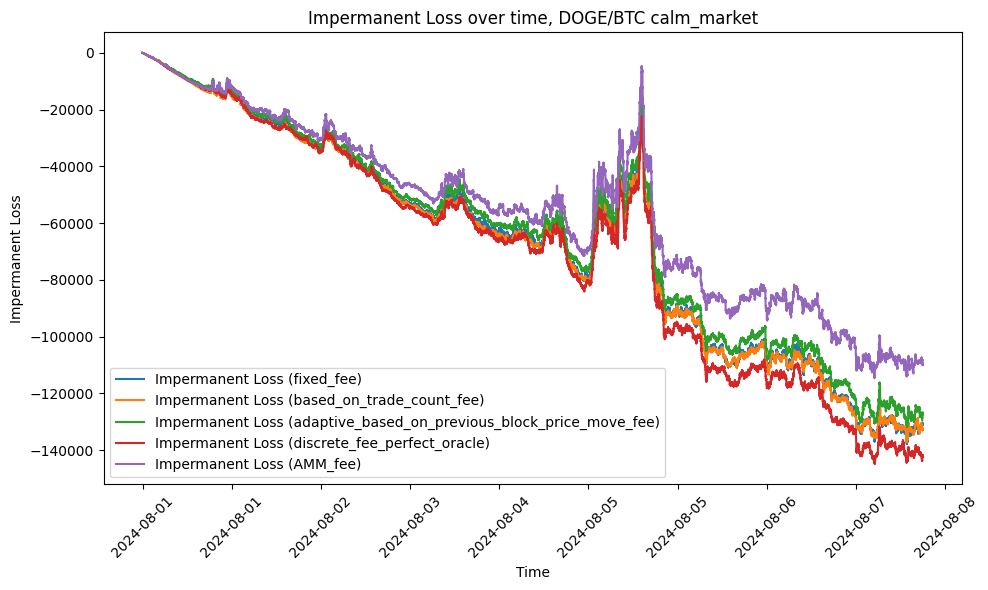

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,13651.47,542,14.47,-265003.67,25026,-59.42,138955.62,25.72,-130832.07
1,based_on_trade_count_fee,14350.46,536,17.84,-266603.34,25075,-59.65,137617.00,26.10,-132859.34
2,adaptive_based_on_previous_block_price_move_fee,16997.26,558,17.90,-263770.79,25015,-59.19,130210.14,24.09,-126938.59
3,discrete_fee_perfect_oracle,5102.54,788,6.35,-266508.00,25079,-59.64,154766.03,29.35,-142212.36
4,AMM_fee,40020.60,426,29.48,-266401.48,25145,-59.51,88848.91,15.23,-110024.03


In [ ]:
plot_results_for_period(
    "DOGE/BTC calm_market",
    list(fee_algos_to_consider.keys()),
)

##### bear_market

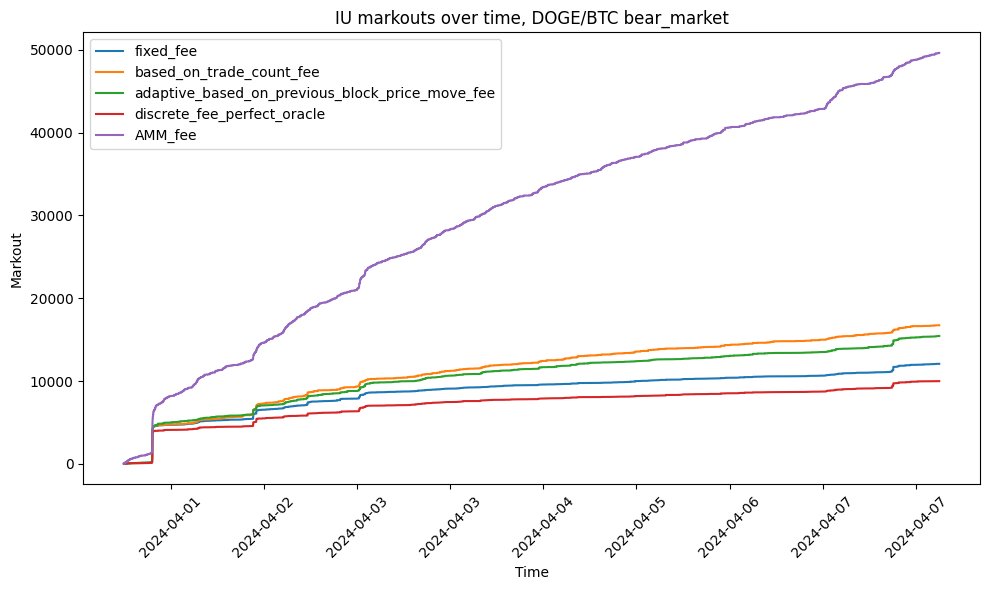

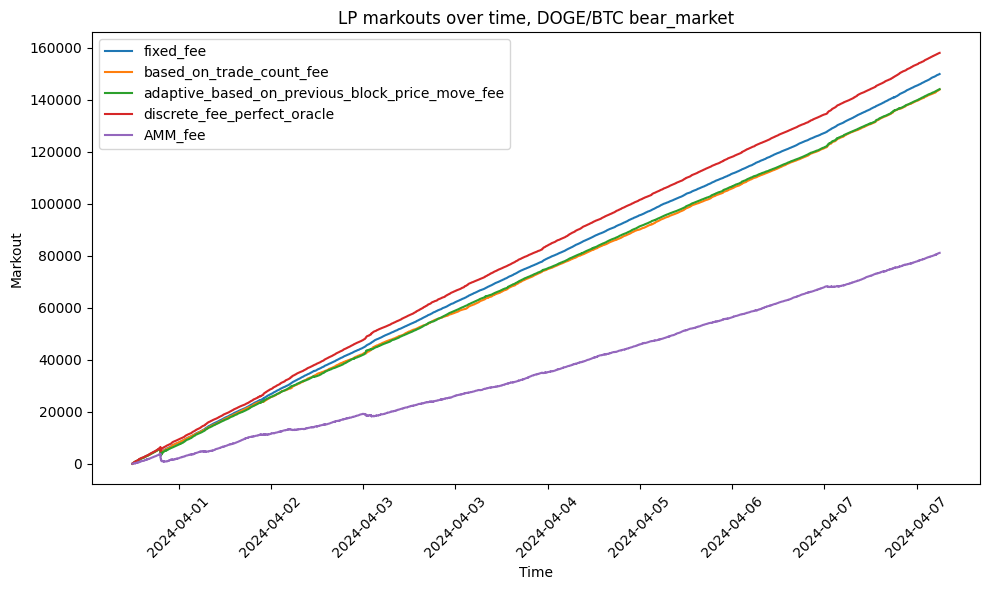

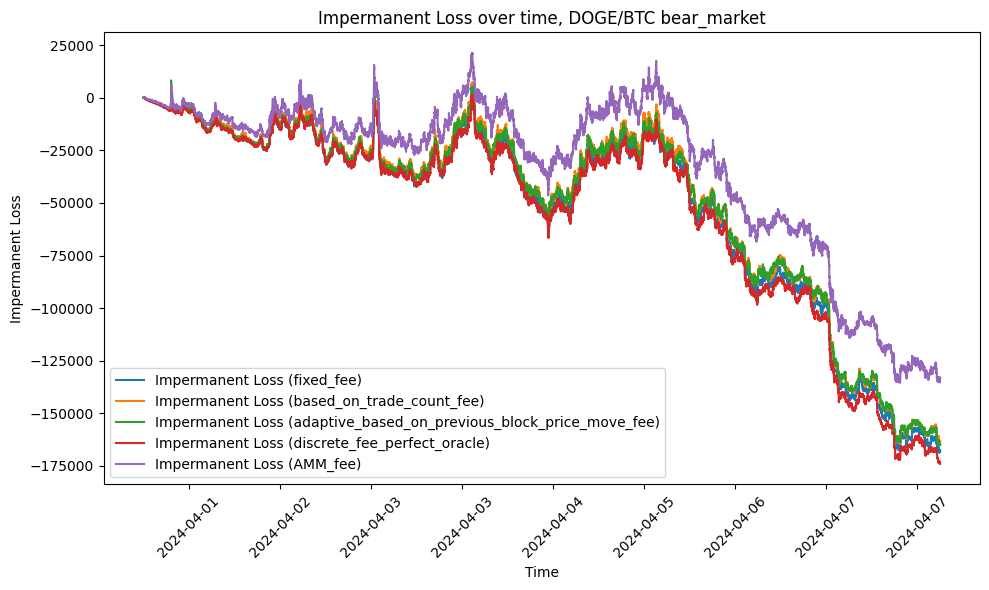

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,12078.46,1190,9.19,-267152.40,25074,-59.23,149832.28,25.73,-167907.08
1,based_on_trade_count_fee,16734.74,864,13.68,-267919.24,25068,-59.42,143876.47,25.10,-163577.18
2,adaptive_based_on_previous_block_price_move_fee,15440.18,1002,11.94,-266849.19,24986,-59.38,144033.15,24.89,-164878.99
3,discrete_fee_perfect_oracle,9982.43,854,10.36,-266914.40,25044,-59.26,157971.45,28.89,-173955.43
4,AMM_fee,49637.79,1047,20.19,-269764.93,25206,-59.53,81079.66,11.60,-132964.64


In [ ]:
plot_results_for_period(
    "DOGE/BTC bear_market",
    list(fee_algos_to_consider.keys()),
)

##### volatile_market

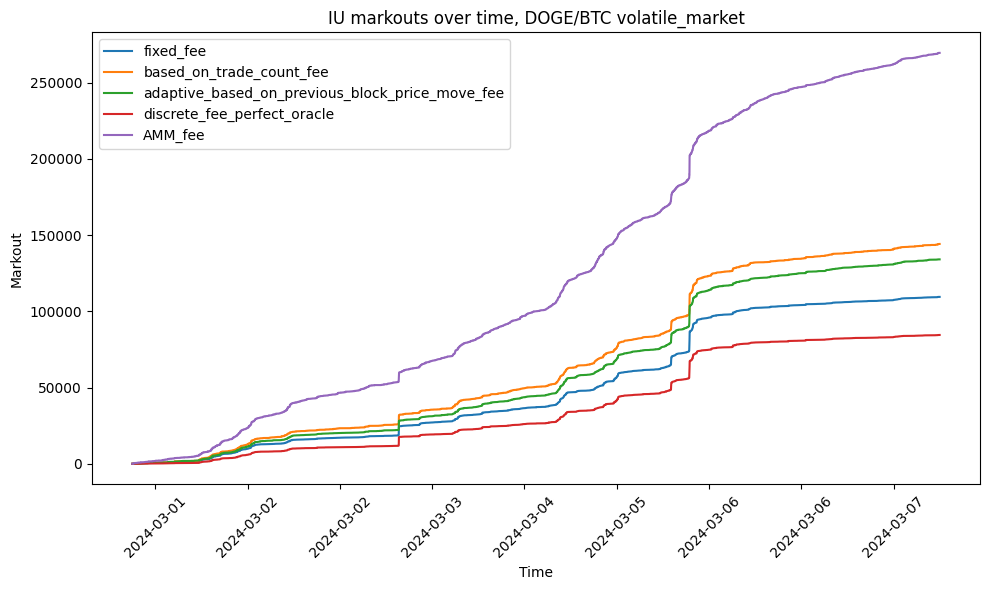

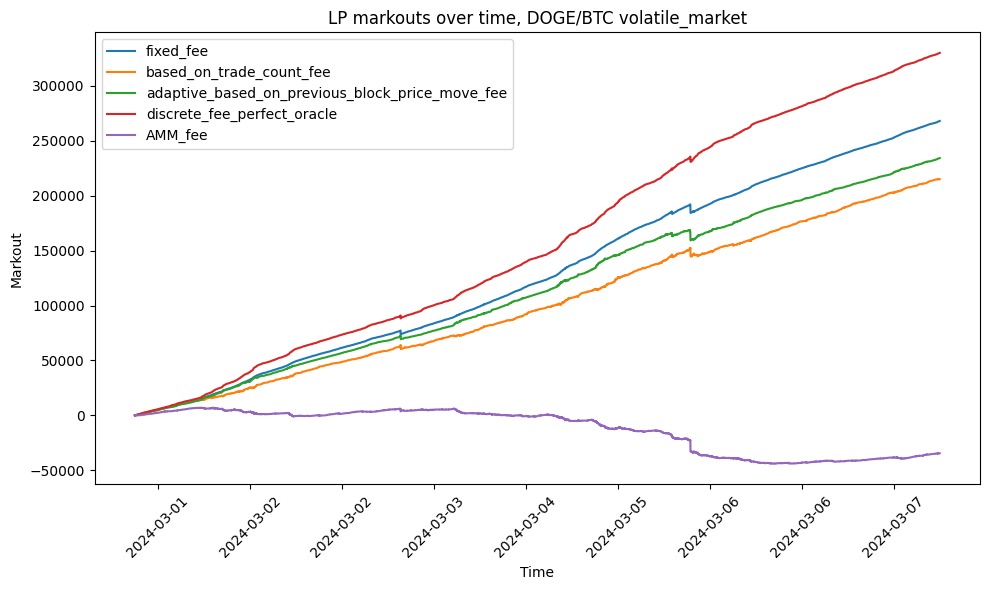

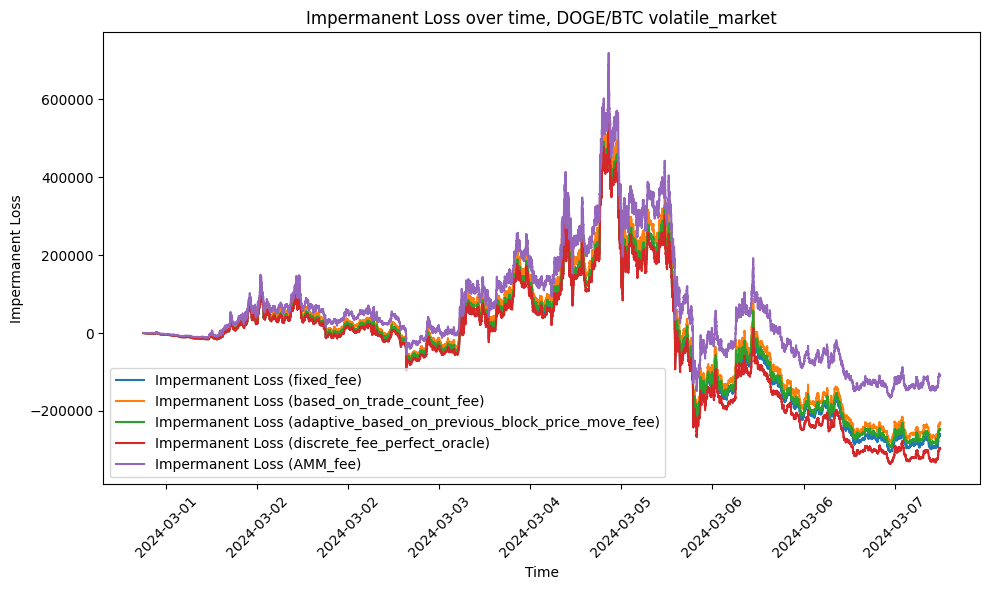

,experiment_name,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,fixed_fee,109495.62,4350,14.17,-312026.79,25133,-52.99,268026.37,19.69,-260620.45
1,based_on_trade_count_fee,144237.16,2794,21.34,-314833.02,25134,-53.48,215042.31,17.00,-229097.12
2,adaptive_based_on_previous_block_price_move_fee,134119.94,3229,18.90,-310216.12,25023,-52.89,234226.18,18.07,-246278.11
3,discrete_fee_perfect_oracle,84524.77,3422,14.35,-311898.29,25024,-53.15,329988.52,28.06,-295393.37
4,AMM_fee,269598.97,2776,26.92,-312127.72,25210,-53.00,-34545.43,-2.17,-108358.17


In [ ]:
plot_results_for_period(
    "DOGE/BTC volatile_market",
    list(fee_algos_to_consider.keys()),
)

### All results

In [ ]:
import pandas as pd
from visualizations.compare_fee_algoritms import get_experiments_summary_by_description
from experiments.run_multiple_experiments import convert_experiment_key_to_dict

summaries = []
for key, result in experiment_results.items():
    desc = convert_experiment_key_to_dict(key)
    from visualizations.compare_fee_algoritms import get_single_experiment_summary

    summaries.append(desc | get_single_experiment_summary(result))

combined_df = (
    pd.DataFrame(summaries).round(2).sort_values(by=["period_alias", "fee_algorithm"])
)
combined_df = combined_df.set_index(["period_alias"])

display(combined_df)

In [ ]:
combined_df.to_markdown()

'| period_alias              | fee_algorithm                                   |   iu_markout |   iu_trade_count |   iu_yield |   uu_markout |   uu_trade_count |   uu_yield |       lp_markout |   lp_yield |   impermanent_loss |\n|:--------------------------|:------------------------------------------------|-------------:|-----------------:|-----------:|-------------:|-----------------:|-----------:|-----------------:|-----------:|-------------------:|\n| BNB/ETH bear_market       | AMM_fee                                         |     35961.2  |             9856 |       3.81 | -1.17265e+06 |           107673 |     -58.34 | 497591           |      16.85 |  -534418           |\n| BNB/ETH bear_market       | adaptive_based_on_previous_block_price_move_fee |     11875.5  |             2734 |       4.52 | -1.17385e+06 |           107561 |     -58.41 | 613273           |      26.99 |  -589030           |\n| BNB/ETH bear_market       | based_on_trade_count_fee                        |     117

In [ ]:
# Styled table (same as fee_algorithms_comparison.ipynb)

df = combined_df.reset_index().round(2)


def highlight_periods(row):
    unique_periods = df["period_alias"].unique()
    colors = [
        "background-color: #f2f2f2;",
        "background-color: #d9eaf7;",
        "background-color: #eaf7d9;",
        "background-color: #fff6cc;",
    ]
    group_index = list(unique_periods).index(row["period_alias"])
    return [colors[group_index % len(colors)]] * len(row)


def make_numbers_bold(val):
    if isinstance(val, (int, float, str)):
        return "font-weight: bold; color: #000;"
    return ""


def format_numbers(val):
    if isinstance(val, (int, float)):
        return f"{val:.2f}"
    return val


styled_df = (
    df.style.apply(highlight_periods, axis=1)
    .applymap(make_numbers_bold)
    .format(format_numbers)
)
styled_df

/var/folders/wf/162bsgg10bbc8lvgn7cxh05r0000gn/T/ipykernel_82141/2577982847.py:32: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  .applymap(make_numbers_bold)


,period_alias,fee_algorithm,iu_markout,iu_trade_count,iu_yield,uu_markout,uu_trade_count,uu_yield,lp_markout,lp_yield,impermanent_loss
0,BNB/ETH bear_market,AMM_fee,35961.19,9856.00,3.81,-1172648.23,107673.00,-58.34,497591.15,16.85,-534418.41
1,BNB/ETH bear_market,adaptive_based_on_previous_block_price_move_fee,11875.48,2734.00,4.52,-1173849.35,107561.00,-58.41,613273.42,26.99,-589030.44
2,BNB/ETH bear_market,based_on_trade_count_fee,11762.72,2344.00,5.14,-1178903.87,107439.00,-58.71,627328.49,28.05,-601373.45
3,BNB/ETH bear_market,discrete_fee_perfect_oracle,8399.46,1678.00,5.10,-1172582.91,107495.00,-58.37,630974.60,29.03,-596739.10
4,BNB/ETH bear_market,fixed_fee,11691.38,2312.00,5.18,-1172668.68,107538.00,-58.36,616817.28,27.60,-588671.07
5,BNB/ETH bull_market,AMM_fee,54363.89,11965.00,4.03,-1321446.14,107489.00,-53.06,605757.65,15.78,-584378.65
6,BNB/ETH bull_market,adaptive_based_on_previous_block_price_move_fee,13364.37,3363.00,3.61,-1326749.10,107494.00,-53.20,780592.88,27.26,-683692.88
7,BNB/ETH bull_market,based_on_trade_count_fee,12957.16,2949.00,3.93,-1341851.04,107560.00,-53.75,802231.01,28.38,-705315.58
8,BNB/ETH bull_market,discrete_fee_perfect_oracle,9849.82,2013.00,4.28,-1324342.15,107428.00,-53.13,795666.71,29.22,-692608.51
9,BNB/ETH bull_market,fixed_fee,13102.56,2972.00,3.95,-1324058.04,107448.00,-53.12,781561.72,27.67,-676370.35
